# To make my life a bit easier...

In [1]:
def plot_sed(x, y, yerr):
    plt.clf()
    plt.errorbar(wavelength, flux, yerr=flux_err, c='red', ecolor='gray', capthick=2)
    plt.show()

In [2]:
def print_time(begin_time, end_time):
    """ 
    This function prints the time in minutes that a certain task took.
    """
    print ("--------------------------------------------------")
    print ("CPU process time: %.2f [min]" % np.round(float((end_time-start_time)/60)))
    print ("--------------------------------------------------")

In [3]:
plotpars = {'axes.labelsize': 18,
            'axes.linewidth': 1.,
            'figure.figsize': (7.,5.),
            'font.size': 12,
            'legend.frameon': True,
            'legend.framealpha': 0.85,
            'legend.edgecolor': 'black',
            'legend.loc': 'best',
            'legend.fontsize': 12,
            'mathtext.fontset': 'stixsans',
            'savefig.bbox': 'tight',
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
           }

# Packages

### General packages

In [4]:
import numpy             as np
import pandas            as pd
import matplotlib.pyplot as plt
import seaborn           as sns
import astropy.io.fits   as pf
import astropy.constants as ct
import os
import time
import scipy.interpolate as sci
import ipywidgets        as widgets

### pPXF imports

In [5]:
import ppxf.miles_util   as lib  # MILES library embedded in ppxf
import ppxf.ppxf_util    as util
import ppxf              as ppxf_module
from ppxf.ppxf           import ppxf
from ppxf.ppxf_util      import log_rebin

# Config. inputs

### Paths and files

In [6]:
seds_path    = '../../../../GAMADR3_SPECTRA/DATABASE/'
ppxf_dir     = os.path.dirname(os.path.realpath(ppxf_module.__file__))
miles_lib    = ppxf_dir+'/miles_models/Mun1.30*.fits'

In [7]:
data          = pd.read_csv('uv_redseq_psmed_oneneighbor_magphys.csv')

In [8]:
seds_list = []
for i in data['SPECID']: seds_list.append(i+'.fit')

### Constants

In [9]:
light_speed = float(str(ct.c.to('km/s')).split(' ')[0])            # selecting the numerical values 
                                                                   # (must be in km/s)
gama_resol  = 1300.

# Plot parameters (because I'm lazy)

In [10]:
plotpars = {'axes.linewidth': 1.,
            'axes.labelsize': 18,
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
            'legend.framealpha': 0.6,
            'legend.loc': 'upper right',
            'legend.fontsize': 12,
            }

In [11]:
palette      = ['#ef8a62','#f7f7f7','#67a9cf']
transparency = 0.8
lw           = 2.

# Spectral fitting

## Configuring inputs

### pPXF "fixed" parameters

In [12]:
# bounds_stars = [[], [0, 500], [], []]
# bounds_gas   = [[], [0, 500]] 
# bounds = [bounds_stars, bounds_gas]

In [13]:
# Fit (V, sig, h3, h4) moments=4 for the stars; (V, sig) moments=2 for the two gas kinematic components
moments        = [4, 2, 2]
degree         = -1       # Additive Legendre polynomial degrees
# degree         = 1        # Additive Legendre polynomial degrees
mdegree        = 150         # Multiplicative Legendre polynomial degrees
regul_err      = 0.01     # Desired regularization error -- TODO: MUST CHECK WHY 0.013
tied_balmer    = True
limit_doublets = False
stellar_comp_w = [0]        # weight of the stellar component
balmer_comp_w  = [1]        # weight of the balmer emission lines
forbid_comp_w  = [2]        # weight of the forbidden lines
# wl_min         = 3540       # MILES RANGE MIN
# wl_max         = 6750       # MILES RANGE MAX: 7409
wl_min = 4350               # removing the bluest part of the spectra in order to mitigate noise effects
wl_max = 7409

In [14]:
new_path = 'd'+str(degree)+'m'+str(mdegree)

In [15]:
results_path = '../../LargeFilesResults/PSM_analysis/'+ new_path

#### Checking if the directory exists and, if not, creating it!

In [16]:
if not os.path.exists(results_path): os.makedirs(results_path)

### pPXF loop

In [17]:
bar = widgets.IntProgress(value=0, min=0, max=len(seds_list)+1, step=0.5, description='Running pPXF:',
                          orientation='horizontal')
display(bar)

IntProgress(value=0, description='Running pPXF:', max=139)

In [18]:
mean_age   = []
mean_metal = []
mass2light = []
ids        = []
redshifts  = []
vel_disp   = []

In [19]:
outputs_physical_header = ['CATAID', 'VEL_DISP', 'CHI2', 'VELOCITY', '<logAge>', '<[M/H]>', 'MASS2LIGHT_R']
outputs_physical = []

In [20]:
plt.rcParams.update(plotpars)

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49499      1000     0.300     0.300
 comp.  1:     47589       383
 comp.  2:     47388         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1007
method = capfit; Jac calls: 14; Func calls: 2244; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1771       5.5   47589   383
Comp:  2       Unknown      1.023       3.5   47388     1
Comp:  2       Unknown     0.5781       3.5   47388     1
Comp:  2       Unknown          0       2.2   47388     1
Comp:  2       Unknown          0       1.4   47388     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.903
Current $\chi^2$: 0.1007
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


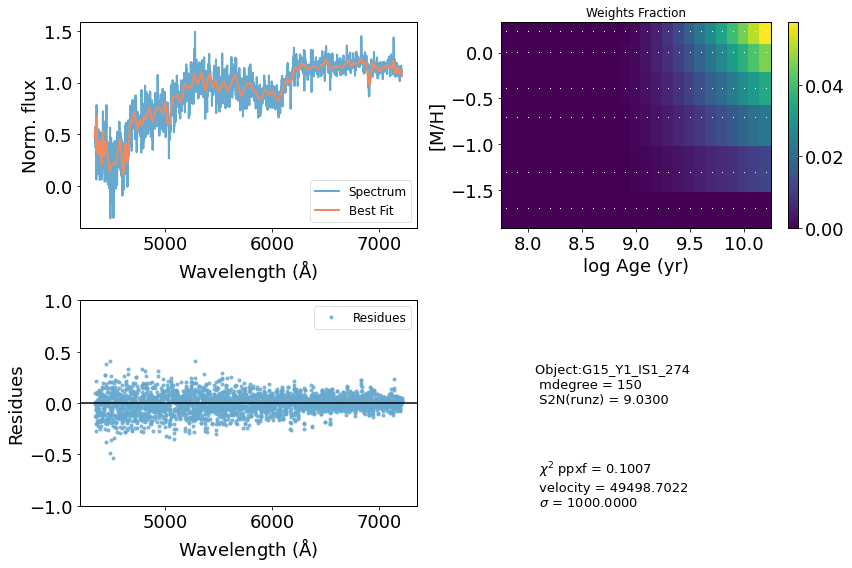

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45877      1000     0.300     0.300
 comp.  1:     44134       314
 comp.  2:     44149       211
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08395
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.6   44134   314
Comp:  2       Unknown          0       4.5   44149   211
Comp:  2       Unknown        1.6       3.4   44149   211
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.201
M/L_r: 2.756
Current $\chi^2$: 0.0840
Elapsed time in PPXF: 17.25 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


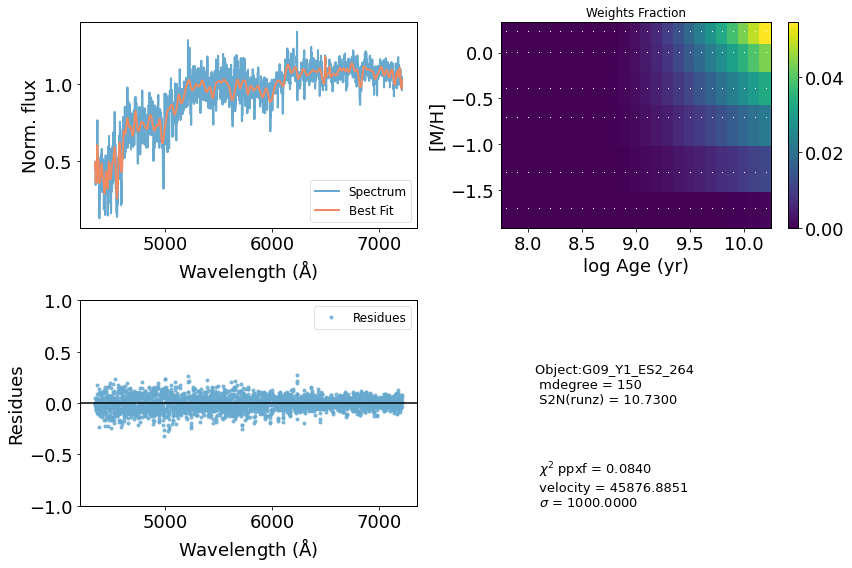

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40061      1000     0.300     0.300
 comp.  1:     37637       723
 comp.  2:     38322       101
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2715
method = capfit; Jac calls: 15; Func calls: 2408; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.937       7.6   37637   723
Comp:  2       Unknown          0       3.2   38322   101
Comp:  2       Unknown     0.3234         2   38322   101
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
M/L_r: 2.835
Current $\chi^2$: 0.2715
Elapsed time in PPXF: 16.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


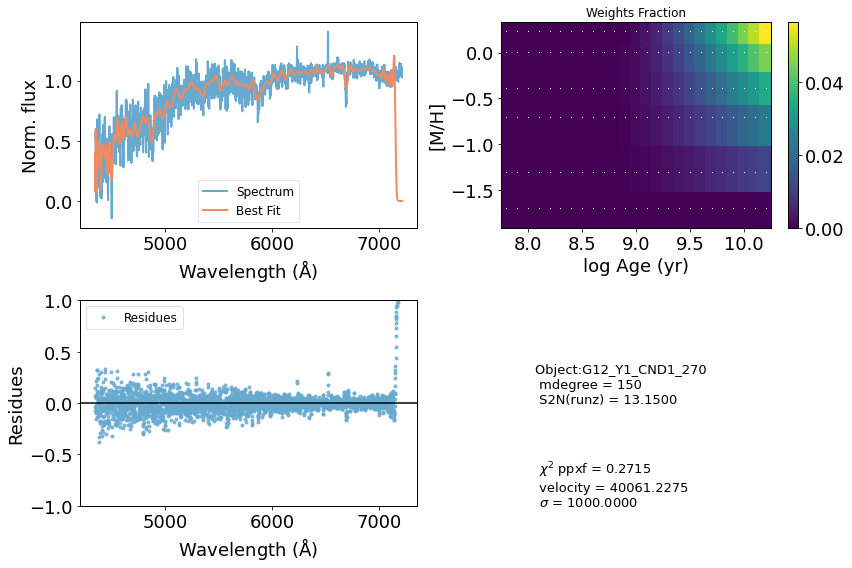

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41147      1000     0.239     0.300
 comp.  1:     39305       224
 comp.  2:     39147       180
Gas Reddening E(B-V): 6.156
chi2/DOF: 0.1848
method = capfit; Jac calls: 30; Func calls: 4808; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8742       2.3   39305   224
Comp:  2       Unknown          0       3.8   39147   180
Comp:  2       Unknown          0       2.8   39147   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
M/L_r: 2.856
Current $\chi^2$: 0.1848
Elapsed time in PPXF: 33.54 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


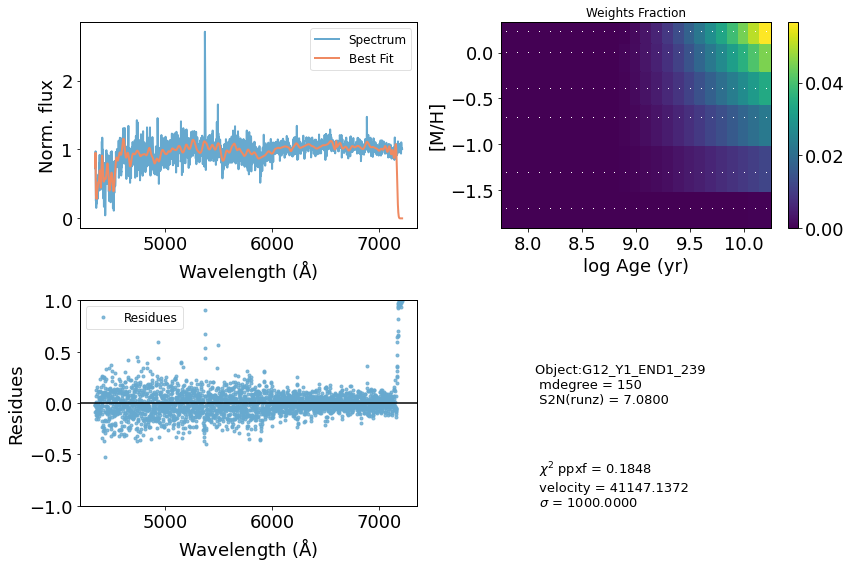

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64973      1000    -0.147     0.160
 comp.  1:     66841       121
 comp.  2:     67458        82
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006024
method = capfit; Jac calls: 30; Func calls: 4804; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  79 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.311       3.5   66841   121
Comp:  2       Unknown     0.2965       3.7   67458    82
Comp:  2       Unknown     0.1458       3.7   67458    82
Comp:  2       Unknown     0.9349       2.9   67458    82
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.266
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.266
M/L_r: 2.403
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 34.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


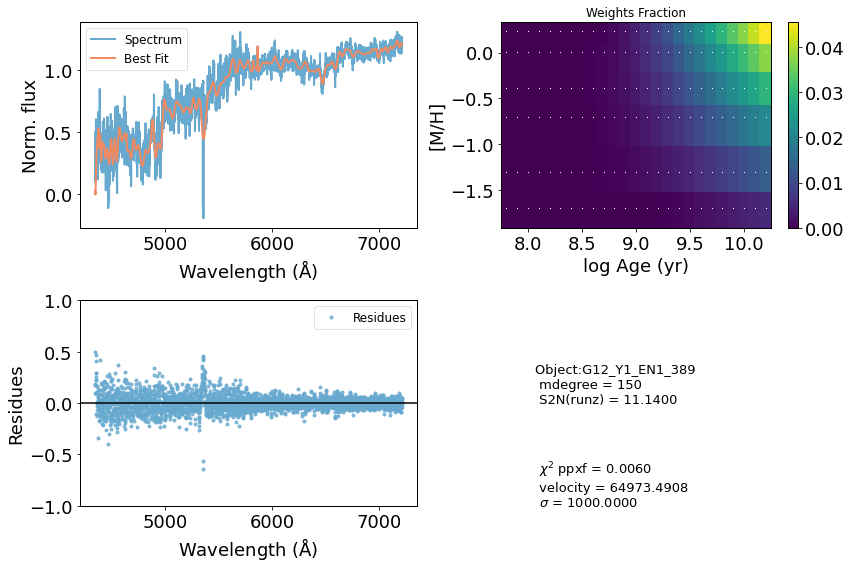

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36804      1000     0.214     0.300
 comp.  1:     35376        98
 comp.  2:     35167        48
Gas Reddening E(B-V): 7.115
chi2/DOF: 0.3112
method = capfit; Jac calls: 27; Func calls: 4324; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8148       1.5   35376    98
Comp:  2       Unknown          0       2.3   35167    48
Comp:  2       Unknown          0       1.6   35167    48
Comp:  2       Unknown     0.5218       1.6   35167    48
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.832
Current $\chi^2$: 0.3112
Elapsed time in PPXF: 30.66 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


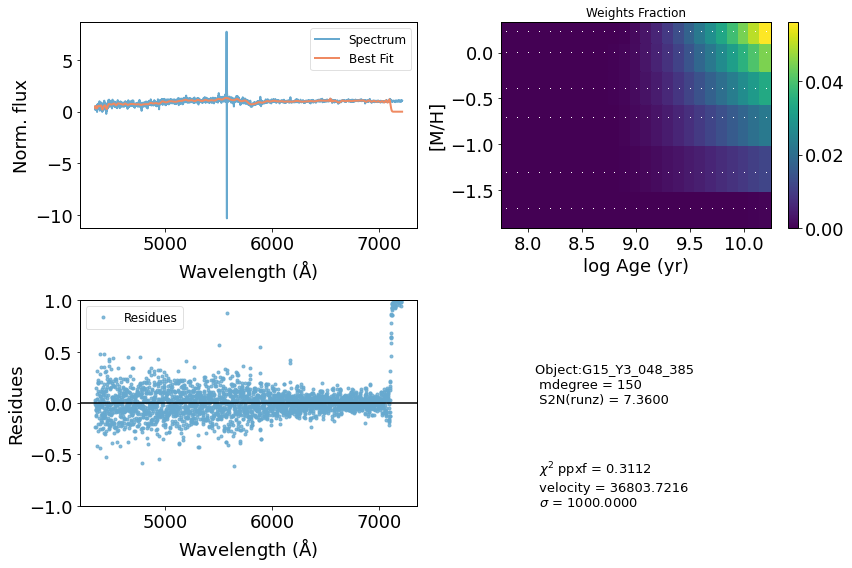

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59090      1000     0.242     0.160
 comp.  1:     58896      1000
 comp.  2:     58582       323
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01629
method = capfit; Jac calls: 11; Func calls: 1765; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      25.12        11   58896  1000
Comp:  2       Unknown          0        15   58582   323
Comp:  2       Unknown          0        15   58582   323
Comp:  2       Unknown      2.227         6   58582   323
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.246
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.246
M/L_r: 2.479
Current $\chi^2$: 0.0163
Elapsed time in PPXF: 11.27 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


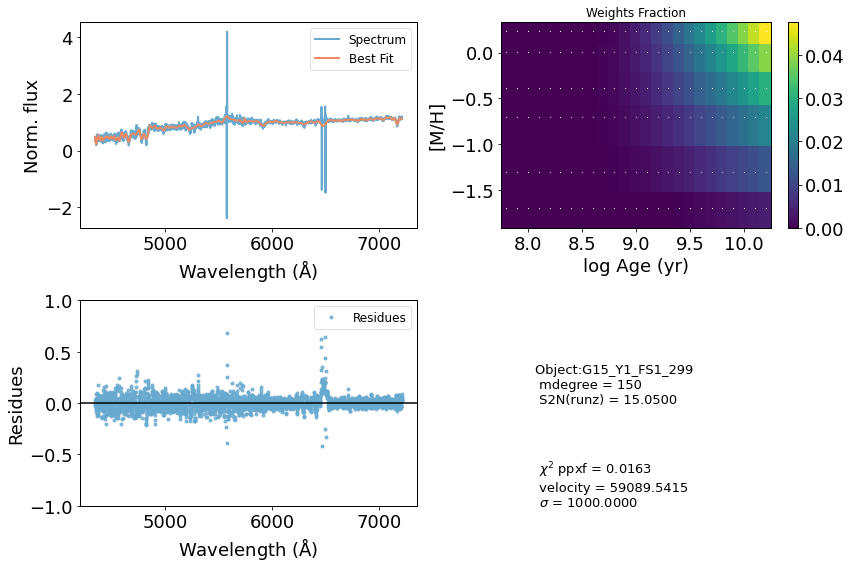

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51584      1000     0.300     0.300
 comp.  1:     49602       283
 comp.  2:     51155      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.08127
method = capfit; Jac calls: 24; Func calls: 3845; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.3   49602   283
Comp:  2       Unknown          0   9.6e+02   51155  1000
Comp:  2       Unknown      34.28   9.7e+02   51155  1000
Comp:  2       Unknown          0        10   51155  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.967
Current $\chi^2$: 0.0813
Elapsed time in PPXF: 24.96 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


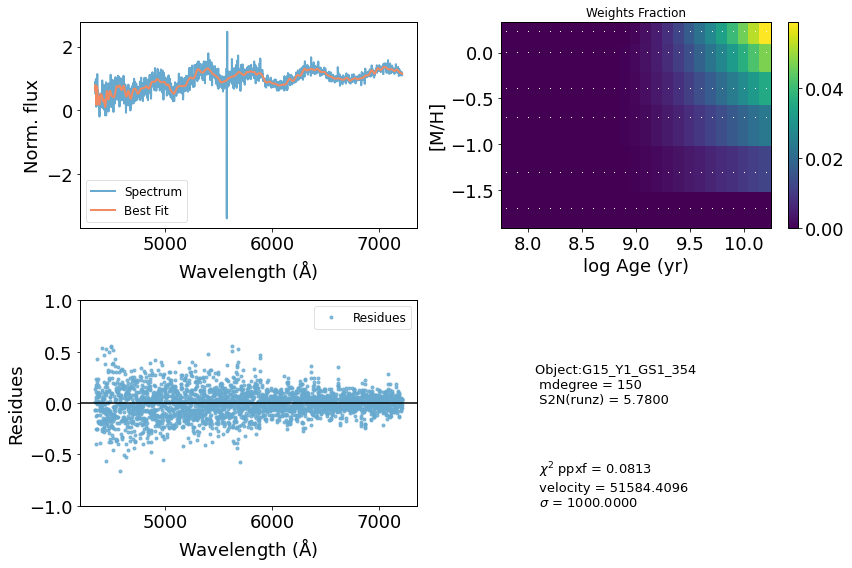

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54927      1000     0.300     0.300
 comp.  1:     53674       538
 comp.  2:     53331       118
Gas Reddening E(B-V): 6.436
chi2/DOF: 0.08751
method = capfit; Jac calls: 25; Func calls: 4004; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.856       2.5   53674   538
Comp:  2       Unknown      2.646       6.3   53331   118
Comp:  2       Unknown     0.5634        10   53331   118
Comp:  2       Unknown      0.746       4.6   53331   118
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 3.011
Current $\chi^2$: 0.0875
Elapsed time in PPXF: 29.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


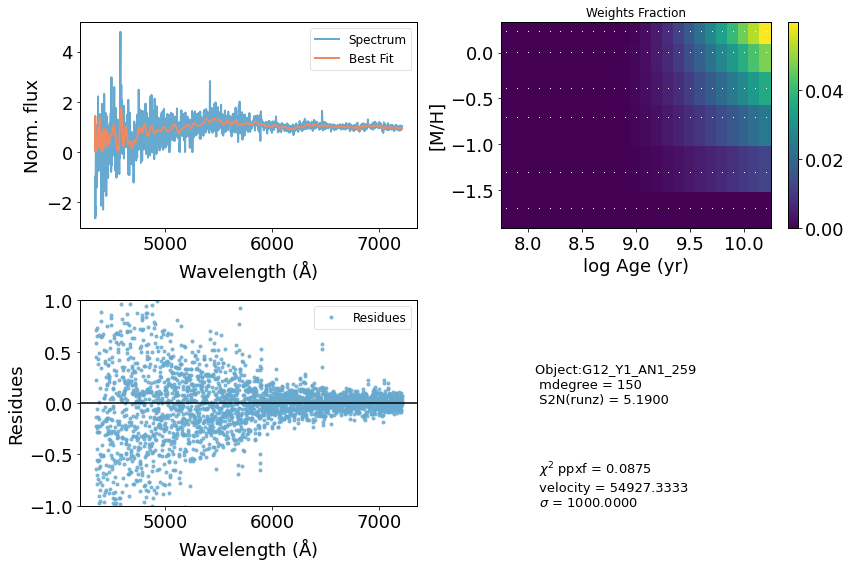

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47427      1000     0.300     0.300
 comp.  1:     45513       228
 comp.  2:     45567       423
Gas Reddening E(B-V): 1.631
chi2/DOF: 0.09384
method = capfit; Jac calls: 16; Func calls: 2567; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         3   45513   228
Comp:  2       Unknown          0       6.2   45567   423
Comp:  2       Unknown          0       4.5   45567   423
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
M/L_r: 2.813
Current $\chi^2$: 0.0938
Elapsed time in PPXF: 16.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


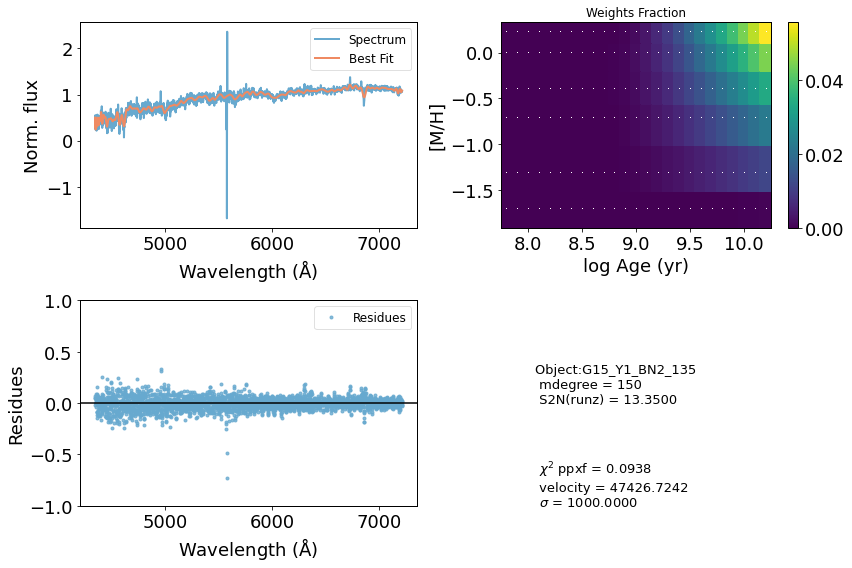

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43506      1000     0.300     0.300
 comp.  1:     41416       176
 comp.  2:     41736       207
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1489
method = capfit; Jac calls: 15; Func calls: 2405; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5584       3.5   41416   176
Comp:  2       Unknown     0.6027       4.7   41736   207
Comp:  2       Unknown          0       2.6   41736   207
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.83
Current $\chi^2$: 0.1489
Elapsed time in PPXF: 15.65 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


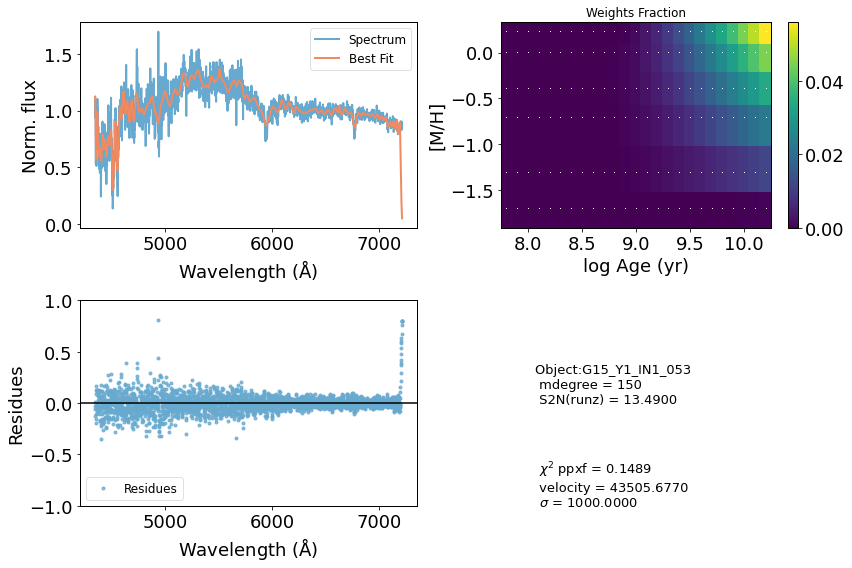

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51488      1000     0.300     0.300
 comp.  1:     50327       283
 comp.  2:     49837         1
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.1176
method = capfit; Jac calls: 17; Func calls: 2723; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9735       2.2   50327   283
Comp:  2       Unknown     0.0146      0.17   49837     1
Comp:  2       Unknown    0.02261      0.29   49837     1
Comp:  2       Unknown          0       1.9   49837     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.004
Current $\chi^2$: 0.1176
Elapsed time in PPXF: 16.99 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


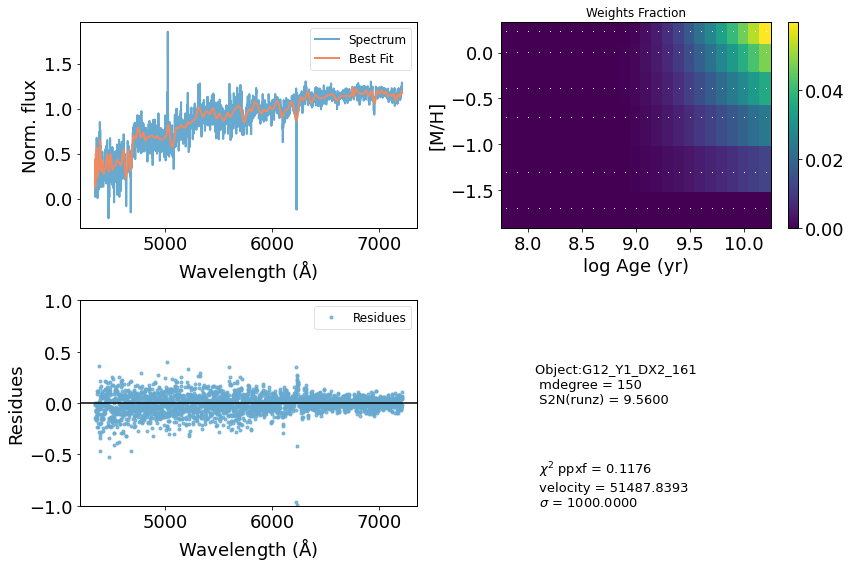

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33810      1000     0.161     0.300
 comp.  1:     32293       504
 comp.  2:     31443       337
Gas Reddening E(B-V): 0.567
chi2/DOF: 0.2207
method = capfit; Jac calls: 21; Func calls: 3365; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0        13   32293   504
Comp:  2       Unknown          0       5.3   31443   337
Comp:  2       Unknown     0.7767       4.6   31443   337
Comp:  2       Unknown          0       9.4   31443   337
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.788
Current $\chi^2$: 0.2207
Elapsed time in PPXF: 21.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


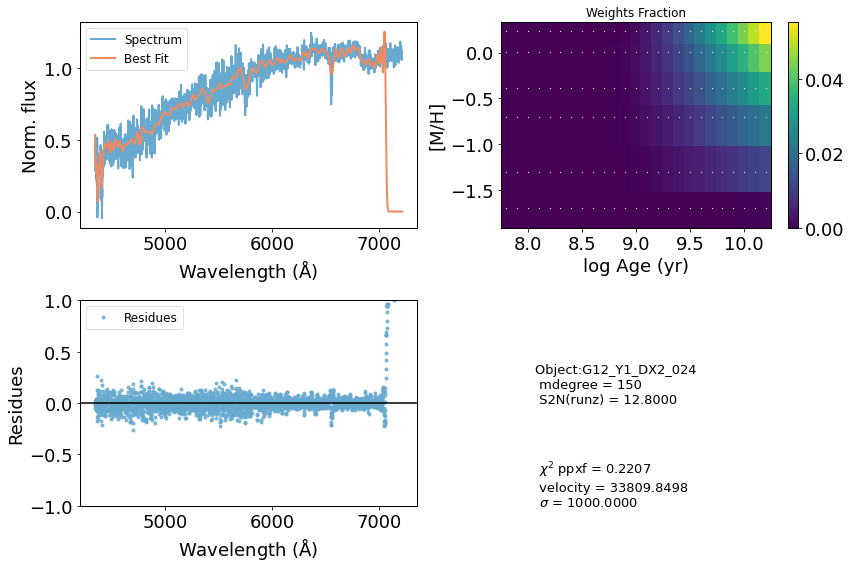

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46231      1000     0.281     0.300
 comp.  1:     44343       368
 comp.  2:     44449       467
Gas Reddening E(B-V): 7.837
chi2/DOF: 0.202
method = capfit; Jac calls: 20; Func calls: 3205; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   44343   368
Comp:  2       Unknown          0       6.3   44449   467
Comp:  2       Unknown      1.986       4.5   44449   467
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
M/L_r: 2.883
Current $\chi^2$: 0.2020
Elapsed time in PPXF: 19.91 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


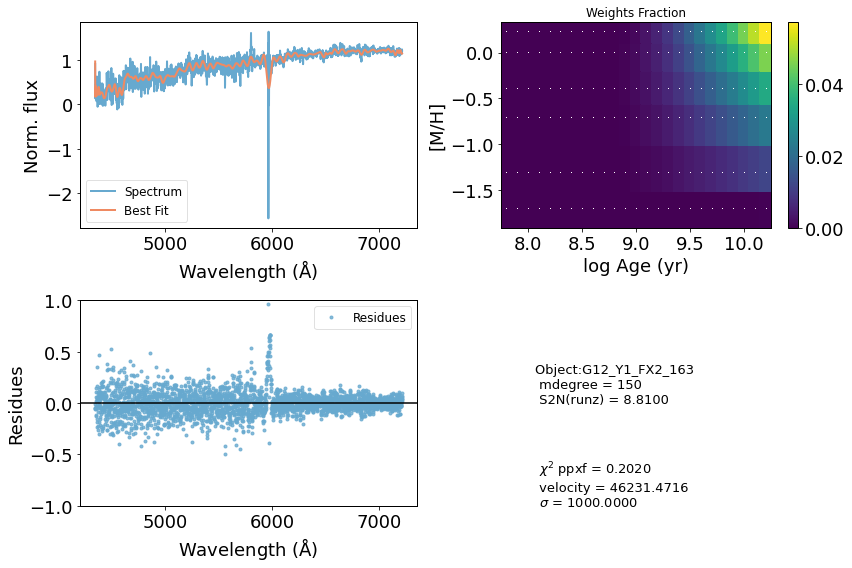

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52791      1000     0.300     0.300
 comp.  1:     50276       143
 comp.  2:     50901       278
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.07472
method = capfit; Jac calls: 16; Func calls: 2566; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  54 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7631       3.5   50276   143
Comp:  2       Unknown          0        11   50901   278
Comp:  2       Unknown      12.28        11   50901   278
Comp:  2       Unknown       1.39       5.7   50901   278
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.011
Current $\chi^2$: 0.0747
Elapsed time in PPXF: 16.50 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


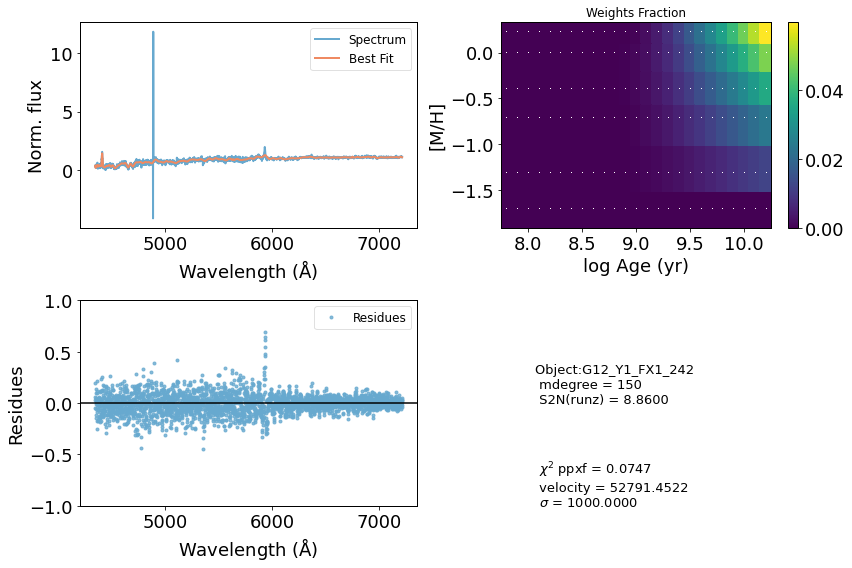

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58467      1000     0.300     0.300
 comp.  1:     56193       181
 comp.  2:     56467       180
Gas Reddening E(B-V): 6.802
chi2/DOF: 0.008007
method = capfit; Jac calls: 14; Func calls: 2246; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5708       2.3   56193   181
Comp:  2       Unknown          0       2.9   56467   180
Comp:  2       Unknown          0       5.3   56467   180
Comp:  2       Unknown          0       5.3   56467   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.05
Current $\chi^2$: 0.0080
Elapsed time in PPXF: 14.29 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


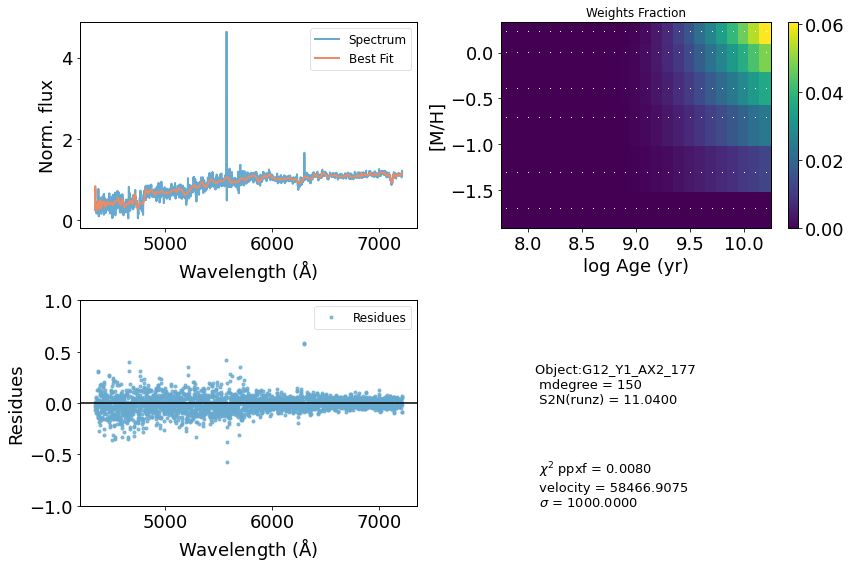

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45923      1000     0.300     0.300
 comp.  1:     44147       103
 comp.  2:     43927        84
Gas Reddening E(B-V): 0.245
chi2/DOF: 0.12
method = capfit; Jac calls: 24; Func calls: 3844; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7995       3.3   44147   103
Comp:  2       Unknown          0       3.6   43927    84
Comp:  2       Unknown     0.7271       2.3   43927    84
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.879
Current $\chi^2$: 0.1200
Elapsed time in PPXF: 24.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


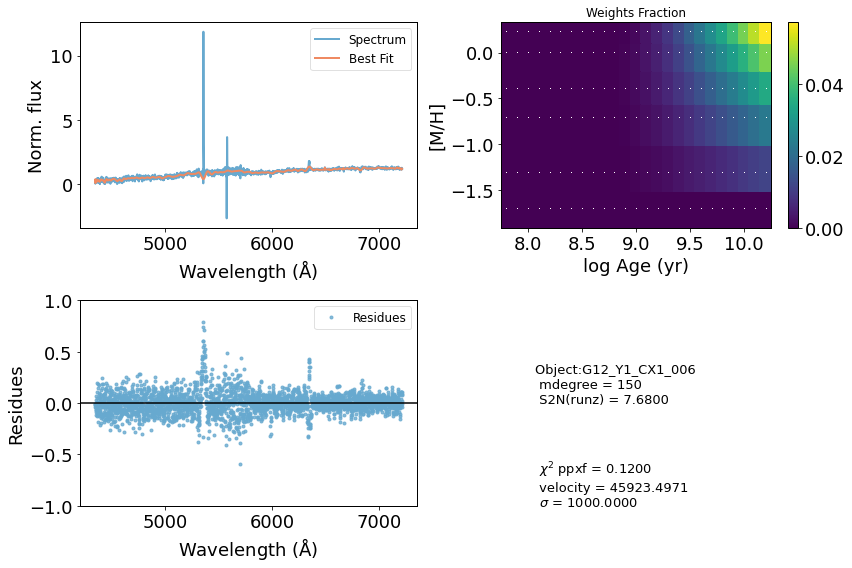

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52910      1000     0.300     0.300
 comp.  1:     50807         1
 comp.  2:     51254        54
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.07134
method = capfit; Jac calls: 20; Func calls: 3202; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.06058       2.2   50807     1
Comp:  2       Unknown     0.7583       3.2   51254    54
Comp:  2       Unknown     0.3925       3.2   51254    54
Comp:  2       Unknown     0.3664       2.9   51254    54
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.952
Current $\chi^2$: 0.0713
Elapsed time in PPXF: 20.66 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


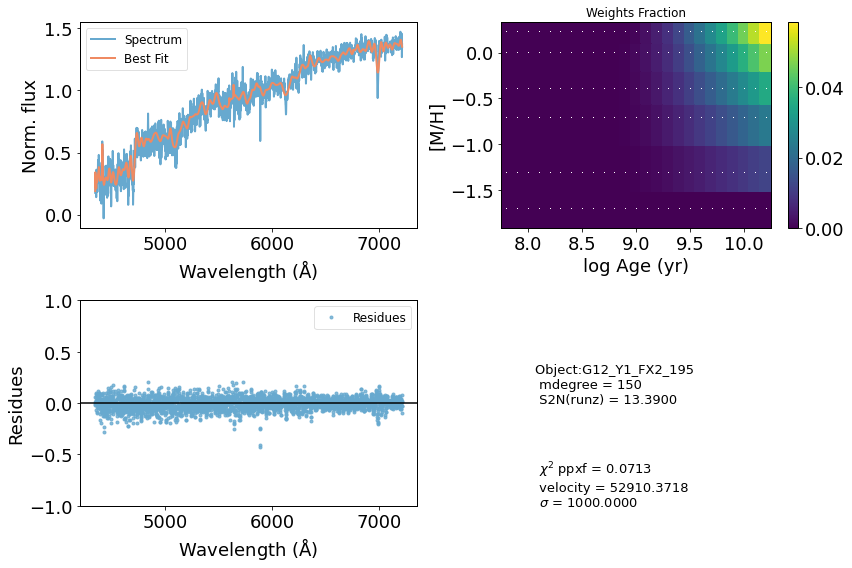

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24519      1000     0.042     0.287
 comp.  1:     22639       351
 comp.  2:     22935       416
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3999
method = capfit; Jac calls: 22; Func calls: 3524; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  69 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.092       6.5   22639   351
Comp:  2       Unknown     0.3305       3.8   22935   416
Comp:  2       Unknown          0       3.7   22935   416
Comp:  2       Unknown          0       5.9   22935   416
Comp:  2       Unknown          0       4.3   22935   416
Comp:  2       Unknown      2.338       4.2   22935   416
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.223
Weighted <logAge> [yr]: 9.83
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


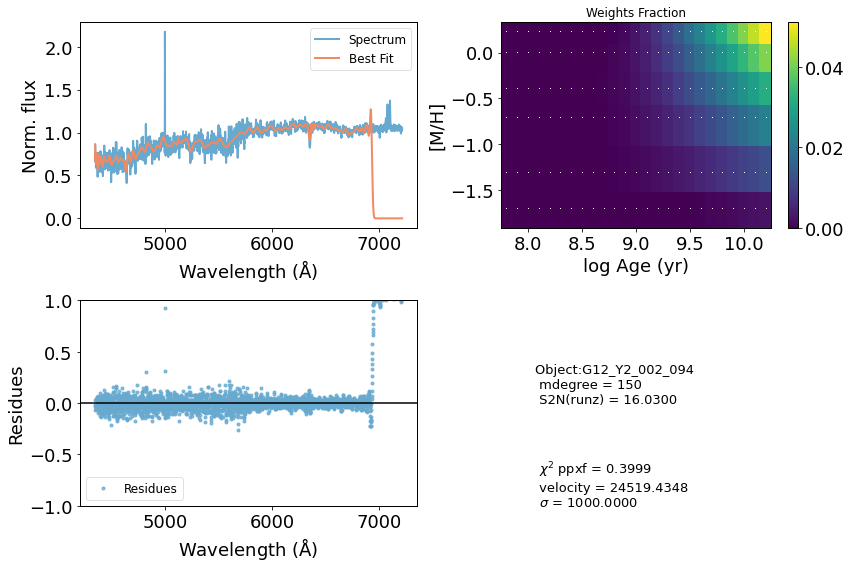

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50245      1000     0.300     0.300
 comp.  1:     48123       322
 comp.  2:     48342       272
Gas Reddening E(B-V): 3.621
chi2/DOF: 0.07912
method = capfit; Jac calls: 18; Func calls: 2884; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8799       3.1   48123   322
Comp:  2       Unknown      1.007        11   48342   272
Comp:  2       Unknown      1.669        11   48342   272
Comp:  2       Unknown          0       6.1   48342   272
Comp:  2       Unknown      0.772       3.9   48342   272
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.861
Current $\chi^2$: 0.0791
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


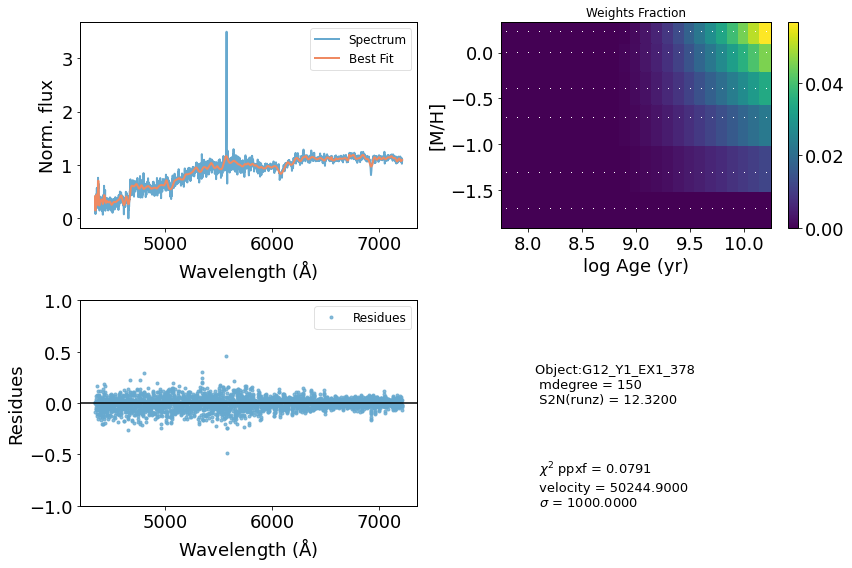

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53065      1000     0.300     0.300
 comp.  1:     51558        28
 comp.  2:     51466      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.05866
method = capfit; Jac calls: 19; Func calls: 3042; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.08014       1.1   51558    28
Comp:  2       Unknown          0   7.8e+02   51466  1000
Comp:  2       Unknown     0.2023   7.9e+02   51466  1000
Comp:  2       Unknown      10.78        10   51466  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.941
Current $\chi^2$: 0.0587
Elapsed time in PPXF: 19.42 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


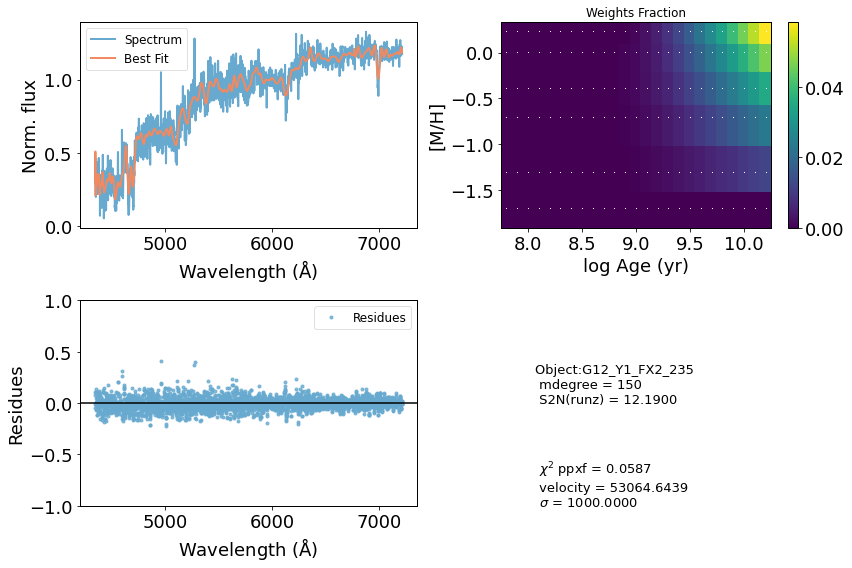

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72942       974    -0.053     0.032
 comp.  1:     72789       454
 comp.  2:     73057       624
Gas Reddening E(B-V): 0.001
chi2/DOF: 0.009437
method = capfit; Jac calls: 10; Func calls: 1606; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.5   72789   454
Comp:  2       Unknown          0        34   73057   624
Comp:  2       Unknown       11.1        34   73057   624
Comp:  2       Unknown     0.5881       6.2   73057   624
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.336
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.336
M/L_r: 2.195
Current $\chi^2$: 0.0094
Elapsed time in PPXF: 10.27 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


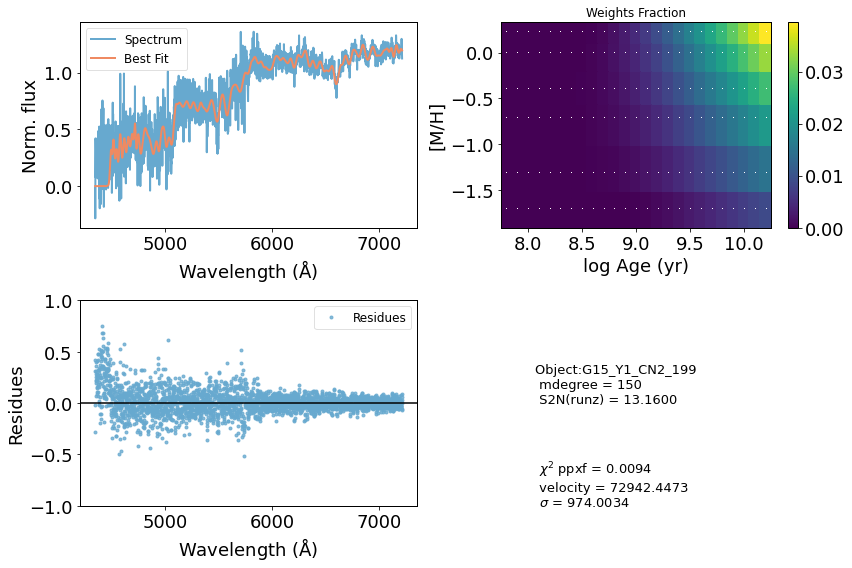

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48325      1000     0.300     0.300
 comp.  1:     46788       370
 comp.  2:     46423       339
Gas Reddening E(B-V): 1.179
chi2/DOF: 0.1157
method = capfit; Jac calls: 15; Func calls: 2408; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  52 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.5   46788   370
Comp:  2       Unknown          0       6.3   46423   339
Comp:  2       Unknown     0.2572       6.9   46423   339
Comp:  2       Unknown          0       3.4   46423   339
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.892
Current $\chi^2$: 0.1157
Elapsed time in PPXF: 15.20 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


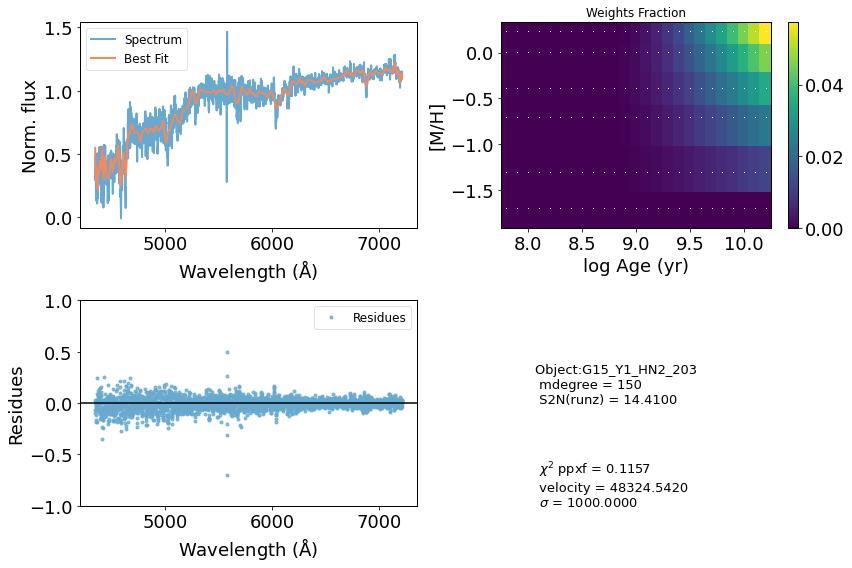

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60039       933     0.065     0.040
 comp.  1:     59405       329
 comp.  2:     60131       341
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00998
method = capfit; Jac calls: 15; Func calls: 2406; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  91 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.613       6.9   59405   329
Comp:  2       Unknown          0        13   60131   341
Comp:  2       Unknown          0        13   60131   341
Comp:  2       Unknown          0       5.9   60131   341
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.271
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.271
M/L_r: 1.884
Current $\chi^2$: 0.0100
Elapsed time in PPXF: 15.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


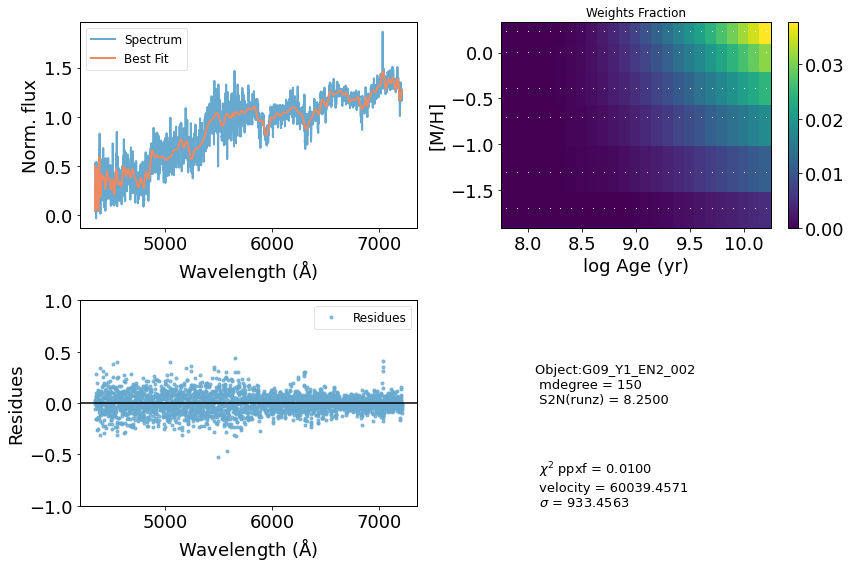

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35153       180     0.000     0.000
 comp.  1:     35153       180
 comp.  2:     35153       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2714
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.944         4   35153   180
Comp:  2       Unknown     0.5013       3.9   35153   180
Comp:  2       Unknown     0.3862       2.8   35153   180
Comp:  2       Unknown      1.654         3   35153   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.198
M/L_r: 3.253
Current $\chi^2$: 0.2714
Elapsed time in PPXF: 1.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


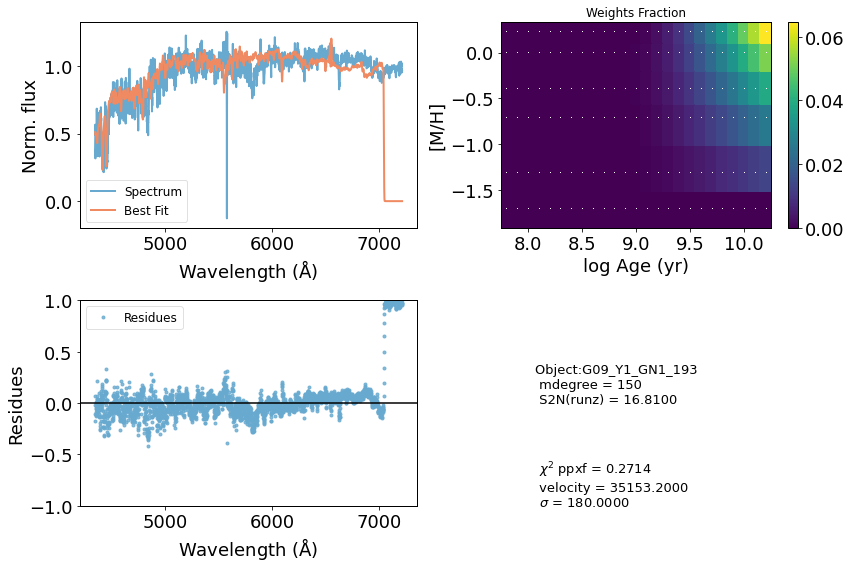

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48222      1000     0.300     0.300
 comp.  1:     46436        42
 comp.  2:     46468        15
Gas Reddening E(B-V): 4.411
chi2/DOF: 0.0845
method = capfit; Jac calls: 19; Func calls: 3045; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2008       1.2   46436    42
Comp:  2       Unknown     0.3766       2.9   46468    15
Comp:  2       Unknown      1.459       3.8   46468    15
Comp:  2       Unknown    0.07061       1.4   46468    15
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.864
Current $\chi^2$: 0.0845
Elapsed time in PPXF: 19.25 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


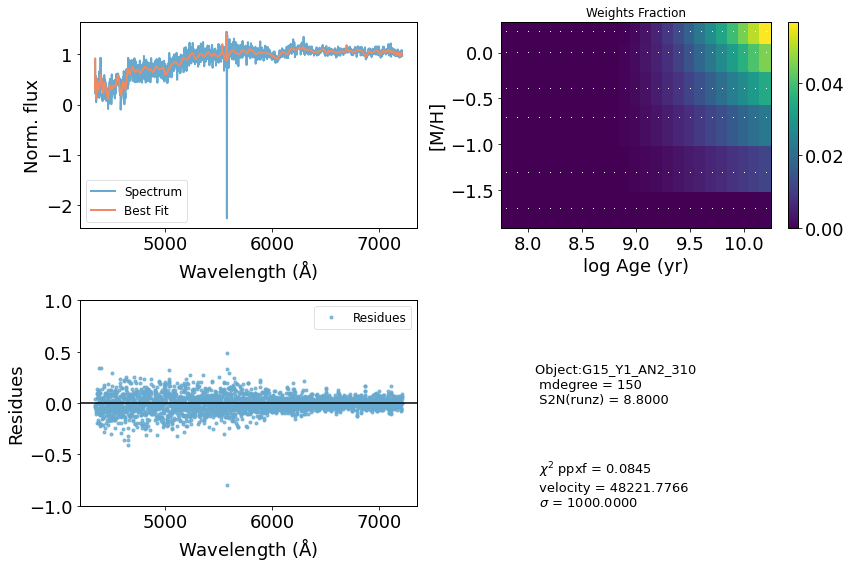

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36735       377     0.010     0.015
 comp.  1:     36457       540
 comp.  2:     36640       140
Gas Reddening E(B-V): 0.080
chi2/DOF: 0.4095
method = capfit; Jac calls: 6; Func calls: 968; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.55       7.8   36457   540
Comp:  2       Unknown      2.558       3.5   36640   140
Comp:  2       Unknown          0       2.7   36640   140
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.882
Current $\chi^2$: 0.4095
Elapsed time in PPXF: 6.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


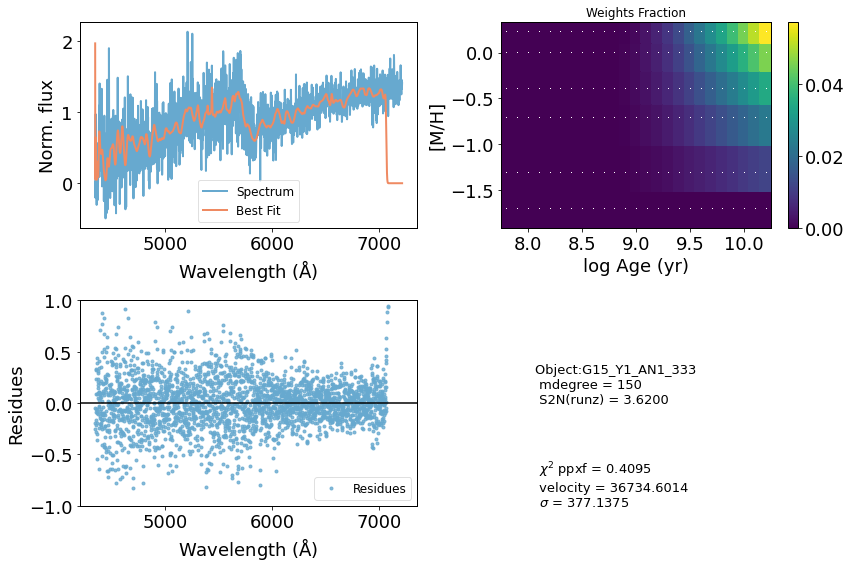

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48019      1000     0.300     0.300
 comp.  1:     47786       563
 comp.  2:     46014         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1117
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.292       7.8   47786   563
Comp:  2       Unknown          0       2.3   46014     1
Comp:  2       Unknown          0       1.5   46014     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.026
Current $\chi^2$: 0.1117
Elapsed time in PPXF: 17.98 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


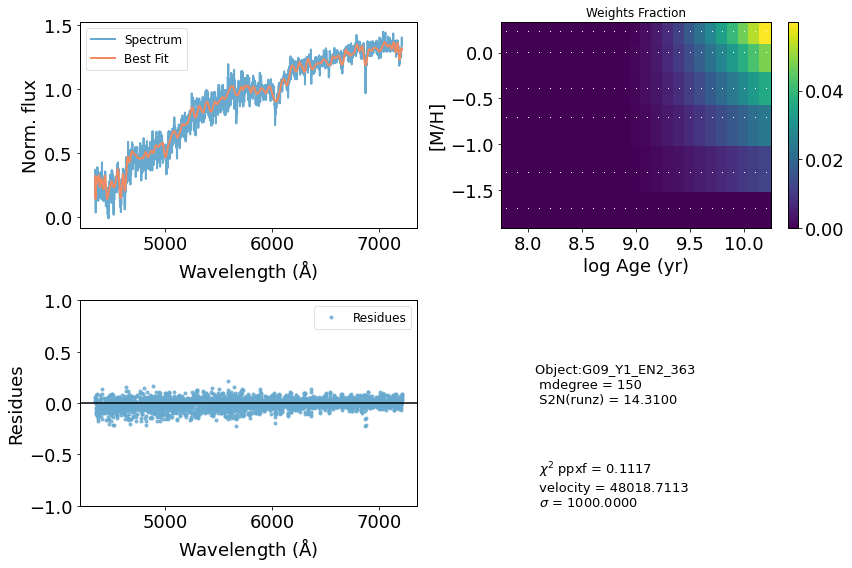

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43258      1000     0.300     0.300
 comp.  1:     41465         1
 comp.  2:     41308       248
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.2187
method = capfit; Jac calls: 18; Func calls: 2884; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1267         2   41465     1
Comp:  2       Unknown          0       4.7   41308   248
Comp:  2       Unknown          0       3.2   41308   248
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.937
Current $\chi^2$: 0.2187
Elapsed time in PPXF: 17.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


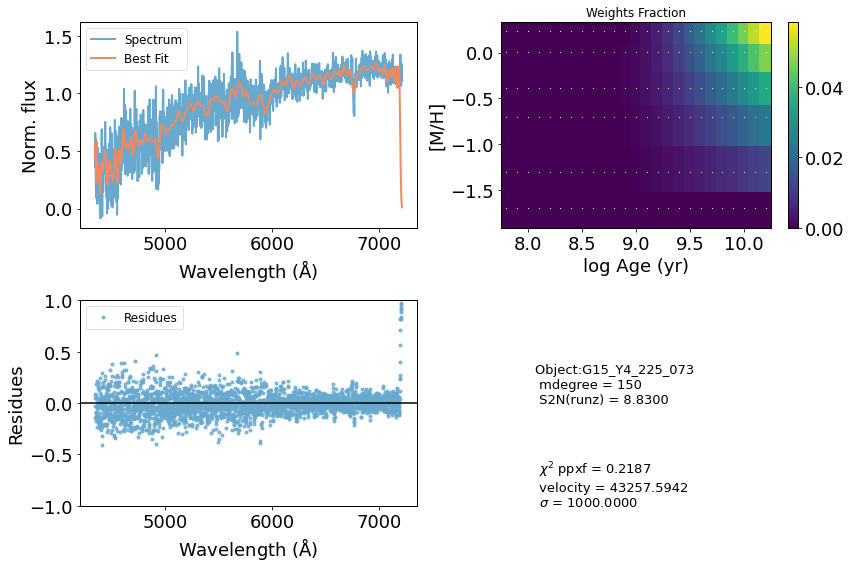

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     27447       460     0.000     0.001
 comp.  1:     27289       351
 comp.  2:     26951       127
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.439
method = capfit; Jac calls: 7; Func calls: 1130; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  68 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.917       5.3   27289   351
Comp:  2       Unknown          0       1.8   26951   127
Comp:  2       Unknown     0.1443       1.9   26951   127
Comp:  2       Unknown     0.4816       3.5   26951   127
Comp:  2       Unknown     0.7672       2.9   26951   127
Comp:  2       Unknown      0.183       2.2   26951   127
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.21
Weighted <logAge> [yr]: 9.83
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


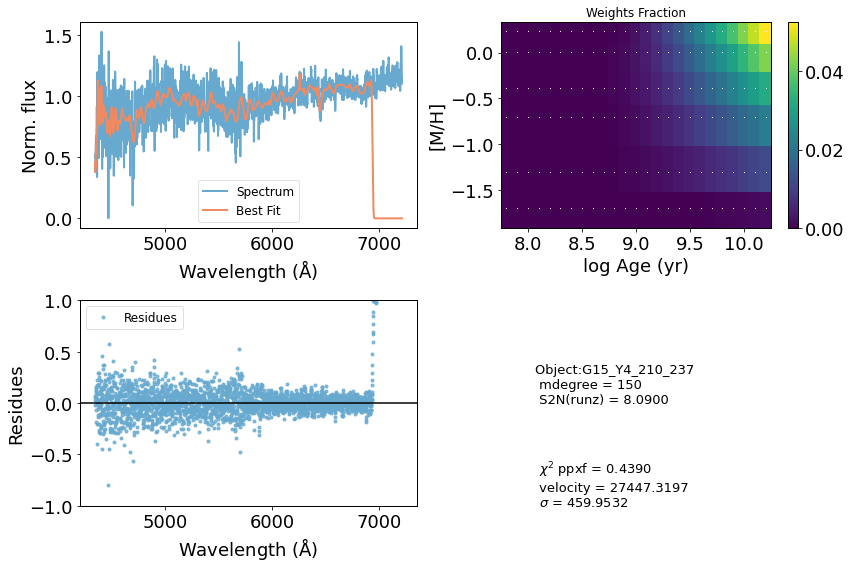

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36555      1000     0.272     0.300
 comp.  1:     34808       254
 comp.  2:     34545        68
Gas Reddening E(B-V): 7.813
chi2/DOF: 0.2793
method = capfit; Jac calls: 18; Func calls: 2888; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.8   34808   254
Comp:  2       Unknown     0.5711       2.6   34545    68
Comp:  2       Unknown          0       2.7   34545    68
Comp:  2       Unknown          0       1.8   34545    68
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.202
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.202
M/L_r: 2.799
Current $\chi^2$: 0.2793
Elapsed time in PPXF: 18.10 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


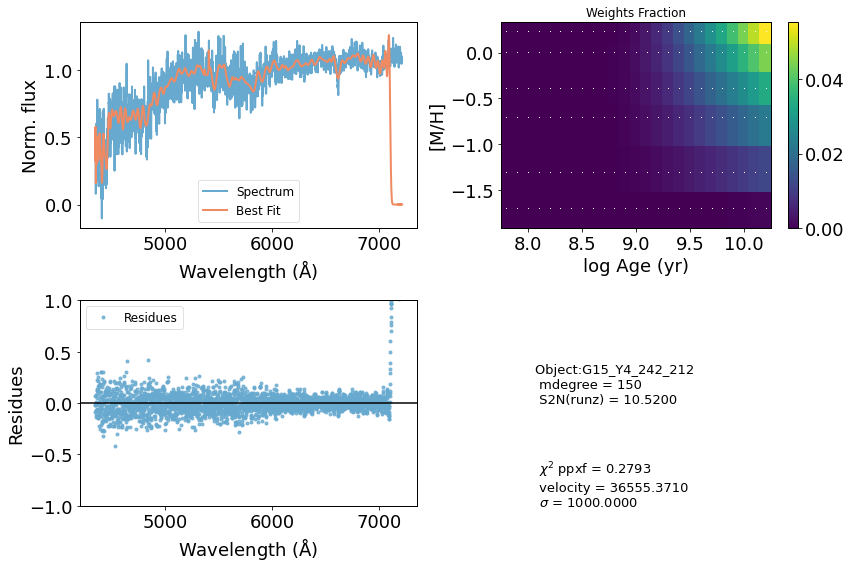

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     77486       949    -0.005    -0.001
 comp.  1:     77511       416
 comp.  2:     77482       178
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.05393
method = capfit; Jac calls: 8; Func calls: 1286; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       4.38         6   77511   416
Comp:  2       Unknown          0       5.1   77482   178
Comp:  2       Unknown     0.3351       5.1   77482   178
Comp:  2       Unknown          0       3.3   77482   178
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.224
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.224
M/L_r: 2.551
Current $\chi^2$: 0.0539
Elapsed time in PPXF: 8.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


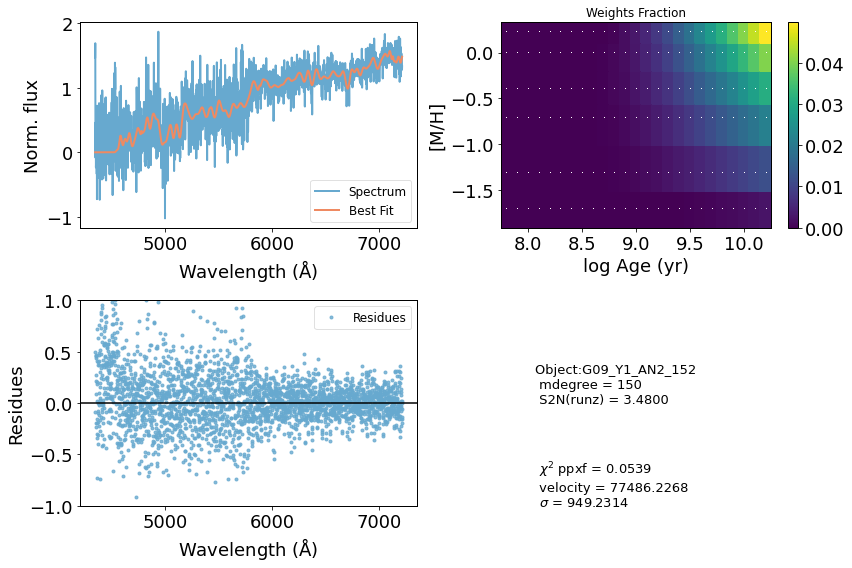

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53565      1000     0.300     0.300
 comp.  1:     51661        86
 comp.  2:     51843        13
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.04847
method = capfit; Jac calls: 19; Func calls: 3044; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.165       2.9   51661    86
Comp:  2       Unknown      1.404       3.5   51843    13
Comp:  2       Unknown      1.843       3.6   51843    13
Comp:  2       Unknown    0.06859       2.5   51843    13
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.886
Current $\chi^2$: 0.0485
Elapsed time in PPXF: 19.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


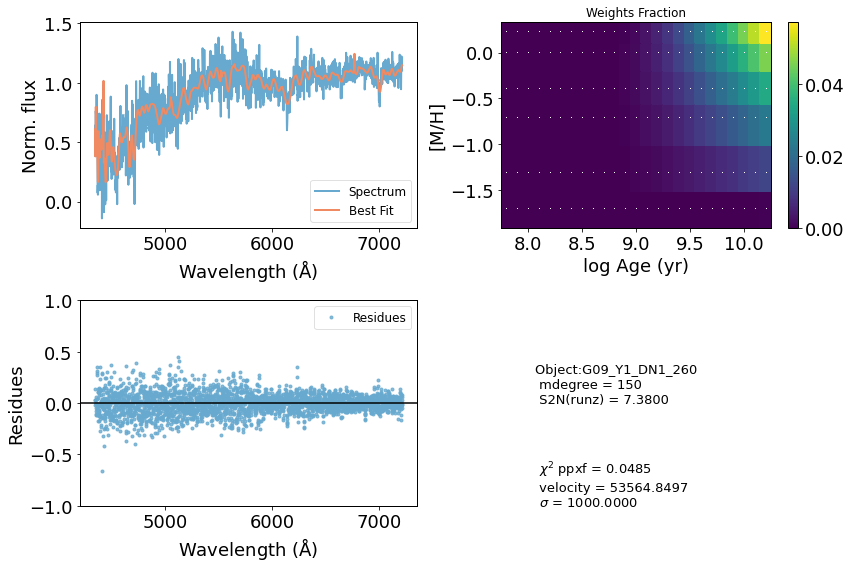

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56963      1000     0.300     0.300
 comp.  1:     54924        52
 comp.  2:     55110       254
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.02058
method = capfit; Jac calls: 16; Func calls: 2563; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3677       1.3   54924    52
Comp:  2       Unknown      2.563   3.6e+02   55110   254
Comp:  2       Unknown          0   3.6e+02   55110   254
Comp:  2       Unknown      2.069         7   55110   254
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.053
Current $\chi^2$: 0.0206
Elapsed time in PPXF: 16.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


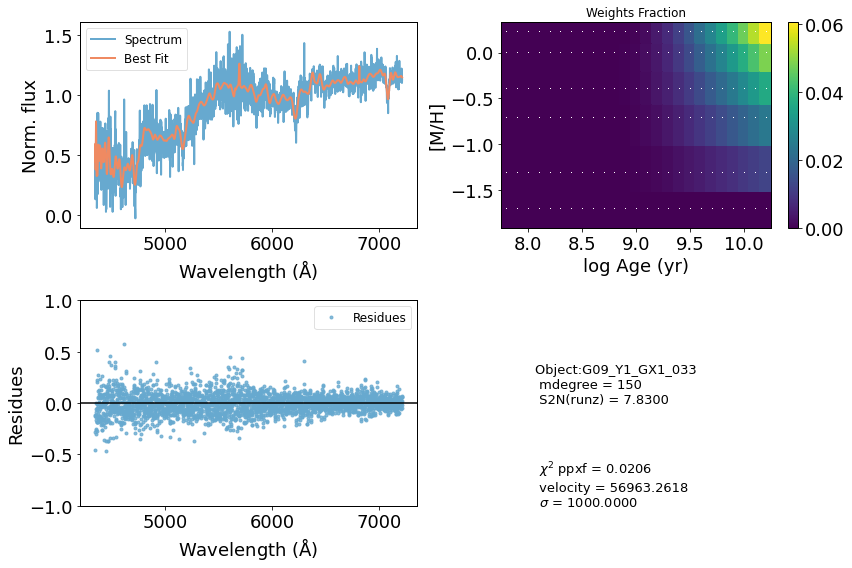

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55628      1000     0.300     0.300
 comp.  1:     54070      1000
 comp.  2:     54345       192
Gas Reddening E(B-V): 0.285
chi2/DOF: 0.02798
method = capfit; Jac calls: 16; Func calls: 2567; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1201       9.3   54070  1000
Comp:  2       Unknown     0.9389       5.4   54345   192
Comp:  2       Unknown          0       5.3   54345   192
Comp:  2       Unknown      1.195       6.2   54345   192
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.942
Current $\chi^2$: 0.0280
Elapsed time in PPXF: 16.69 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


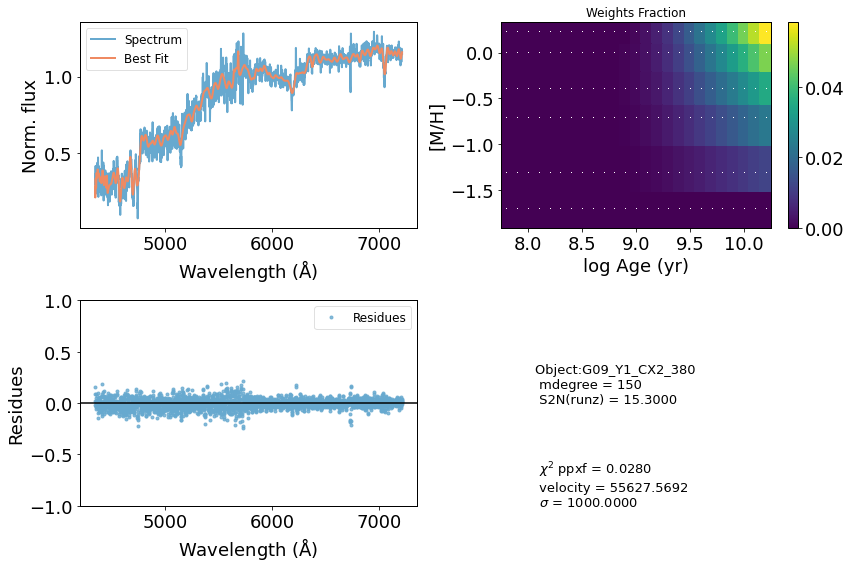

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58812      1000     0.300     0.300
 comp.  1:     56770         1
 comp.  2:     56187       419
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003954
method = capfit; Jac calls: 22; Func calls: 3531; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1373       2.3   56770     1
Comp:  2       Unknown        2.8        16   56187   419
Comp:  2       Unknown      1.218        16   56187   419
Comp:  2       Unknown      1.504       8.2   56187   419
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.787
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 22.69 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


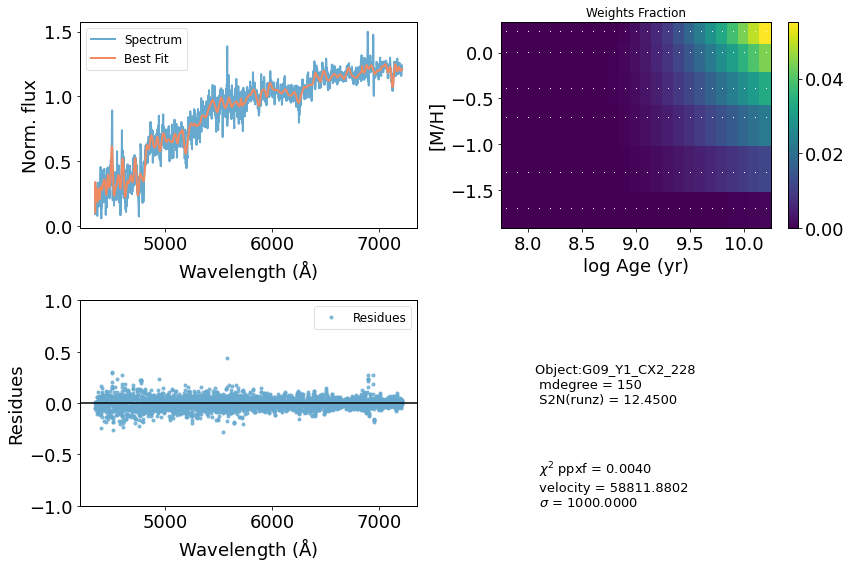

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74357       595    -0.002    -0.002
 comp.  1:     74356       479
 comp.  2:     74711       113
Gas Reddening E(B-V): 0.884
chi2/DOF: 0.0261
method = capfit; Jac calls: 8; Func calls: 1286; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  14 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.485       4.3   74356   479
Comp:  2       Unknown    0.06281       4.6   74711   113
Comp:  2       Unknown      1.408       4.5   74711   113
Comp:  2       Unknown          0       2.5   74711   113
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.376
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.376
M/L_r: 2.395
Current $\chi^2$: 0.0261
Elapsed time in PPXF: 8.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


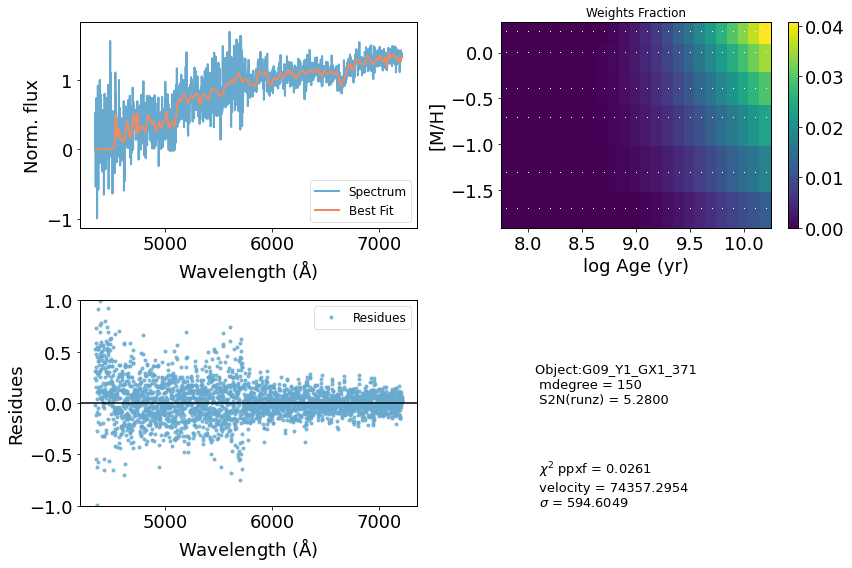

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     21631       422     0.000     0.004
 comp.  1:     20037       881
 comp.  2:     19879       331
Gas Reddening E(B-V): 0.672
chi2/DOF: 0.3912
method = capfit; Jac calls: 22; Func calls: 3526; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  69 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0        12   20037   881
Comp:  2       Unknown          0       3.8   19879   331
Comp:  2       Unknown     0.1195       3.8   19879   331
Comp:  2       Unknown      0.428         5   19879   331
Comp:  2       Unknown          0       4.8   19879   331
Comp:  2       Unknown          0       6.4   19879   331
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.202
Weighted <logAge> [yr]: 9.74
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


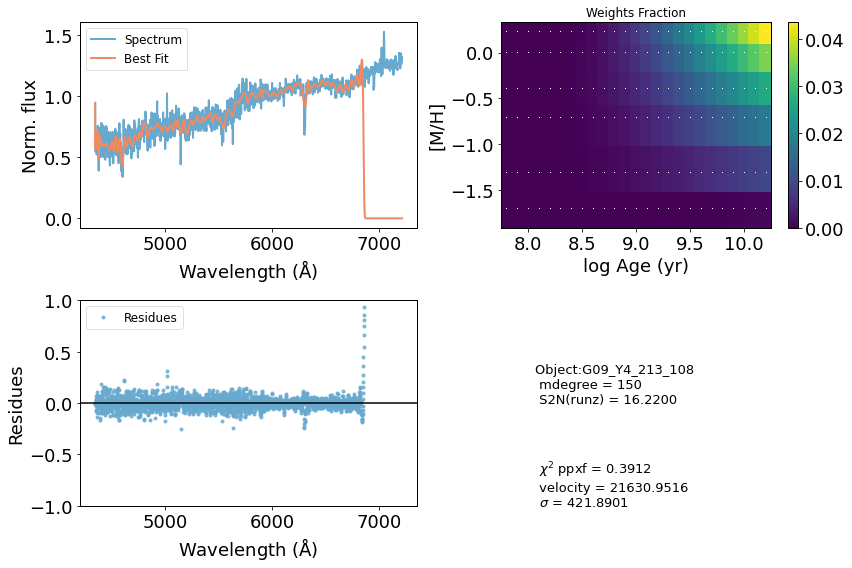

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49680      1000     0.300     0.300
 comp.  1:     48882       629
 comp.  2:     47144       420
Gas Reddening E(B-V): 4.552
chi2/DOF: 0.06397
method = capfit; Jac calls: 33; Func calls: 5287; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3545       6.2   48882   629
Comp:  2       Unknown          0        17   47144   420
Comp:  2       Unknown          0        17   47144   420
Comp:  2       Unknown          0       6.3   47144   420
Comp:  2       Unknown      1.859         6   47144   420
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.9
Current $\chi^2$: 0.0640
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


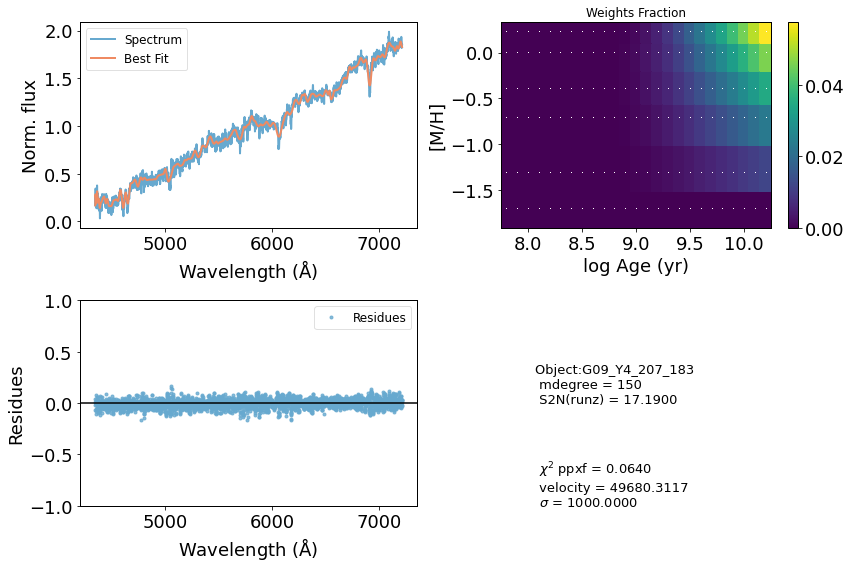

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40512      1000     0.300     0.300
 comp.  1:     39544       566
 comp.  2:     38121       908
Gas Reddening E(B-V): 4.800
chi2/DOF: 0.2395
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       2.45       4.1   39544   566
Comp:  2       Unknown          0       8.4   38121   908
Comp:  2       Unknown      4.101       6.6   38121   908
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.924
Current $\chi^2$: 0.2395
Elapsed time in PPXF: 18.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


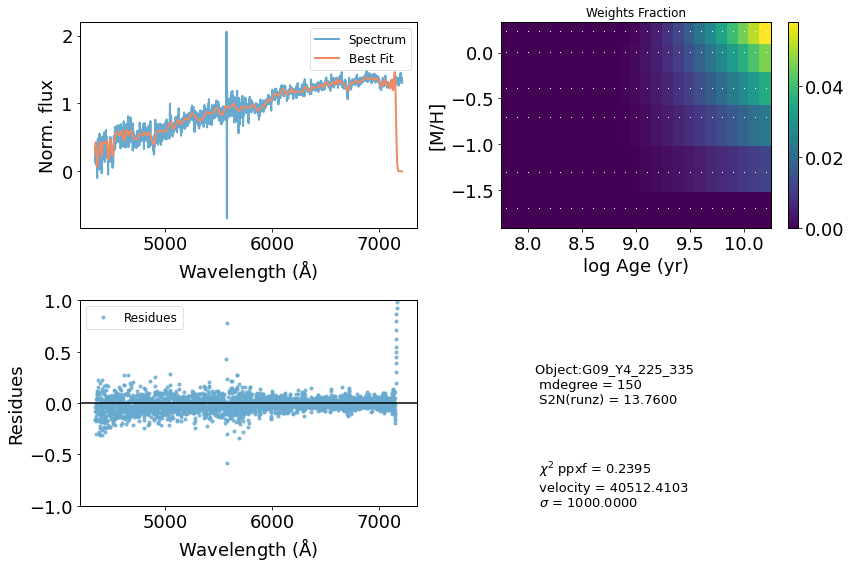

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45540      1000     0.292     0.300
 comp.  1:     43758       132
 comp.  2:     43655       130
Gas Reddening E(B-V): 0.851
chi2/DOF: 0.196
method = capfit; Jac calls: 27; Func calls: 4322; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  43 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   43758   132
Comp:  2       Unknown     0.9443       3.6   43655   130
Comp:  2       Unknown      1.063       2.1   43655   130
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.079
Current $\chi^2$: 0.1960
Elapsed time in PPXF: 27.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


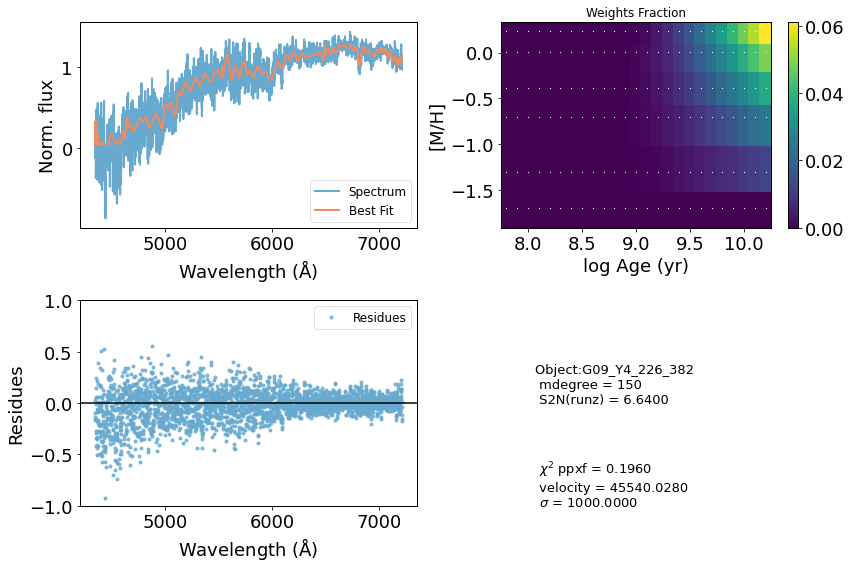

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60831       940     0.002     0.002
 comp.  1:     60972       116
 comp.  2:     60031         1
Gas Reddening E(B-V): 0.302
chi2/DOF: 0.01365
method = capfit; Jac calls: 12; Func calls: 1925; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  92 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6173       2.8   60972   116
Comp:  2       Unknown          0       3.1   60031     1
Comp:  2       Unknown     0.1122       3.1   60031     1
Comp:  2       Unknown          0       2.3   60031     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -1
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -1
M/L_r: 1.291
Current $\chi^2$: 0.0137
Elapsed time in PPXF: 12.53 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


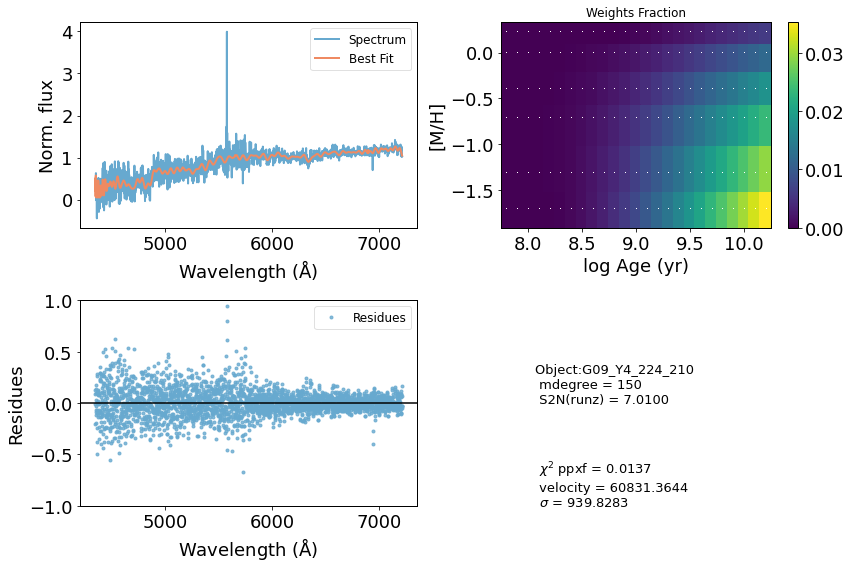

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44998      1000     0.300     0.300
 comp.  1:     43304        93
 comp.  2:     42226       290
Gas Reddening E(B-V): 3.850
chi2/DOF: 0.1585
method = capfit; Jac calls: 14; Func calls: 2246; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1797       1.5   43304    93
Comp:  2       Unknown     0.5163       5.1   42226   290
Comp:  2       Unknown     0.7368       3.7   42226   290
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
M/L_r: 2.862
Current $\chi^2$: 0.1585
Elapsed time in PPXF: 14.35 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


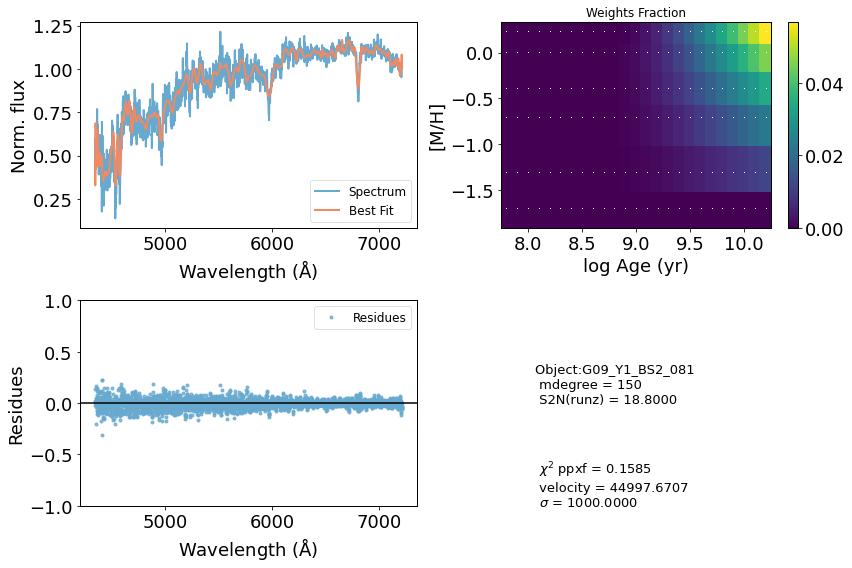

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49376      1000     0.300     0.300
 comp.  1:     46764       354
 comp.  2:     47315         1
Gas Reddening E(B-V): 3.706
chi2/DOF: 0.09778
method = capfit; Jac calls: 16; Func calls: 2567; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9857       2.9   46764   354
Comp:  2       Unknown          0       3.2   47315     1
Comp:  2       Unknown     0.5857       3.4   47315     1
Comp:  2       Unknown          0       2.2   47315     1
Comp:  2       Unknown          0       1.4   47315     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.863
Current $\chi^2$: 0.0978
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


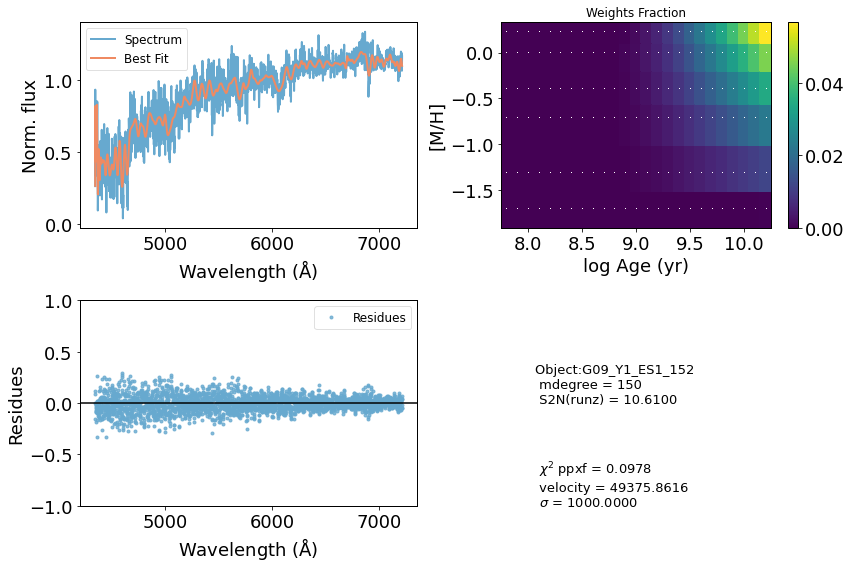

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68185      1000    -0.122     0.118
 comp.  1:     69278         1
 comp.  2:     68343       208
Gas Reddening E(B-V): 0.061
chi2/DOF: 0.006391
method = capfit; Jac calls: 44; Func calls: 7044; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  88 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.9   69278     1
Comp:  2       Unknown          0       7.2   68343   208
Comp:  2       Unknown     0.8752       7.3   68343   208
Comp:  2       Unknown          0       4.1   68343   208
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.676
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.676
M/L_r: 1.778
Current $\chi^2$: 0.0064
Elapsed time in PPXF: 46.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


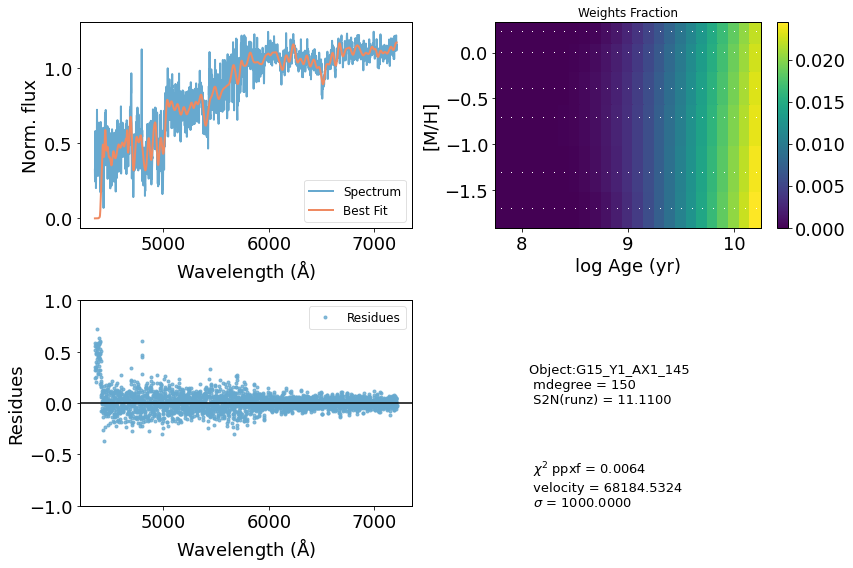

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     27899      1000     0.078     0.276
 comp.  1:     26168       165
 comp.  2:     25861       459
Gas Reddening E(B-V): 2.774
chi2/DOF: 0.2757
method = capfit; Jac calls: 33; Func calls: 5285; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7776       2.6   26168   165
Comp:  2       Unknown     0.9335       4.9   25861   459
Comp:  2       Unknown          0       4.6   25861   459
Comp:  2       Unknown     0.7879       5.9   25861   459
Comp:  2       Unknown      1.848       5.5   25861   459
Comp:  2       Unknown          0       4.7   25861   459
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.212
Weighted <logAge> [yr]: 9.84
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


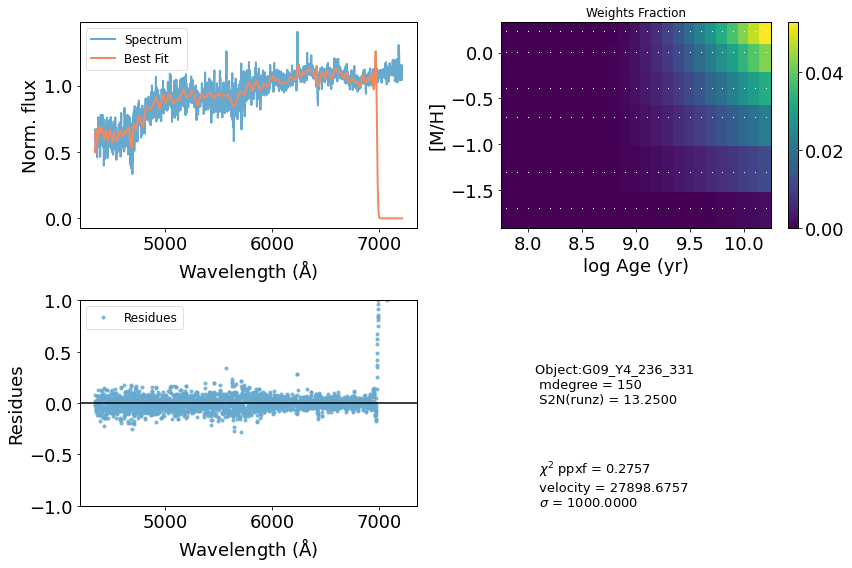

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68580      1000    -0.084     0.069
 comp.  1:     69276       445
 comp.  2:     69889       180
Gas Reddening E(B-V): 3.401
chi2/DOF: 0.00621
method = capfit; Jac calls: 23; Func calls: 3686; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.417       4.8   69276   445
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       3.4   69889   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.07
Weighted <[M/H]>: -1.07
Weighted <logAge> [yr]: 9.07
Weighted <[M/H]>: -1.07
M/L_r: 0.4052
Current $\chi^2$: 0.0062
Elapsed time in PPXF: 24.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


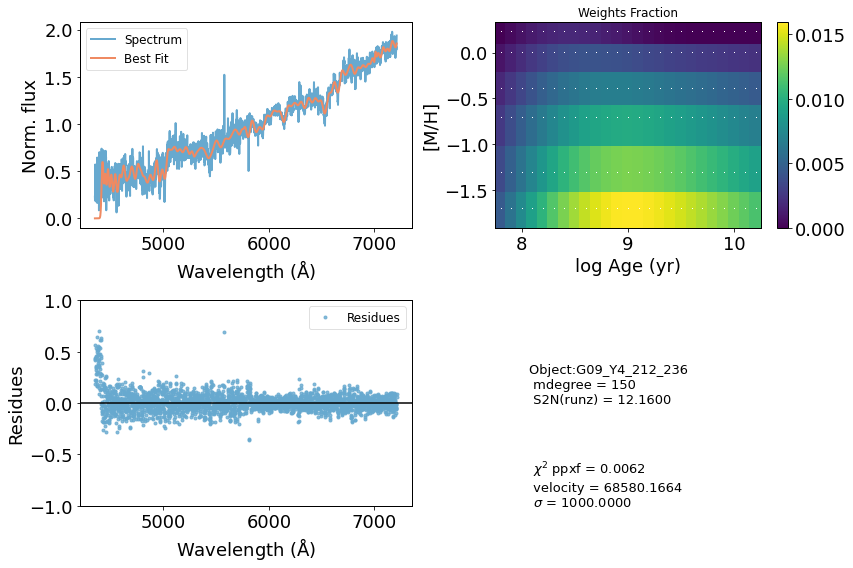

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55615      1000     0.300     0.300
 comp.  1:     53684         1
 comp.  2:     53863       194
Gas Reddening E(B-V): 0.493
chi2/DOF: 0.0449
method = capfit; Jac calls: 17; Func calls: 2727; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  27 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.0507       1.4   53684     1
Comp:  2       Unknown          0       8.6   53863   194
Comp:  2       Unknown       6.82       8.9   53863   194
Comp:  2       Unknown     0.8786       5.7   53863   194
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.024
Current $\chi^2$: 0.0449
Elapsed time in PPXF: 17.66 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


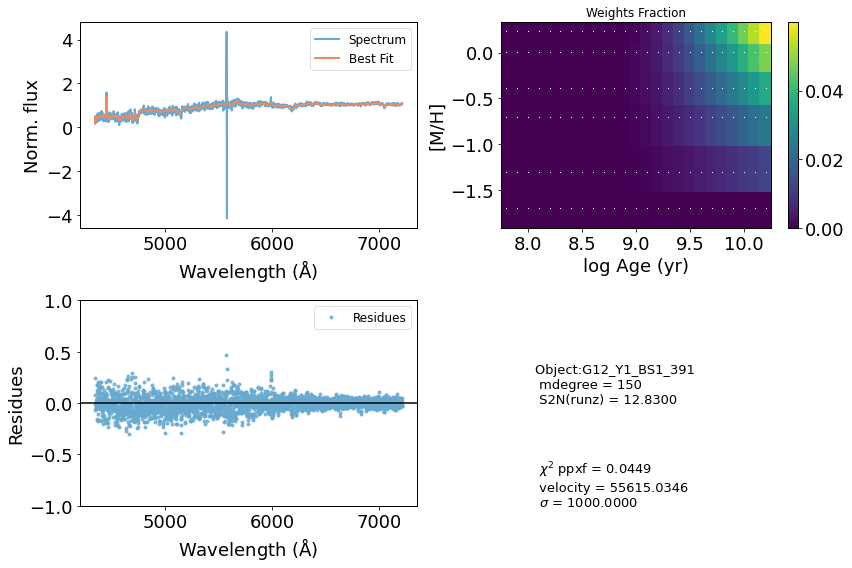

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44844      1000     0.300     0.300
 comp.  1:     42506       506
 comp.  2:     42843        90
Gas Reddening E(B-V): 4.226
chi2/DOF: 0.1829
method = capfit; Jac calls: 15; Func calls: 2406; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.384       3.1   42506   506
Comp:  2       Unknown     0.5299       2.9   42843    90
Comp:  2       Unknown          0       1.9   42843    90
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.967
Current $\chi^2$: 0.1829
Elapsed time in PPXF: 15.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


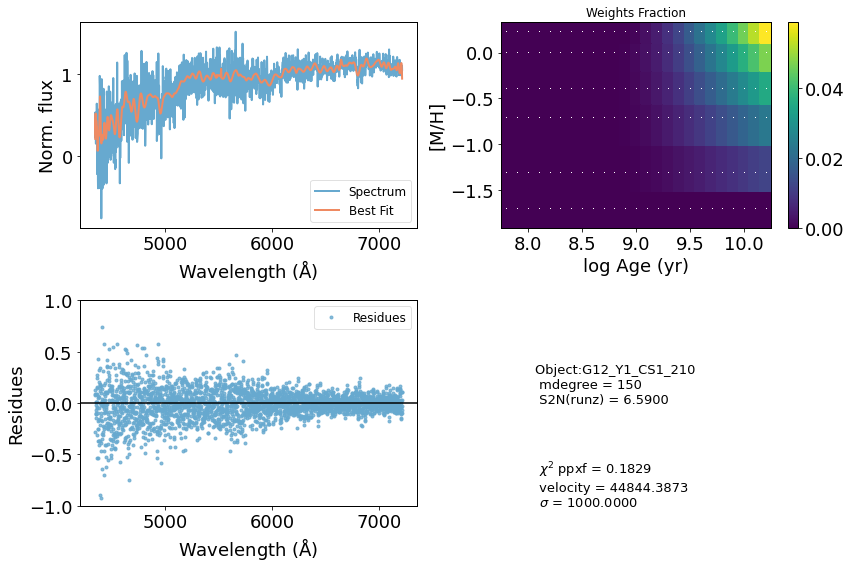

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30424       180     0.000     0.000
 comp.  1:     30424       180
 comp.  2:     30424       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4789
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.178       3.7   30424   180
Comp:  2       Unknown       1.55       4.2   30424   180
Comp:  2       Unknown     0.1497       3.4   30424   180
Comp:  2       Unknown     0.2212       2.3   30424   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.601
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.601
M/L_r: 2.481
Current $\chi^2$: 0.4789
Elapsed time in PPXF: 1.14 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


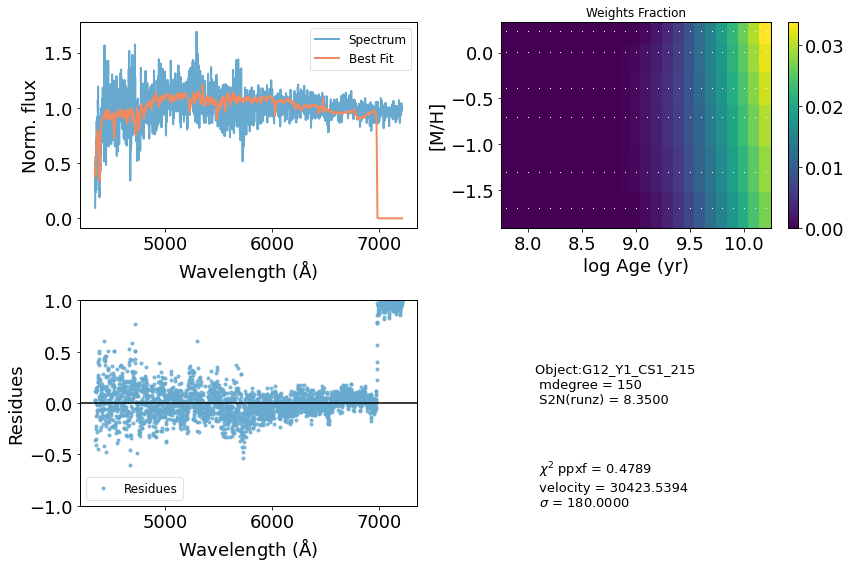

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74619      1000    -0.068     0.080
 comp.  1:     75518       207
 comp.  2:     75175       354
Gas Reddening E(B-V): 1.382
chi2/DOF: 0.004003
method = capfit; Jac calls: 23; Func calls: 3686; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2189       3.3   75518   207
Comp:  2       Unknown     0.4692        13   75175   354
Comp:  2       Unknown      2.024        13   75175   354
Comp:  2       Unknown     0.7804       5.3   75175   354
---------------------------------------------------------
Weighted <logAge> [yr]: 9.59
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.59
Weighted <[M/H]>: -1.11
M/L_r: 0.9453
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 24.20 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


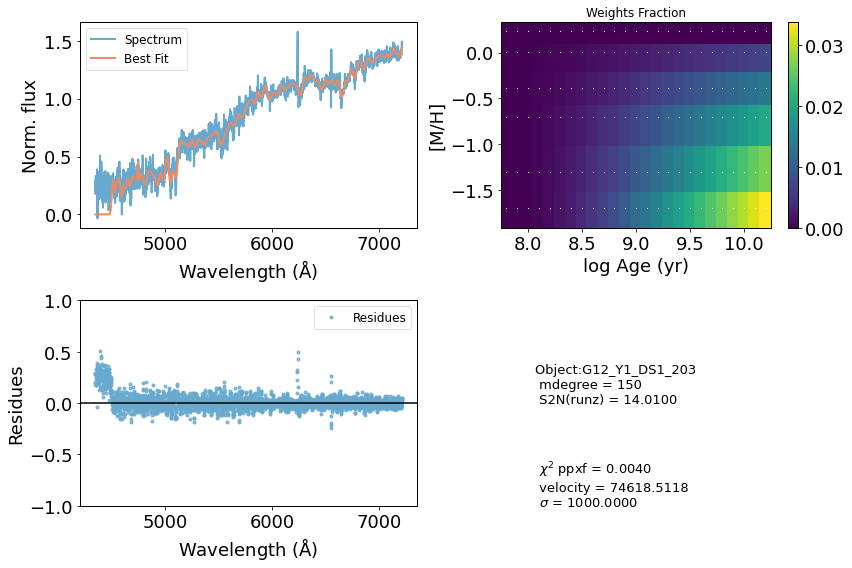

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60258      1000     0.002     0.005
 comp.  1:     59887      1000
 comp.  2:     59272         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0109
method = capfit; Jac calls: 21; Func calls: 3365; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  54 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      40.75        11   59887  1000
Comp:  2       Unknown     0.3678       2.5   59272     1
Comp:  2       Unknown          0       2.4   59272     1
Comp:  2       Unknown     0.4831       2.4   59272     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.62
Weighted <[M/H]>: -1.04
Weighted <logAge> [yr]: 9.62
Weighted <[M/H]>: -1.04
M/L_r: 1.023
Current $\chi^2$: 0.0109
Elapsed time in PPXF: 21.57 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


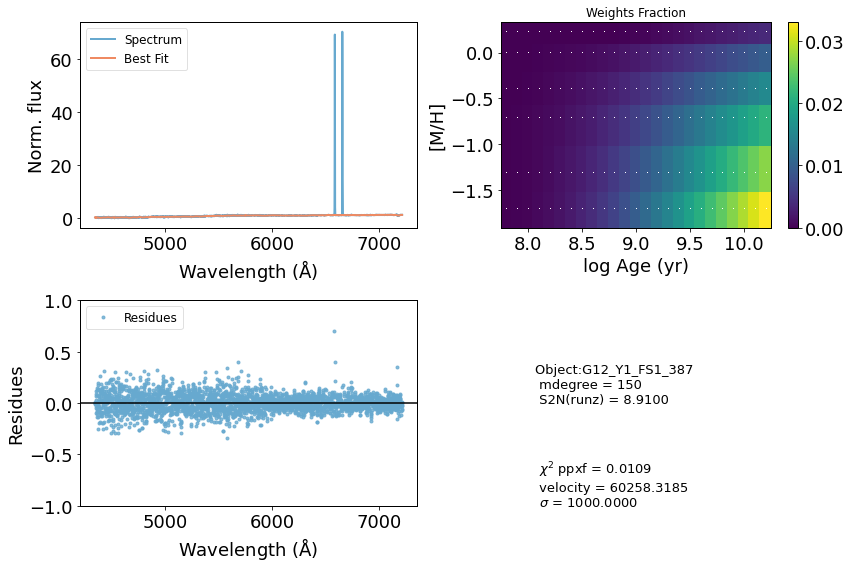

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47774      1000     0.300     0.300
 comp.  1:     45913       226
 comp.  2:     45692         1
Gas Reddening E(B-V): 6.667
chi2/DOF: 0.0924
method = capfit; Jac calls: 17; Func calls: 2724; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   45913   226
Comp:  2       Unknown     0.6537       2.4   45692     1
Comp:  2       Unknown          0       1.3   45692     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.884
Current $\chi^2$: 0.0924
Elapsed time in PPXF: 17.44 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


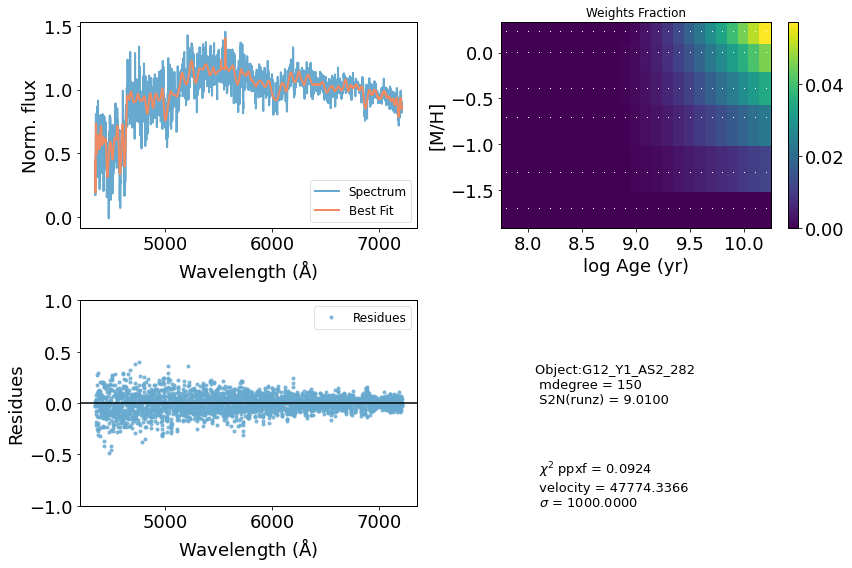

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56061      1000     0.300     0.300
 comp.  1:     54449       249
 comp.  2:     54991       309
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.03668
method = capfit; Jac calls: 15; Func calls: 2407; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.7   54449   249
Comp:  2       Unknown          0        14   54991   309
Comp:  2       Unknown          0        14   54991   309
Comp:  2       Unknown      1.132       6.2   54991   309
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.035
Current $\chi^2$: 0.0367
Elapsed time in PPXF: 15.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


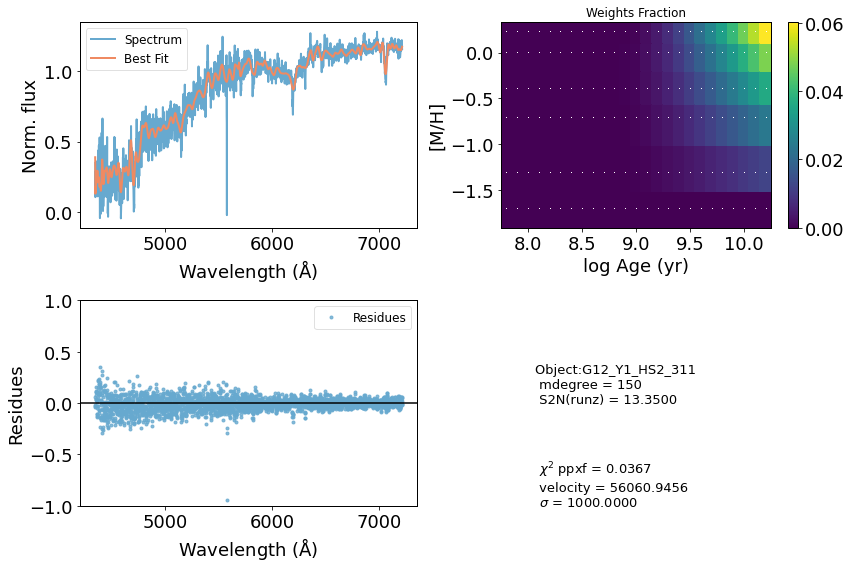

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41147      1000     0.300     0.300
 comp.  1:     39366       235
 comp.  2:     37819       841
Gas Reddening E(B-V): 4.651
chi2/DOF: 0.1617
method = capfit; Jac calls: 16; Func calls: 2564; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3653       2.5   39366   235
Comp:  2       Unknown          0         8   37819   841
Comp:  2       Unknown          0         6   37819   841
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.859
Current $\chi^2$: 0.1617
Elapsed time in PPXF: 16.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


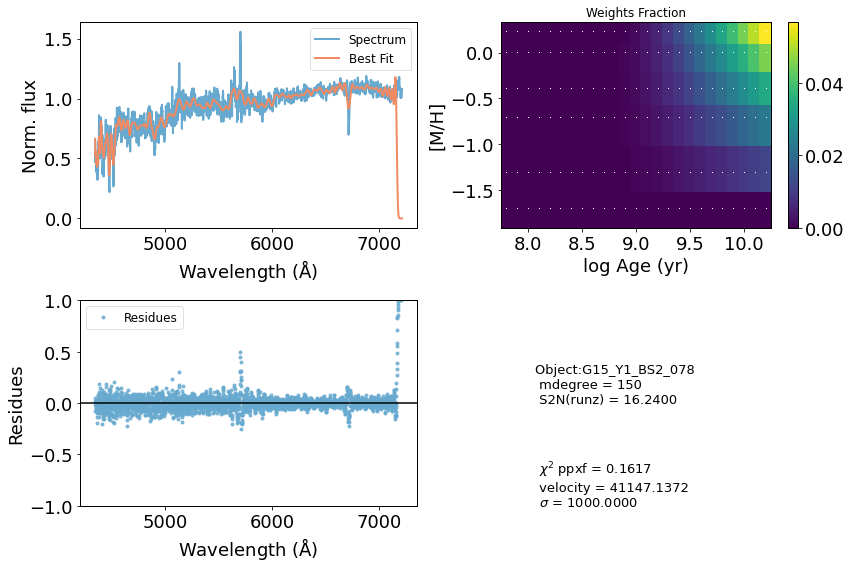

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54942      1000     0.300     0.300
 comp.  1:     53500       733
 comp.  2:     53443       180
Gas Reddening E(B-V): 3.295
chi2/DOF: 0.05269
method = capfit; Jac calls: 23; Func calls: 3684; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.181       3.6   53500   733
Comp:  2       Unknown       3.05       9.8   53443   180
Comp:  2       Unknown          0       9.6   53443   180
Comp:  2       Unknown          0       4.7   53443   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.036
Current $\chi^2$: 0.0527
Elapsed time in PPXF: 23.70 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


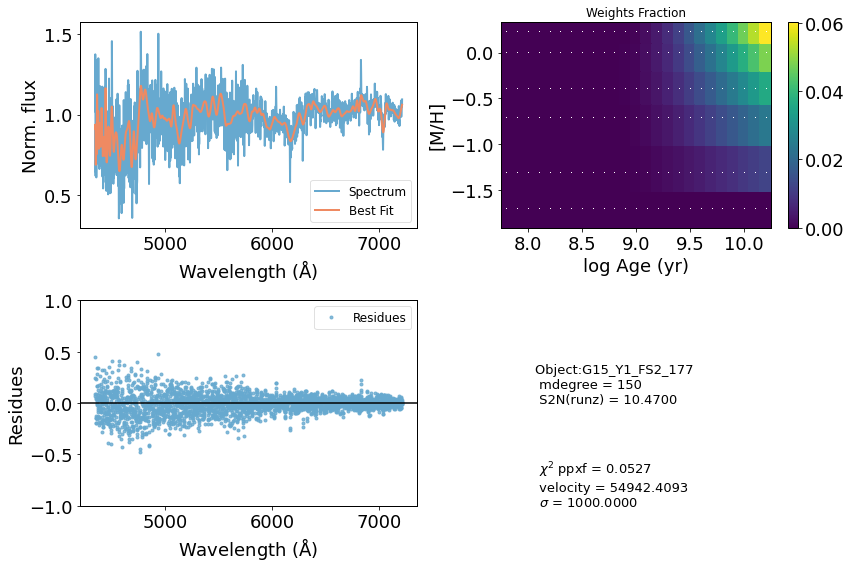

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53653      1000     0.300     0.300
 comp.  1:     51966       348
 comp.  2:     51948        25
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08489
method = capfit; Jac calls: 19; Func calls: 3042; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.4   51966   348
Comp:  2       Unknown          0       4.6   51948    25
Comp:  2       Unknown      1.961       4.7   51948    25
Comp:  2       Unknown          0       2.6   51948    25
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.008
Current $\chi^2$: 0.0849
Elapsed time in PPXF: 18.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


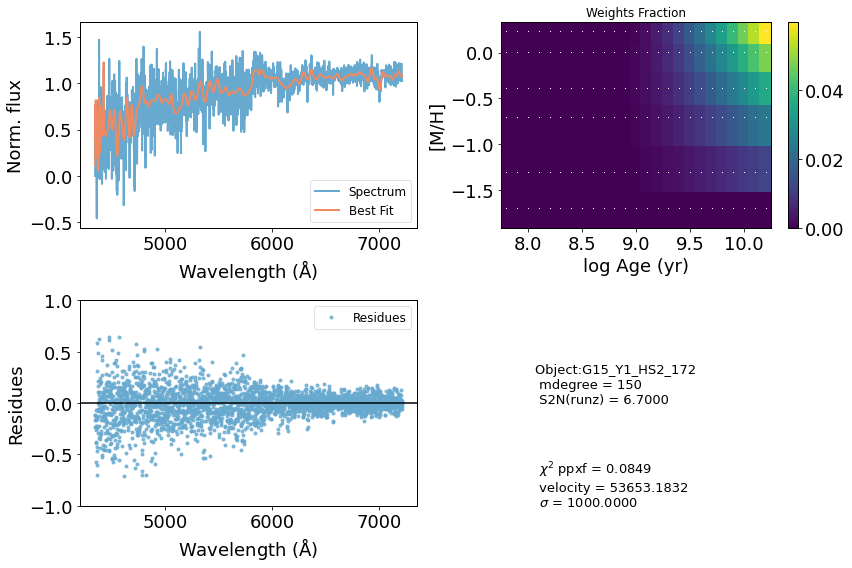

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47458      1000     0.300     0.300
 comp.  1:     46021       113
 comp.  2:     45337        99
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1801
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5239       2.8   46021   113
Comp:  2       Unknown      1.736       3.5   45337    99
Comp:  2       Unknown          0       1.7   45337    99
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.913
Current $\chi^2$: 0.1801
Elapsed time in PPXF: 12.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


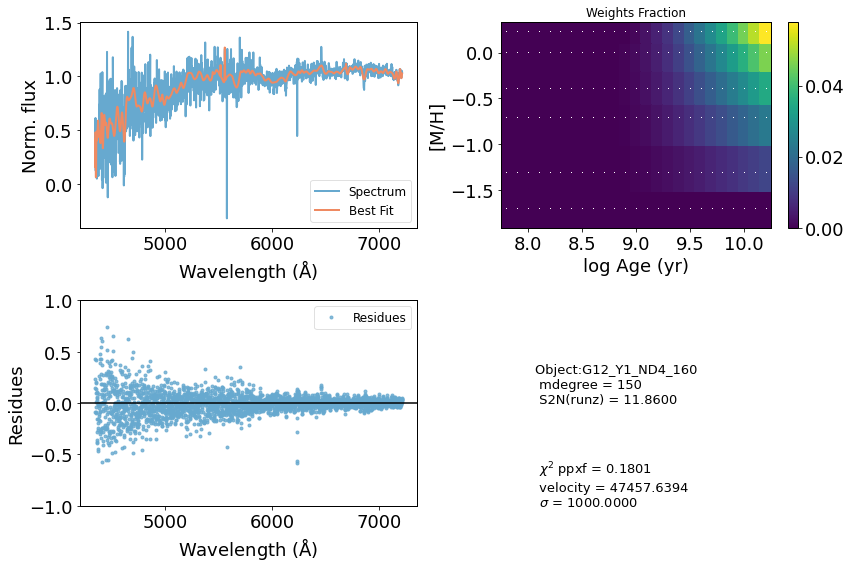

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51203      1000     0.300     0.300
 comp.  1:     49202       295
 comp.  2:     49596       217
Gas Reddening E(B-V): 0.179
chi2/DOF: 0.08471
method = capfit; Jac calls: 15; Func calls: 2404; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  52 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   49202   295
Comp:  2       Unknown      4.727       9.4   49596   217
Comp:  2       Unknown          0       9.2   49596   217
Comp:  2       Unknown          0       4.8   49596   217
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.977
Current $\chi^2$: 0.0847
Elapsed time in PPXF: 15.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


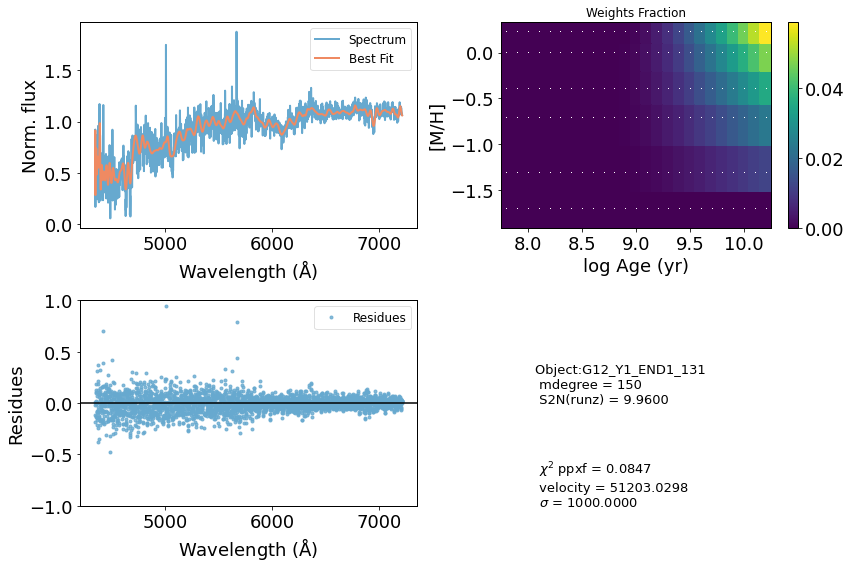

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57532      1000     0.300     0.300
 comp.  1:     56026       380
 comp.  2:     55219       571
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01438
method = capfit; Jac calls: 25; Func calls: 4009; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.473       3.2   56026   380
Comp:  2       Unknown      52.04   5.6e+02   55219   571
Comp:  2       Unknown          0   5.7e+02   55219   571
Comp:  2       Unknown          0         8   55219   571
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.972
Current $\chi^2$: 0.0144
Elapsed time in PPXF: 25.63 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


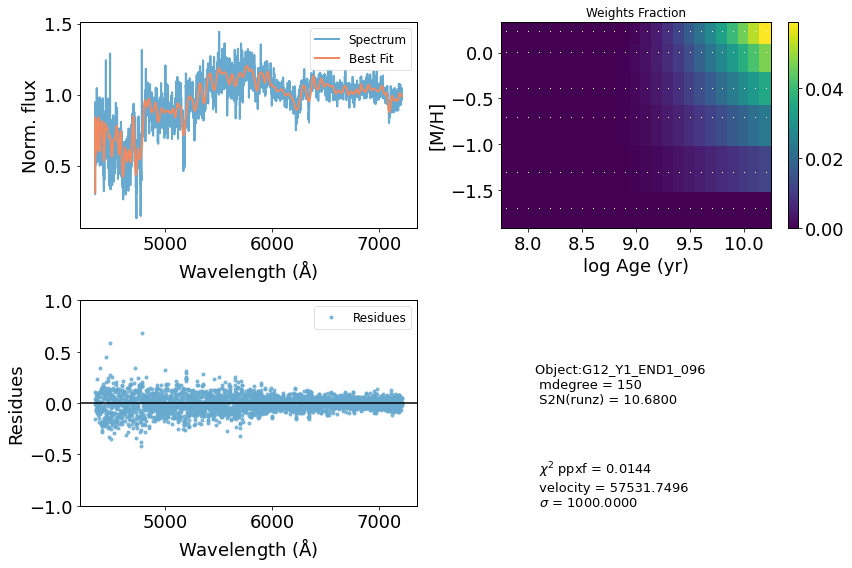

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57008      1000     0.300     0.300
 comp.  1:     55318        30
 comp.  2:     55798       122
Gas Reddening E(B-V): 0.214
chi2/DOF: 0.01767
method = capfit; Jac calls: 14; Func calls: 2249; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.1   55318    30
Comp:  2       Unknown      1.017       4.2   55798   122
Comp:  2       Unknown          0         4   55798   122
Comp:  2       Unknown     0.4857       4.2   55798   122
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.033
Current $\chi^2$: 0.0177
Elapsed time in PPXF: 14.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


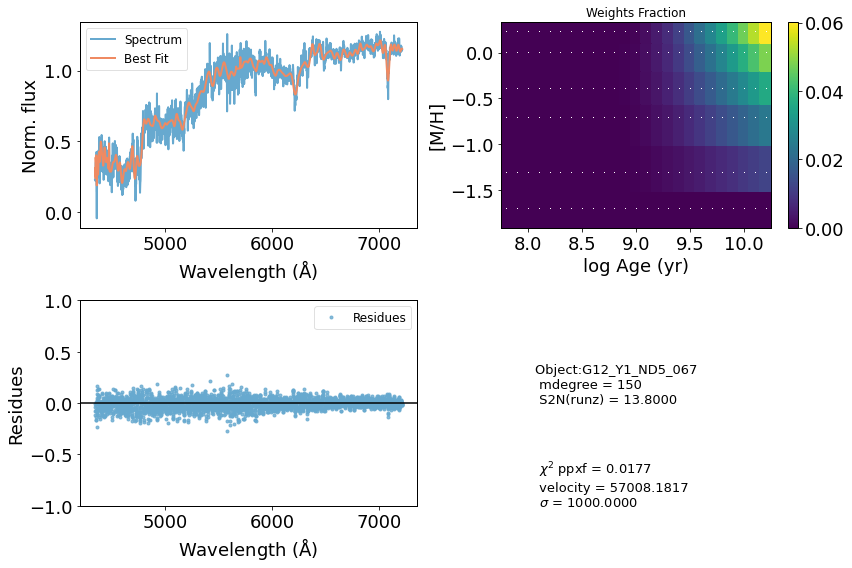

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43673      1000     0.300     0.300
 comp.  1:     41979       290
 comp.  2:     41673       180
Gas Reddening E(B-V): 0.374
chi2/DOF: 0.1534
method = capfit; Jac calls: 20; Func calls: 3208; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         4   41979   290
Comp:  2       Unknown          0       4.4   41673   180
Comp:  2       Unknown          0       2.5   41673   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
M/L_r: 2.843
Current $\chi^2$: 0.1534
Elapsed time in PPXF: 20.65 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


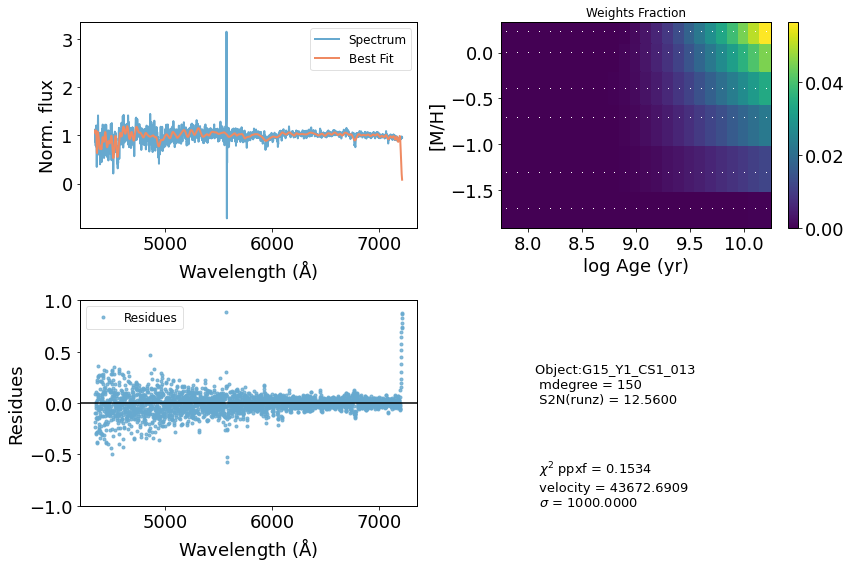

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74336      1000    -0.031     0.015
 comp.  1:     74123       115
 comp.  2:     74837       152
Gas Reddening E(B-V): 3.820
chi2/DOF: 0.02115
method = capfit; Jac calls: 10; Func calls: 1605; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7462       1.4   74123   115
Comp:  2       Unknown      3.575       9.1   74837   152
Comp:  2       Unknown          0       7.2   74837   152
Comp:  2       Unknown      1.596         3   74837   152
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.718
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.718
M/L_r: 1.448
Current $\chi^2$: 0.0211
Elapsed time in PPXF: 10.54 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


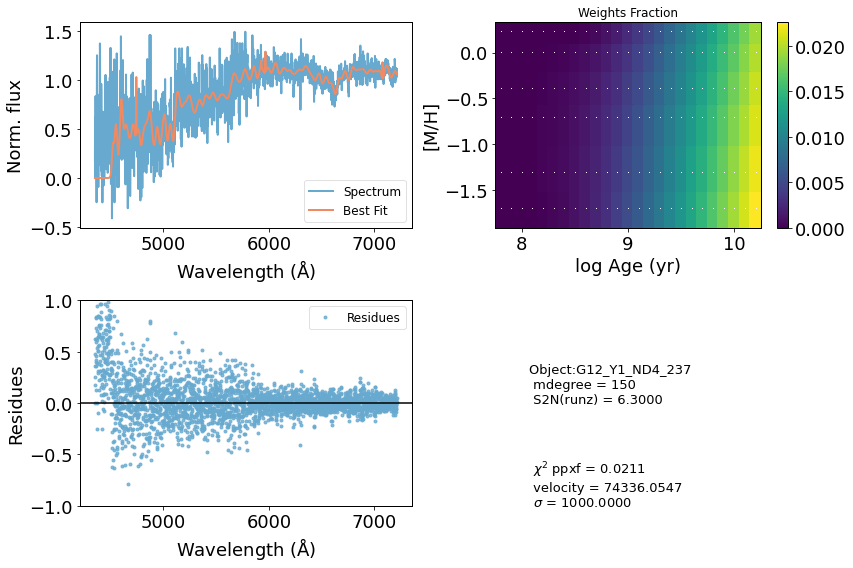

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     61001       753    -0.091    -0.036
 comp.  1:     61398      1000
 comp.  2:     60824        12
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003265
method = capfit; Jac calls: 13; Func calls: 2083; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  71 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      34.34       9.8   61398  1000
Comp:  2       Unknown     0.7051         4   60824    12
Comp:  2       Unknown          0       3.7   60824    12
Comp:  2       Unknown     0.2734       2.3   60824    12
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.83
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: -0.83
M/L_r: 1.514
Current $\chi^2$: 0.0033
Elapsed time in PPXF: 13.83 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


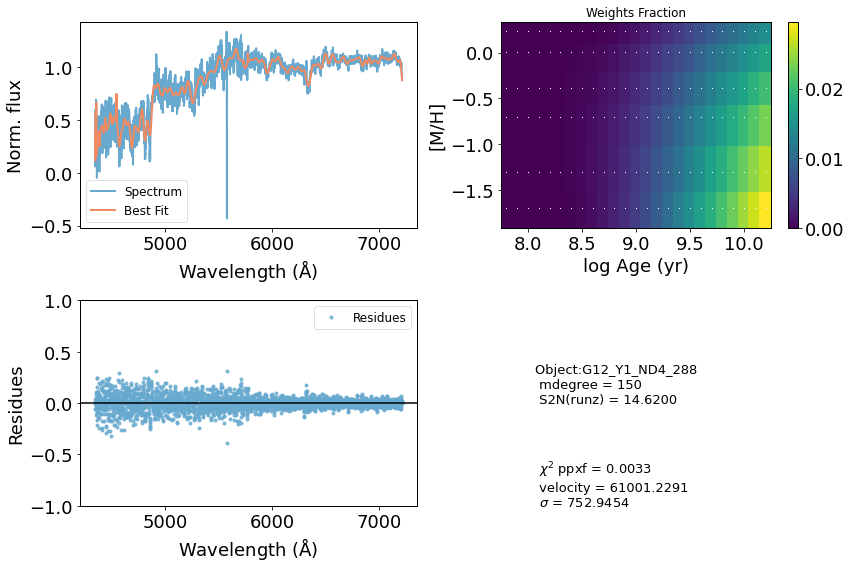

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52407      1000     0.300     0.300
 comp.  1:     50694       325
 comp.  2:     50583       220
Gas Reddening E(B-V): 1.188
chi2/DOF: 0.07448
method = capfit; Jac calls: 25; Func calls: 4007; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.1   50694   325
Comp:  2       Unknown     0.2546         8   50583   220
Comp:  2       Unknown      2.242         8   50583   220
Comp:  2       Unknown     0.4452       5.2   50583   220
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.044
Current $\chi^2$: 0.0745
Elapsed time in PPXF: 25.35 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


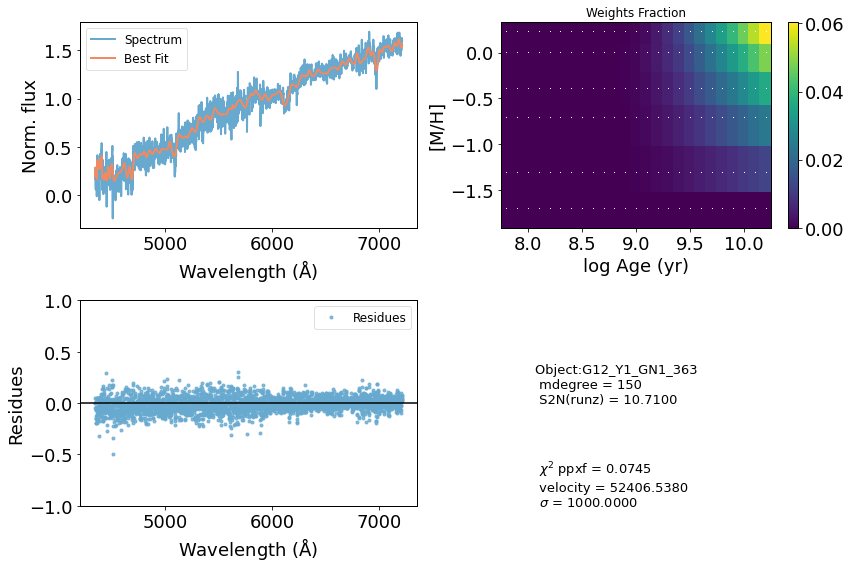

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52953      1000     0.300     0.300
 comp.  1:     51065        11
 comp.  2:     50838       138
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08757
method = capfit; Jac calls: 11; Func calls: 1765; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4656       2.2   51065    11
Comp:  2       Unknown          0       5.4   50838   138
Comp:  2       Unknown          0       5.4   50838   138
Comp:  2       Unknown     0.8851       4.1   50838   138
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.981
Current $\chi^2$: 0.0876
Elapsed time in PPXF: 10.77 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


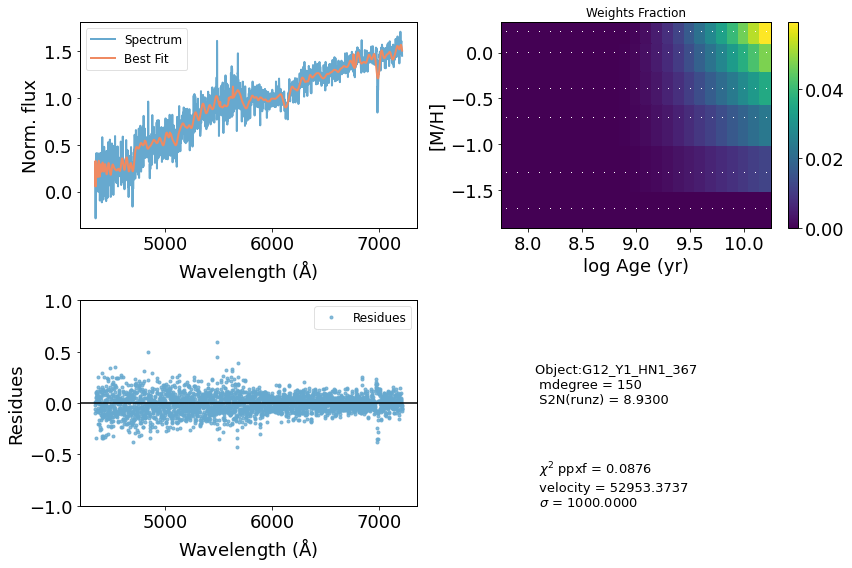

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68727      1000    -0.088     0.084
 comp.  1:     69210       687
 comp.  2:     68612       140
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01312
method = capfit; Jac calls: 12; Func calls: 1924; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.84       7.6   69210   687
Comp:  2       Unknown      2.182       4.9   68612   140
Comp:  2       Unknown          0       4.8   68612   140
Comp:  2       Unknown     0.7913       3.3   68612   140
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.231
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.231
M/L_r: 2.596
Current $\chi^2$: 0.0131
Elapsed time in PPXF: 12.26 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


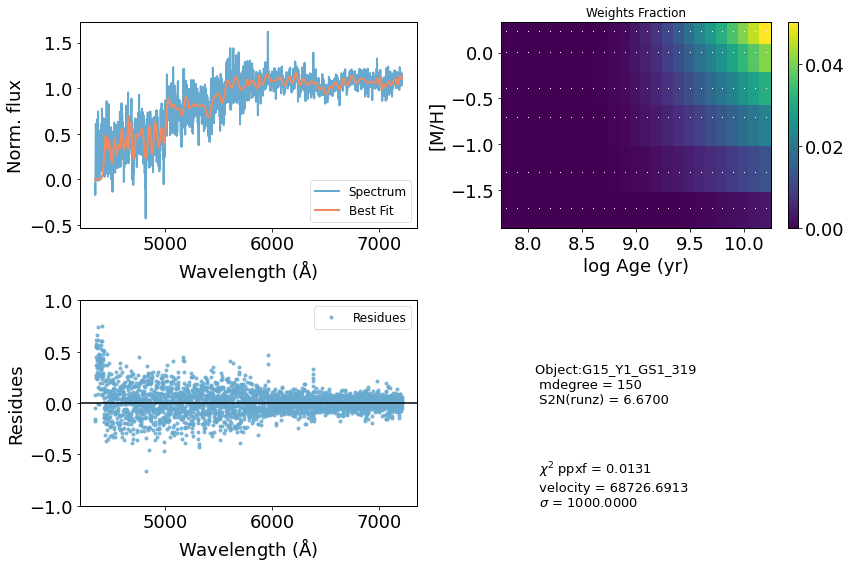

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     63848      1000    -0.143     0.085
 comp.  1:     64172       147
 comp.  2:     64044         1
Gas Reddening E(B-V): 3.510
chi2/DOF: 0.05109
method = capfit; Jac calls: 22; Func calls: 3525; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.152       1.9   64172   147
Comp:  2       Unknown     0.4832       2.9   64044     1
Comp:  2       Unknown     0.3185       2.9   64044     1
Comp:  2       Unknown     0.5142       2.3   64044     1
---------------------------------------------------------
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: -1.02
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: -1.02
M/L_r: 0.1604
Current $\chi^2$: 0.0511
Elapsed time in PPXF: 17.48 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


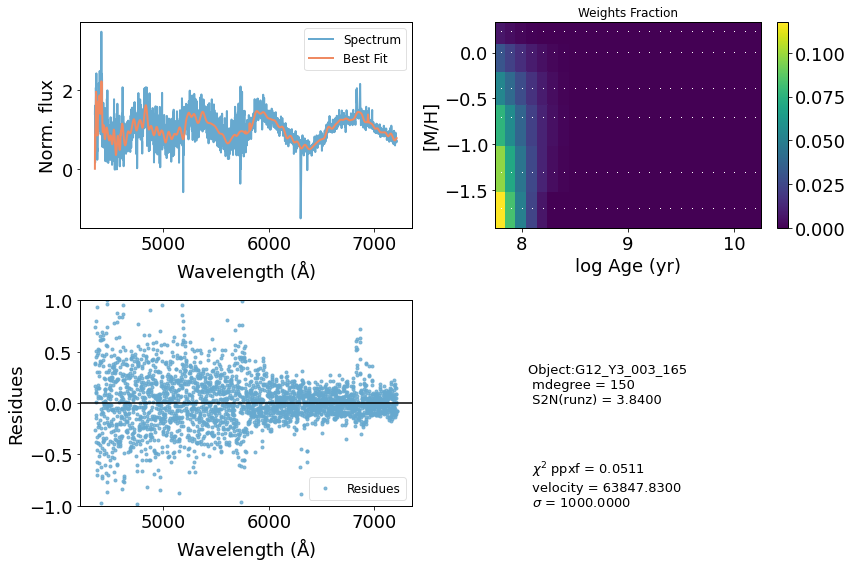

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49343      1000     0.300     0.300
 comp.  1:     47105       551
 comp.  2:     47625       134
Gas Reddening E(B-V): 5.145
chi2/DOF: 0.07509
method = capfit; Jac calls: 13; Func calls: 2085; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.657       3.5   47105   551
Comp:  2       Unknown          0       5.3   47625   134
Comp:  2       Unknown          0       5.5   47625   134
Comp:  2       Unknown          0       3.9   47625   134
Comp:  2       Unknown     0.1267       2.3   47625   134
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
M/L_r: 2.82
Current $\chi^2$: 0.0751
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


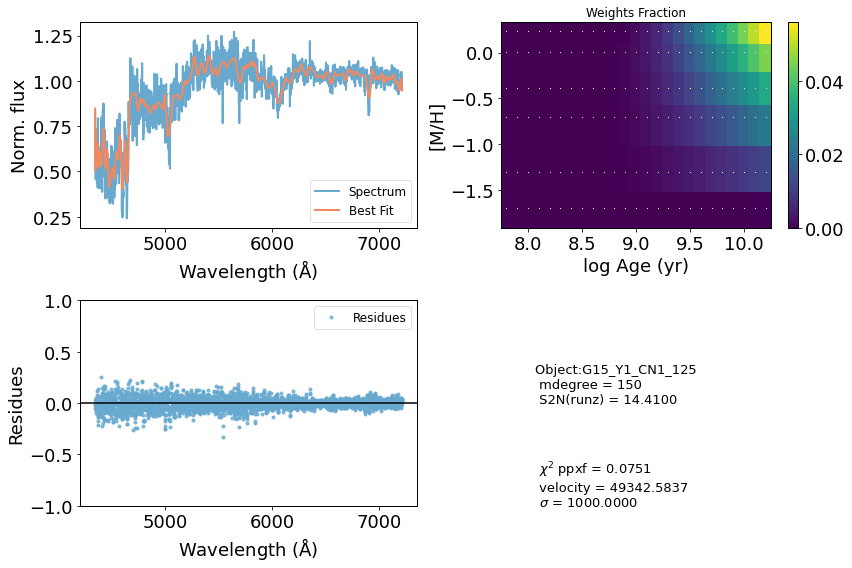

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35052       180     0.000     0.000
 comp.  1:     35052       180
 comp.  2:     35052       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2106
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  70 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.653       4.5   35052   180
Comp:  2       Unknown     0.3174       4.1   35052   180
Comp:  2       Unknown          0       3.3   35052   180
Comp:  2       Unknown     0.9576       3.1   35052   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.761
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.761
M/L_r: 2.36
Current $\chi^2$: 0.2106
Elapsed time in PPXF: 1.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


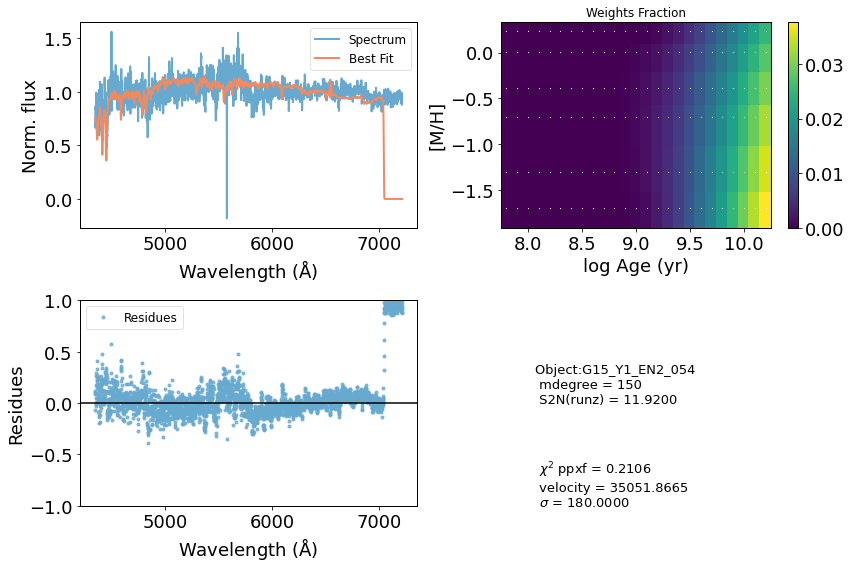

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41373      1000     0.300     0.300
 comp.  1:     40231       399
 comp.  2:     39902      1000
Gas Reddening E(B-V): 7.044
chi2/DOF: 0.1696
method = capfit; Jac calls: 17; Func calls: 2729; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.277       3.2   40231   399
Comp:  2       Unknown      3.668       8.8   39902  1000
Comp:  2       Unknown      7.222       6.6   39902  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.823
Current $\chi^2$: 0.1696
Elapsed time in PPXF: 17.44 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


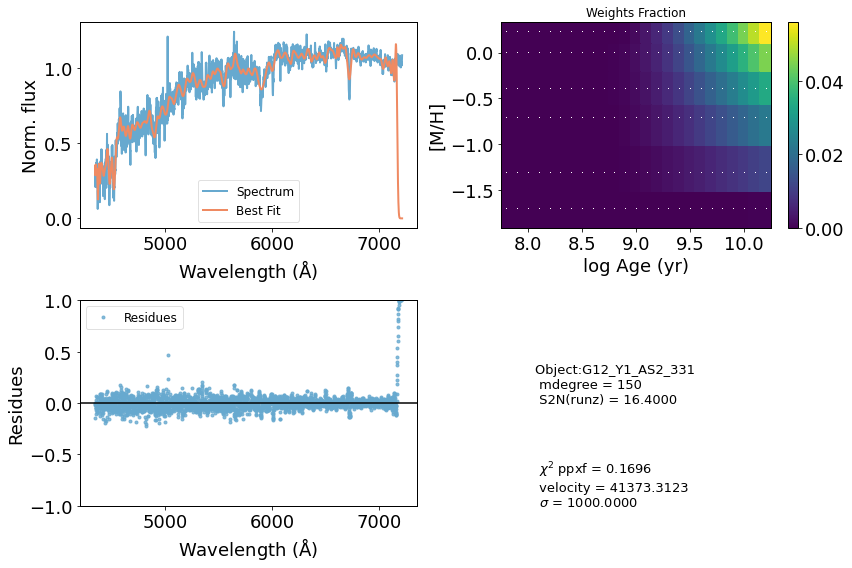

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51800      1000     0.300     0.300
 comp.  1:     51063      1000
 comp.  2:     50011        87
Gas Reddening E(B-V): 8.929
chi2/DOF: 0.09114
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.71       5.6   51063  1000
Comp:  2       Unknown      5.113        37   50011    87
Comp:  2       Unknown      5.666        41   50011    87
Comp:  2       Unknown          0       3.3   50011    87
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.024
Current $\chi^2$: 0.0911
Elapsed time in PPXF: 13.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


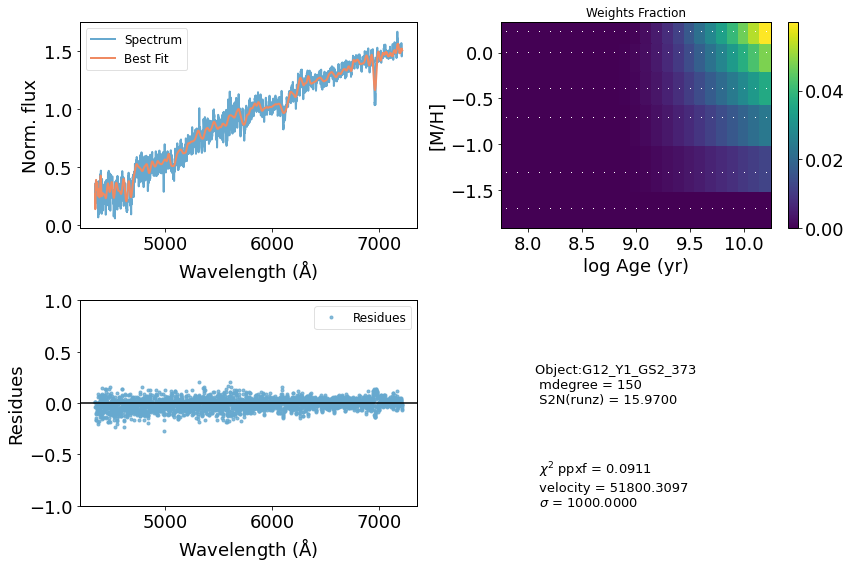

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56053      1000     0.300     0.300
 comp.  1:     54530       997
 comp.  2:     54585       237
Gas Reddening E(B-V): 0.160
chi2/DOF: 0.03434
method = capfit; Jac calls: 19; Func calls: 3047; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        4.5       8.1   54530   997
Comp:  2       Unknown      4.724        10   54585   237
Comp:  2       Unknown          0        10   54585   237
Comp:  2       Unknown      1.763       5.8   54585   237
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.045
Current $\chi^2$: 0.0343
Elapsed time in PPXF: 19.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


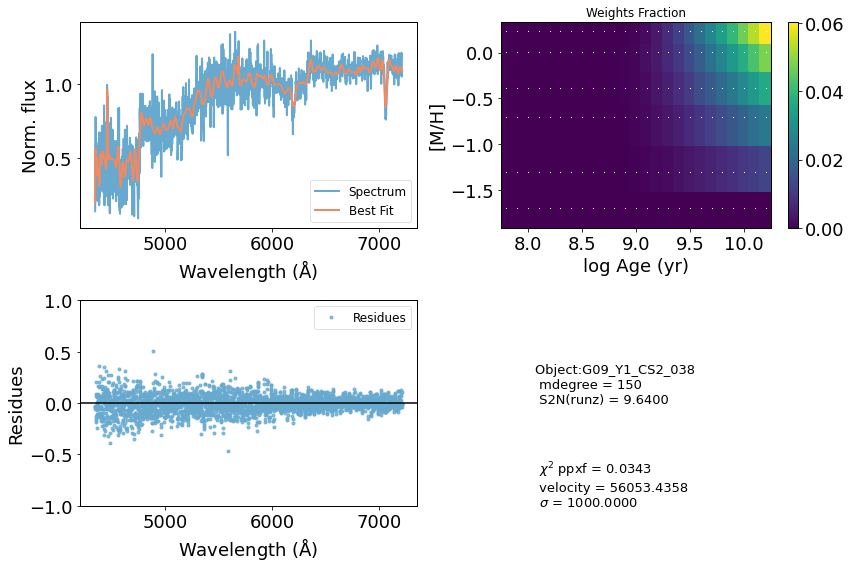

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49529      1000     0.300     0.300
 comp.  1:     47521        71
 comp.  2:     47102       179
Gas Reddening E(B-V): 4.491
chi2/DOF: 0.08561
method = capfit; Jac calls: 14; Func calls: 2247; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2014       1.6   47521    71
Comp:  2       Unknown          0       6.4   47102   179
Comp:  2       Unknown          0       6.4   47102   179
Comp:  2       Unknown          0       4.4   47102   179
Comp:  2       Unknown     0.9781       3.4   47102   179
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.828
Current $\chi^2$: 0.0856
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


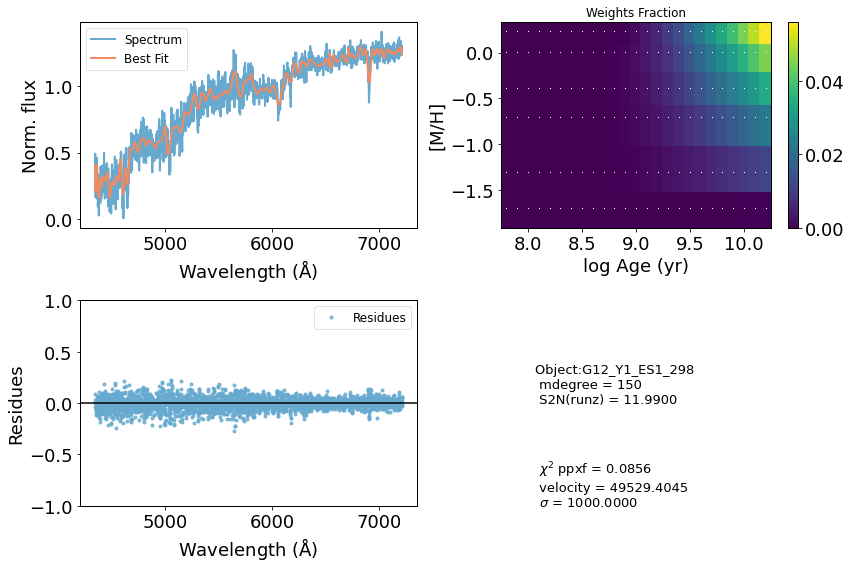

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48432      1000     0.231     0.300
 comp.  1:     46420       389
 comp.  2:     46628       137
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08795
method = capfit; Jac calls: 22; Func calls: 3526; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.5   46420   389
Comp:  2       Unknown      4.231       5.5   46628   137
Comp:  2       Unknown      1.942       7.3   46628   137
Comp:  2       Unknown          0       2.2   46628   137
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
M/L_r: 2.834
Current $\chi^2$: 0.0879
Elapsed time in PPXF: 23.40 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


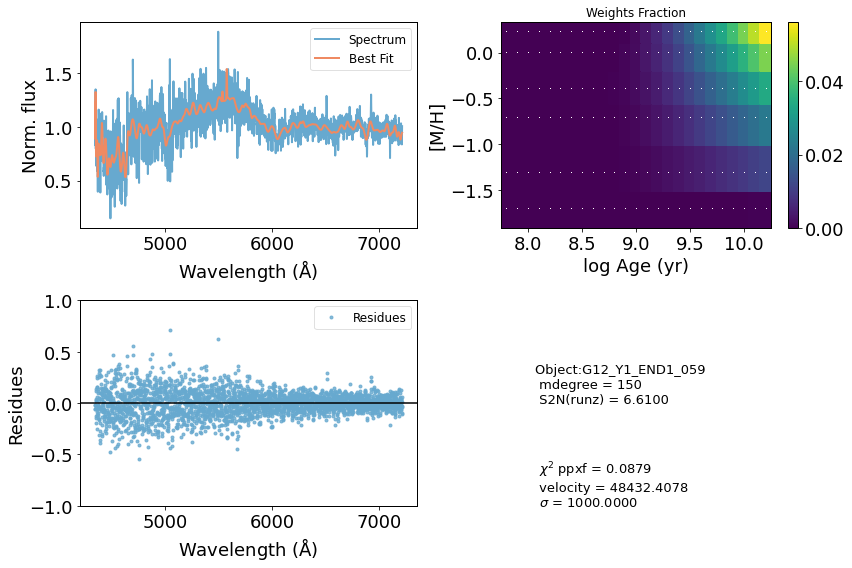

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44368      1000     0.300     0.300
 comp.  1:     43056       330
 comp.  2:     42263       105
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.1267
method = capfit; Jac calls: 13; Func calls: 2087; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  66 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1347         5   43056   330
Comp:  2       Unknown     0.2796       3.3   42263   105
Comp:  2       Unknown    0.07908       2.1   42263   105
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
M/L_r: 2.805
Current $\chi^2$: 0.1267
Elapsed time in PPXF: 13.44 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


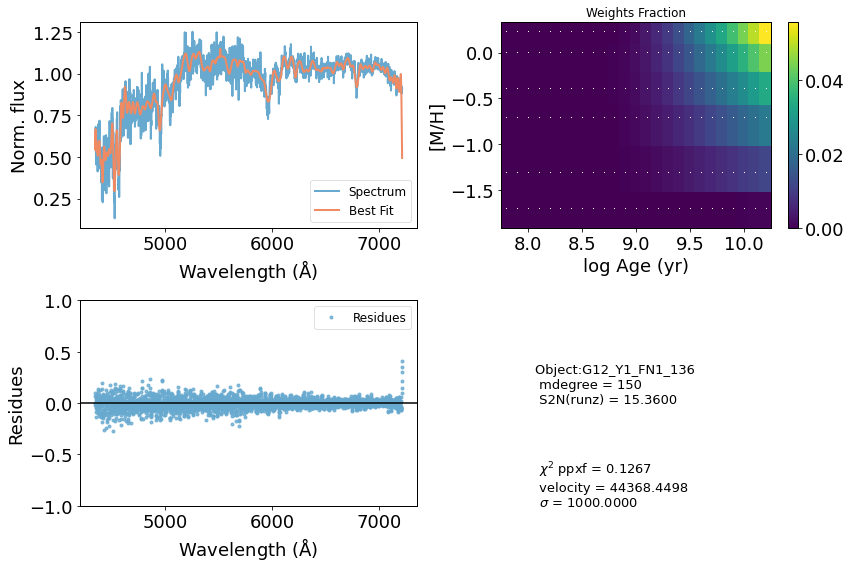

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36112      1000     0.235     0.300
 comp.  1:     34293       187
 comp.  2:     34393       687
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.267
method = capfit; Jac calls: 19; Func calls: 3046; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  62 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5619       4.5   34293   187
Comp:  2       Unknown          0       7.5   34393   687
Comp:  2       Unknown     0.6811       5.9   34393   687
Comp:  2       Unknown      5.265       5.4   34393   687
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
M/L_r: 2.808
Current $\chi^2$: 0.2670
Elapsed time in PPXF: 19.73 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


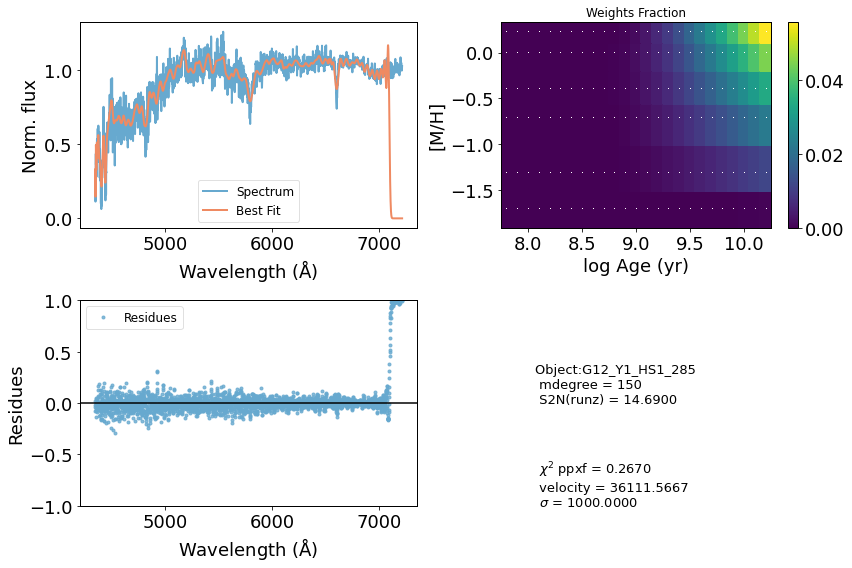

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37186       180     0.000     0.000
 comp.  1:     37186       180
 comp.  2:     37186       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4206
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  55 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        3.7       3.9   37186   180
Comp:  2       Unknown      0.765       4.6   37186   180
Comp:  2       Unknown     0.1892       2.5   37186   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.197
M/L_r: 3.401
Current $\chi^2$: 0.4206
Elapsed time in PPXF: 1.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


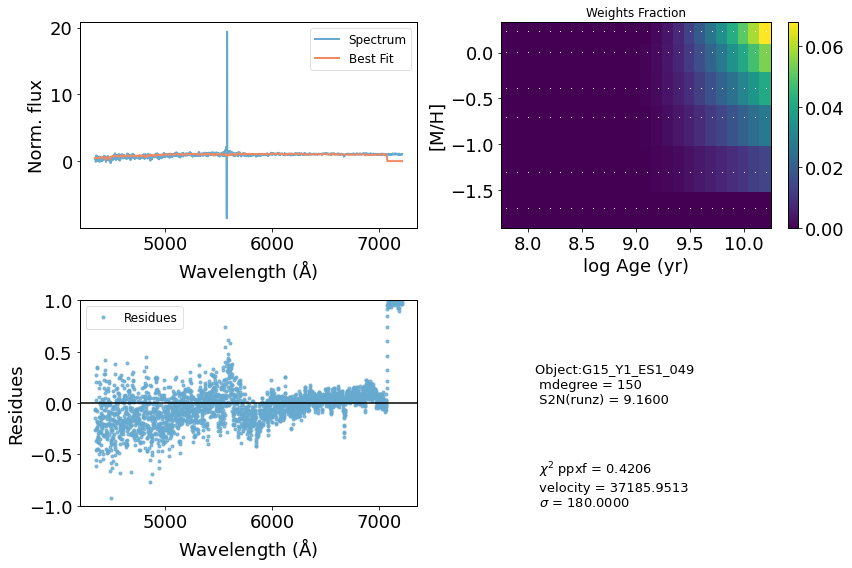

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67176      1000    -0.090     0.135
 comp.  1:     69322       161
 comp.  2:     69130        65
Gas Reddening E(B-V): 0.140
chi2/DOF: 0.002762
method = capfit; Jac calls: 33; Func calls: 5290; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  99 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.4   69322   161
Comp:  2       Unknown          0       2.8   69130    65
Comp:  2       Unknown          0       2.7   69130    65
Comp:  2       Unknown     0.1521       3.5   69130    65
---------------------------------------------------------
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -1.08
M/L_r: 0.988
Current $\chi^2$: 0.0028
Elapsed time in PPXF: 34.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


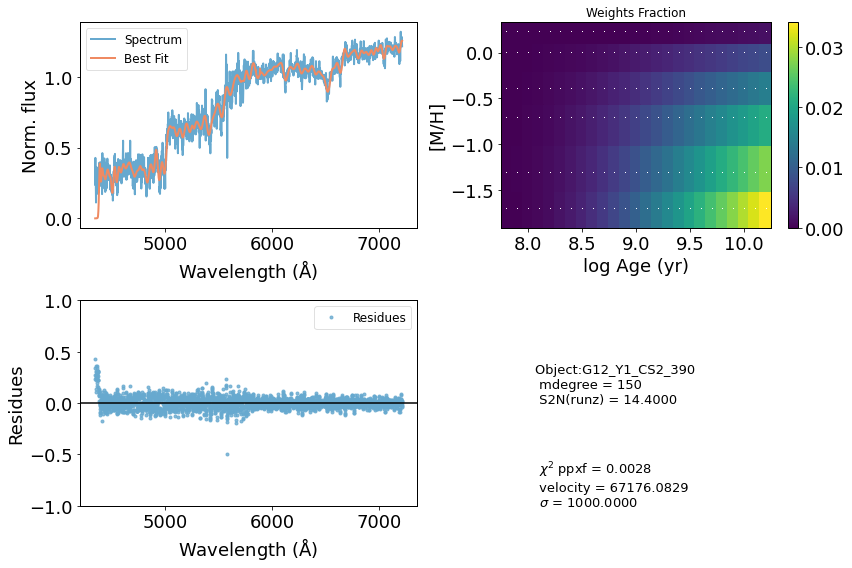

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64069      1000    -0.041     0.077
 comp.  1:     65609         1
 comp.  2:     65999       321
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004034
method = capfit; Jac calls: 17; Func calls: 2722; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  83 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         2   65609     1
Comp:  2       Unknown          0        13   65999   321
Comp:  2       Unknown          0        13   65999   321
Comp:  2       Unknown      1.338       5.3   65999   321
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.365
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.365
M/L_r: 2.158
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 17.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


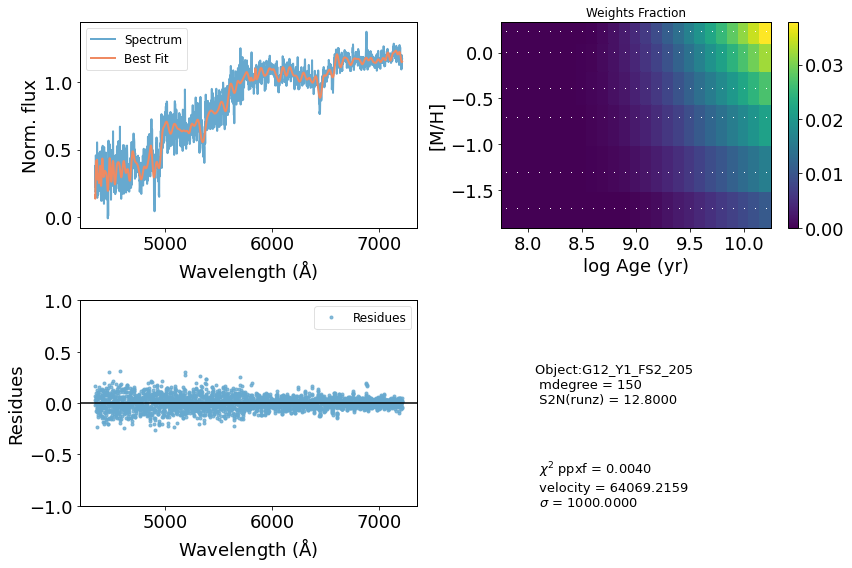

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     63345       854    -0.120    -0.143
 comp.  1:     64567       245
 comp.  2:     65715      1000
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.004134
method = capfit; Jac calls: 15; Func calls: 2403; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.9   64567   245
Comp:  2       Unknown          0        54   65715  1000
Comp:  2       Unknown          0        54   65715  1000
Comp:  2       Unknown      7.136       9.5   65715  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.264
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.264
M/L_r: 2.388
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 15.75 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


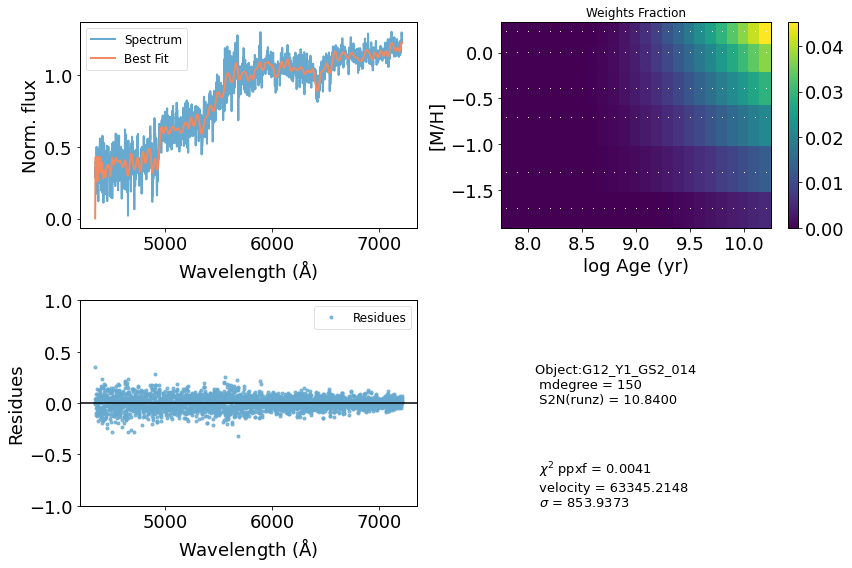

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50076      1000     0.300     0.300
 comp.  1:     48955       372
 comp.  2:     47990       198
Gas Reddening E(B-V): 5.509
chi2/DOF: 0.08851
method = capfit; Jac calls: 14; Func calls: 2243; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.677       2.6   48955   372
Comp:  2       Unknown          0       8.7   47990   198
Comp:  2       Unknown      8.555       9.8   47990   198
Comp:  2       Unknown          0       4.2   47990   198
Comp:  2       Unknown     0.5296       2.6   47990   198
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.939
Current $\chi^2$: 0.0885
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


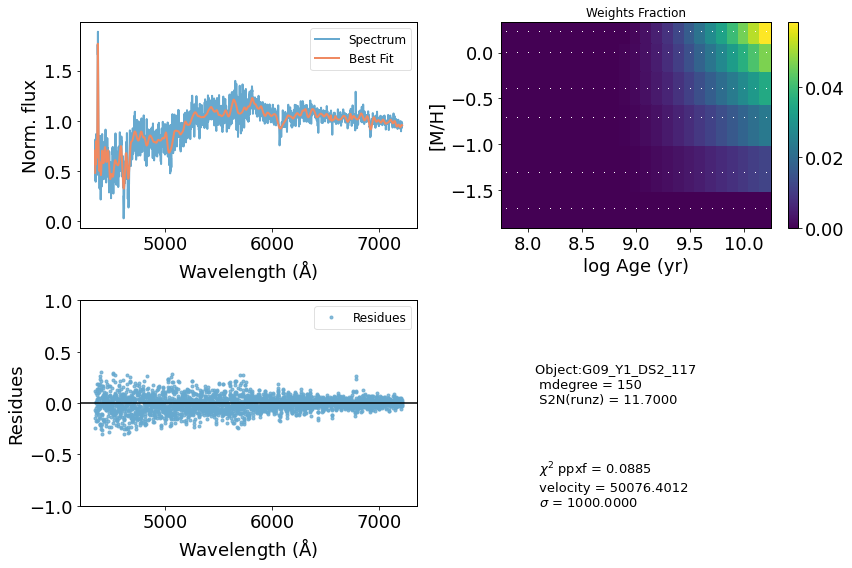

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52290      1000     0.300     0.300
 comp.  1:     50331         2
 comp.  2:     50395        65
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.04085
method = capfit; Jac calls: 15; Func calls: 2407; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1954       2.1   50331     2
Comp:  2       Unknown     0.2139         3   50395    65
Comp:  2       Unknown          0         3   50395    65
Comp:  2       Unknown     0.4396       3.2   50395    65
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.881
Current $\chi^2$: 0.0408
Elapsed time in PPXF: 15.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


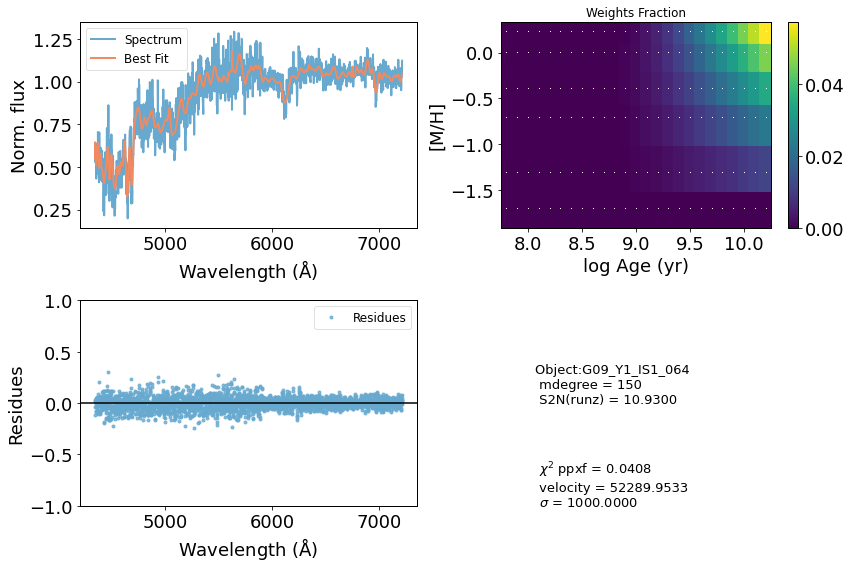

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64636      1000    -0.177     0.095
 comp.  1:     64834      1000
 comp.  2:     63920        64
Gas Reddening E(B-V): 3.268
chi2/DOF: 0.004059
method = capfit; Jac calls: 16; Func calls: 2566; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      13.79       6.3   64834  1000
Comp:  2       Unknown          0       2.6   63920    64
Comp:  2       Unknown          0       2.5   63920    64
Comp:  2       Unknown     0.5145       3.1   63920    64
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.984
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.984
M/L_r: 1.267
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 16.79 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


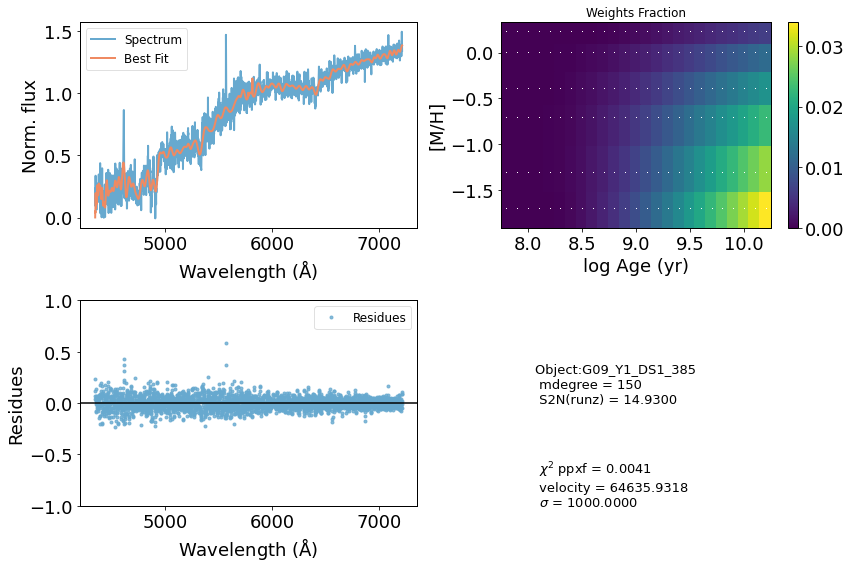

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60406       766     0.033     0.125
 comp.  1:     60031         1
 comp.  2:     59130      1000
Gas Reddening E(B-V): 0.204
chi2/DOF: 0.01403
method = capfit; Jac calls: 10; Func calls: 1607; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  50 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   60031     1
Comp:  2       Unknown          0        57   59130  1000
Comp:  2       Unknown          0        57   59130  1000
Comp:  2       Unknown      10.47       9.6   59130  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.232
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.232
M/L_r: 2.6
Current $\chi^2$: 0.0140
Elapsed time in PPXF: 9.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


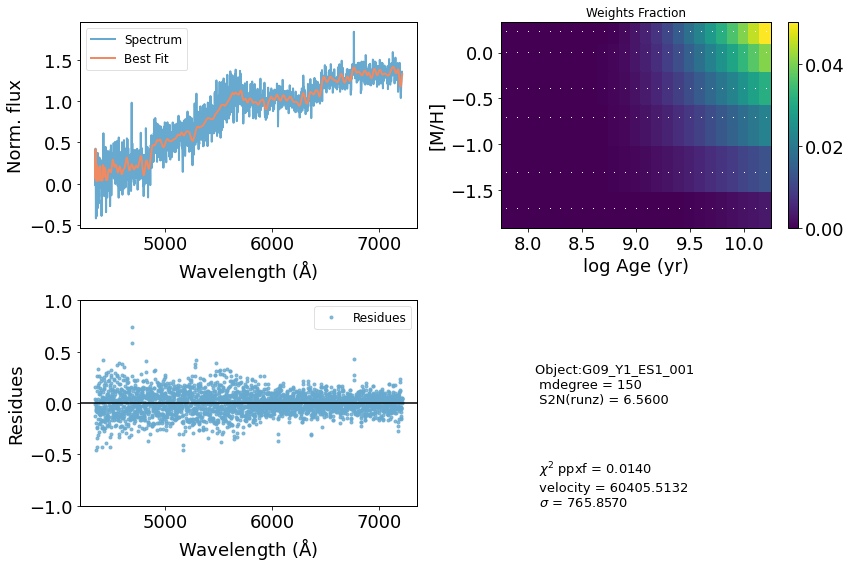

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37431       278    -0.000    -0.000
 comp.  1:     37239       374
 comp.  2:     35993         1
Gas Reddening E(B-V): 0.267
chi2/DOF: 0.416
method = capfit; Jac calls: 13; Func calls: 2086; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  76 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.133       5.3   37239   374
Comp:  2       Unknown          0       2.1   35993     1
Comp:  2       Unknown          0       1.4   35993     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.194
M/L_r: 1.862
Current $\chi^2$: 0.4160
Elapsed time in PPXF: 13.50 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


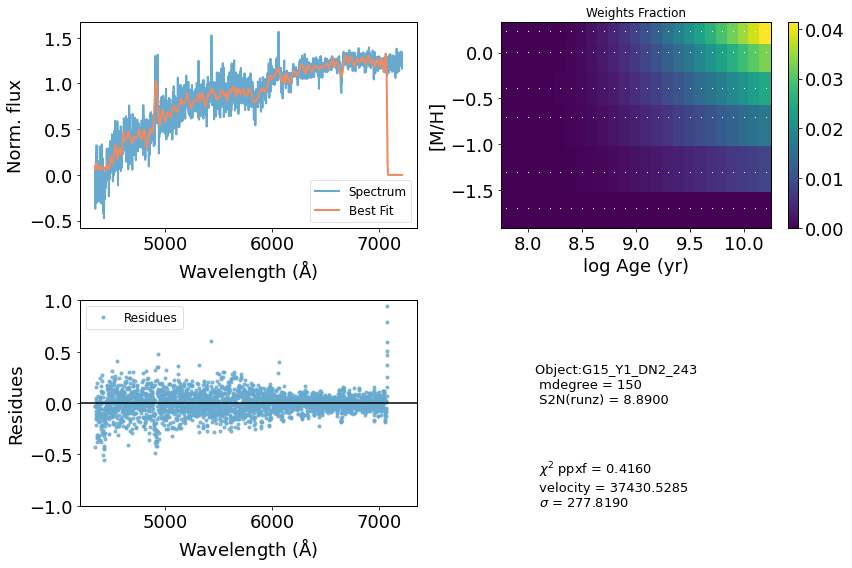

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35991      1000     0.300     0.300
 comp.  1:     34634       371
 comp.  2:     34612       460
Gas Reddening E(B-V): 2.212
chi2/DOF: 0.234
method = capfit; Jac calls: 16; Func calls: 2567; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.03         4   34634   371
Comp:  2       Unknown          0       6.6   34612   460
Comp:  2       Unknown    0.02082       5.2   34612   460
Comp:  2       Unknown      2.668       4.9   34612   460
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.203
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.203
M/L_r: 2.751
Current $\chi^2$: 0.2340
Elapsed time in PPXF: 16.56 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


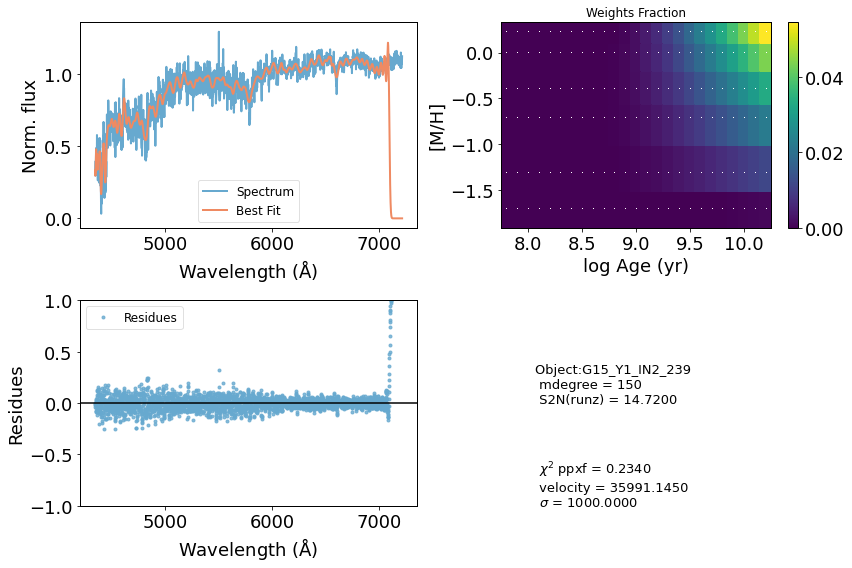

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39575        63    -0.000    -0.001
 comp.  1:     38993       160
 comp.  2:     38411       966
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.4077
method = capfit; Jac calls: 11; Func calls: 1766; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.796       1.6   38993   160
Comp:  2       Unknown          0       8.1   38411   966
Comp:  2       Unknown      9.175       5.4   38411   966
---------------------------------------------------------
Weighted <logAge> [yr]: 9.55
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 9.55
Weighted <[M/H]>: -1.12
M/L_r: 0.9323
Current $\chi^2$: 0.4077
Elapsed time in PPXF: 10.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


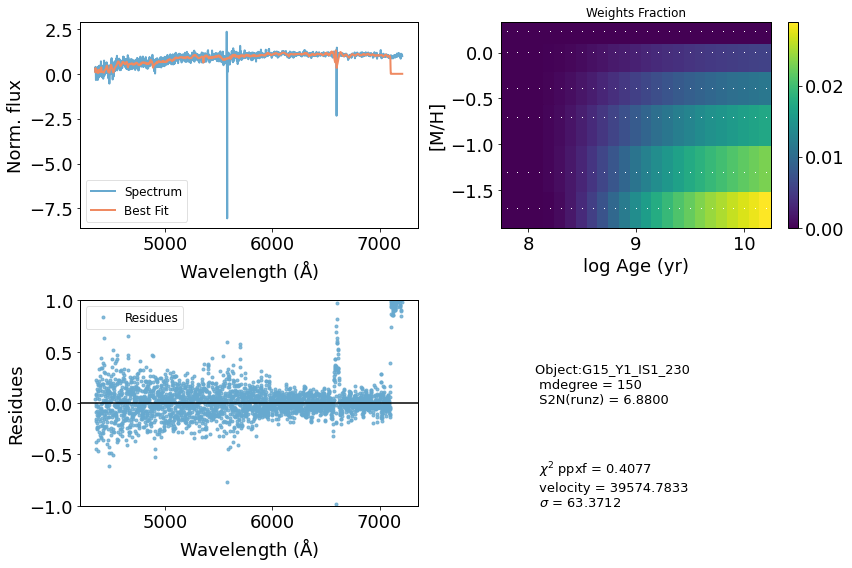

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47707      1000     0.300     0.300
 comp.  1:     45764       252
 comp.  2:     45678       165
Gas Reddening E(B-V): 0.470
chi2/DOF: 0.07621
method = capfit; Jac calls: 14; Func calls: 2248; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.1   45764   252
Comp:  2       Unknown     0.6845       4.2   45678   165
Comp:  2       Unknown          0       2.7   45678   165
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.198
M/L_r: 2.844
Current $\chi^2$: 0.0762
Elapsed time in PPXF: 14.02 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


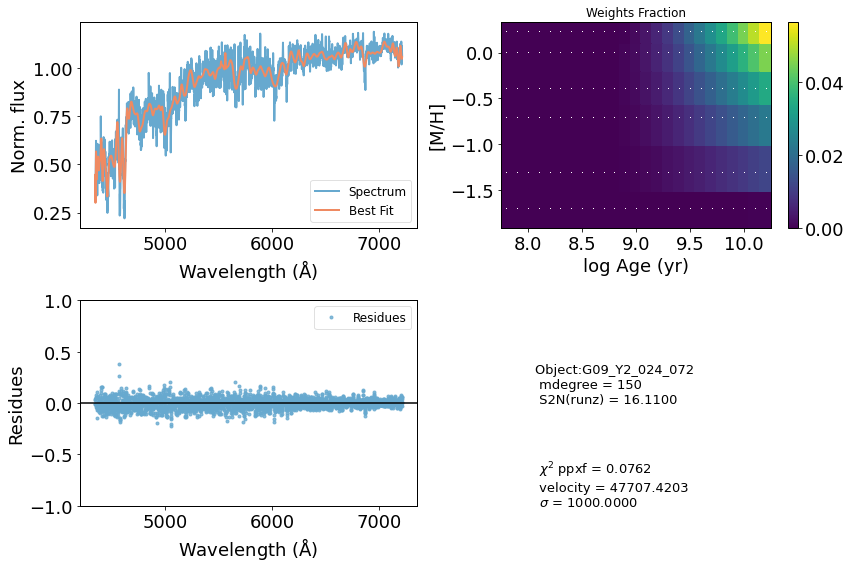

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49381      1000     0.300     0.300
 comp.  1:     47344        66
 comp.  2:     47348        24
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.1095
method = capfit; Jac calls: 18; Func calls: 2890; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.333       1.2   47344    66
Comp:  2       Unknown          0      0.14   47348    24
Comp:  2       Unknown          0     0.088   47348    24
Comp:  2       Unknown     0.1025       2.3   47348    24
Comp:  2       Unknown          0       1.3   47348    24
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.872
Current $\chi^2$: 0.1095
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


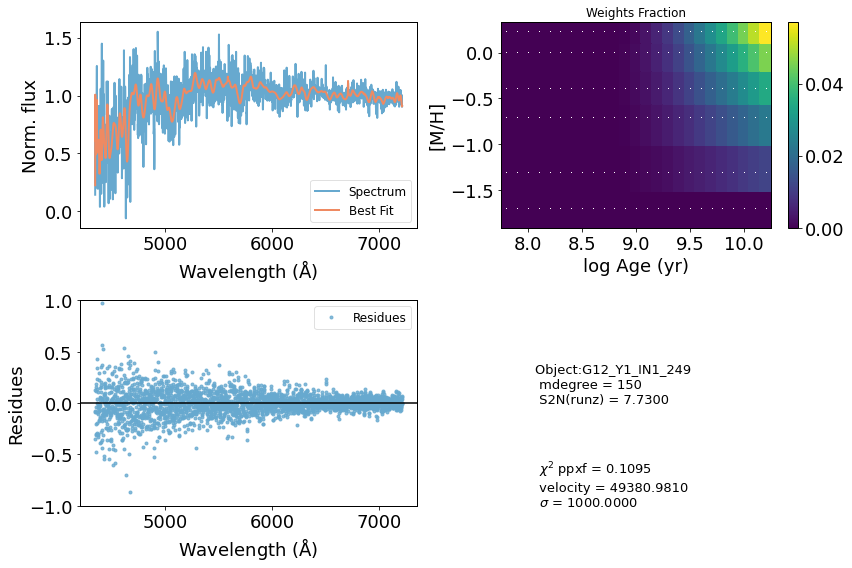

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45949      1000     0.300     0.300
 comp.  1:     44035       295
 comp.  2:     43633       442
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.1044
method = capfit; Jac calls: 15; Func calls: 2408; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.2   44035   295
Comp:  2       Unknown     0.7158       6.4   43633   442
Comp:  2       Unknown      1.126       4.1   43633   442
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.825
Current $\chi^2$: 0.1044
Elapsed time in PPXF: 14.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


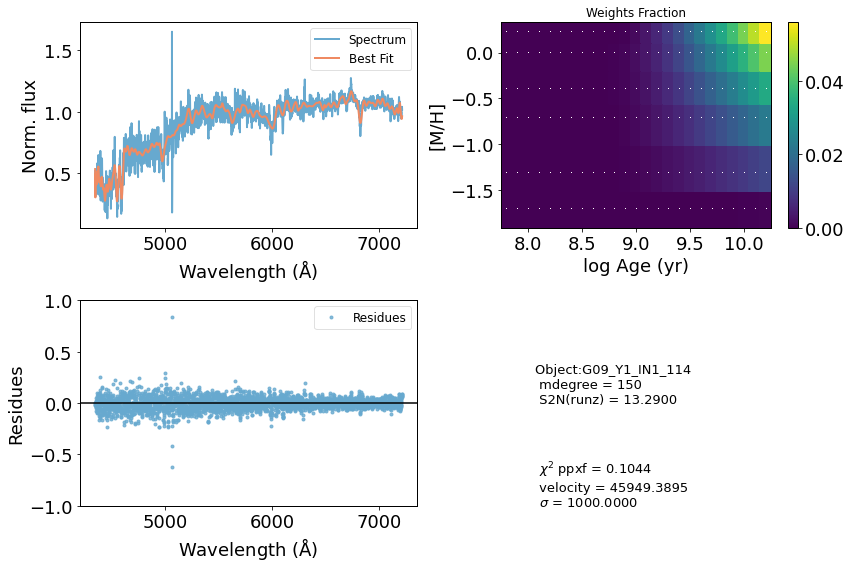

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54122      1000     0.300     0.300
 comp.  1:     52261        86
 comp.  2:     52411       190
Gas Reddening E(B-V): 3.208
chi2/DOF: 0.04047
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1783       1.6   52261    86
Comp:  2       Unknown     0.7252         7   52411   190
Comp:  2       Unknown      2.304       7.1   52411   190
Comp:  2       Unknown    0.05628       4.5   52411   190
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.921
Current $\chi^2$: 0.0405
Elapsed time in PPXF: 13.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


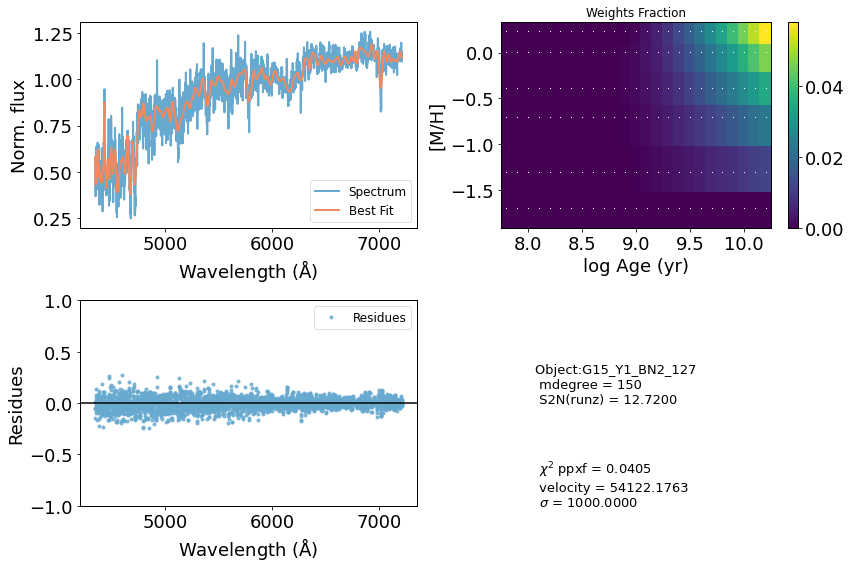

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35484       180     0.000     0.000
 comp.  1:     35484       180
 comp.  2:     35484       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2515
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  71 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.753       4.1   35484   180
Comp:  2       Unknown     0.4507       3.9   35484   180
Comp:  2       Unknown     0.6984       2.7   35484   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.813
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.813
M/L_r: 2.279
Current $\chi^2$: 0.2515
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


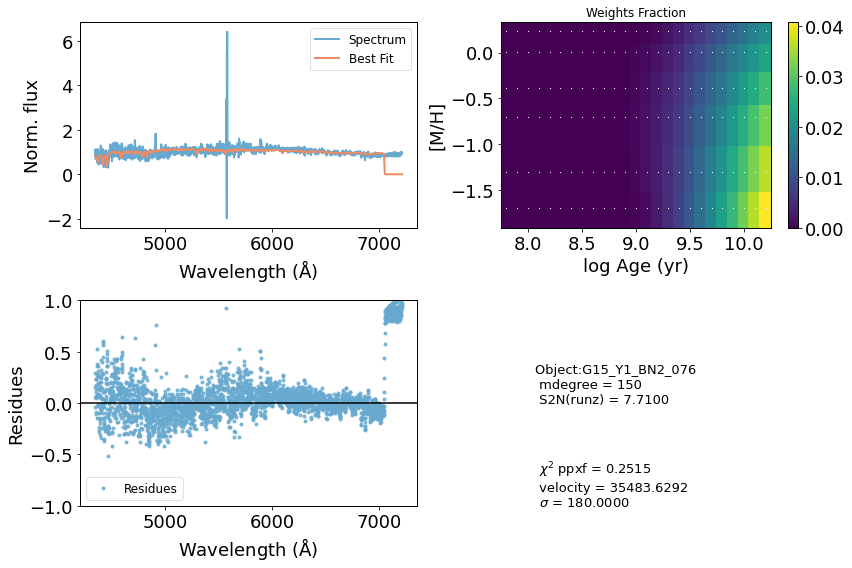

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48976      1000     0.251     0.300
 comp.  1:     47030        35
 comp.  2:     47363       973
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.07841
method = capfit; Jac calls: 28; Func calls: 4485; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1711       1.2   47030    35
Comp:  2       Unknown      46.41   1.1e+03   47363   973
Comp:  2       Unknown          0   1.1e+03   47363   973
Comp:  2       Unknown      11.88        10   47363   973
Comp:  2       Unknown     0.7582       6.6   47363   973
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.777
Current $\chi^2$: 0.0784
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


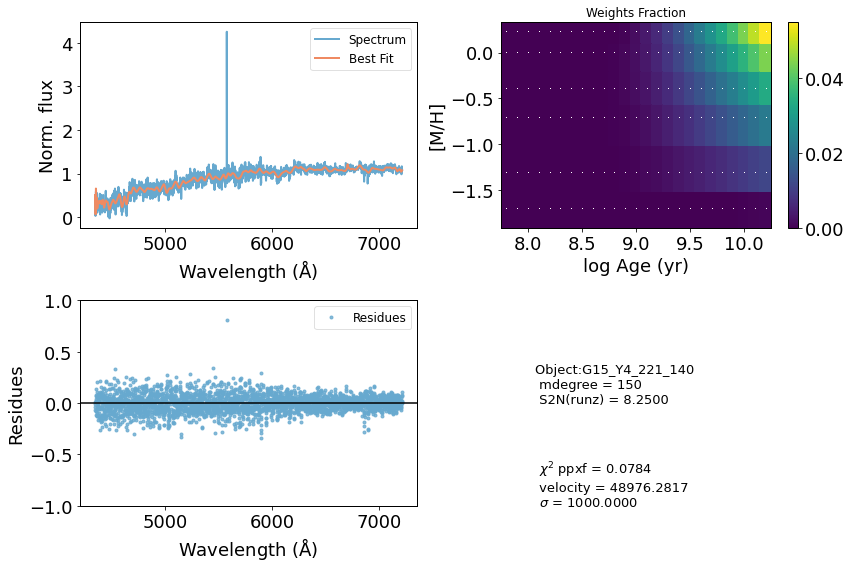

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24175       180     0.000     0.000
 comp.  1:     24175       180
 comp.  2:     24175       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4118
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  75 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.302       3.8   24175   180
Comp:  2       Unknown     0.3687       1.9   24175   180
Comp:  2       Unknown     0.2904       1.9   24175   180
Comp:  2       Unknown          0       4.5   24175   180
Comp:  2       Unknown      1.262       2.9   24175   180
Comp:  2       Unknown     0.2113       2.5   24175   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.433
Weighted <logAge> [yr]: 9.86
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


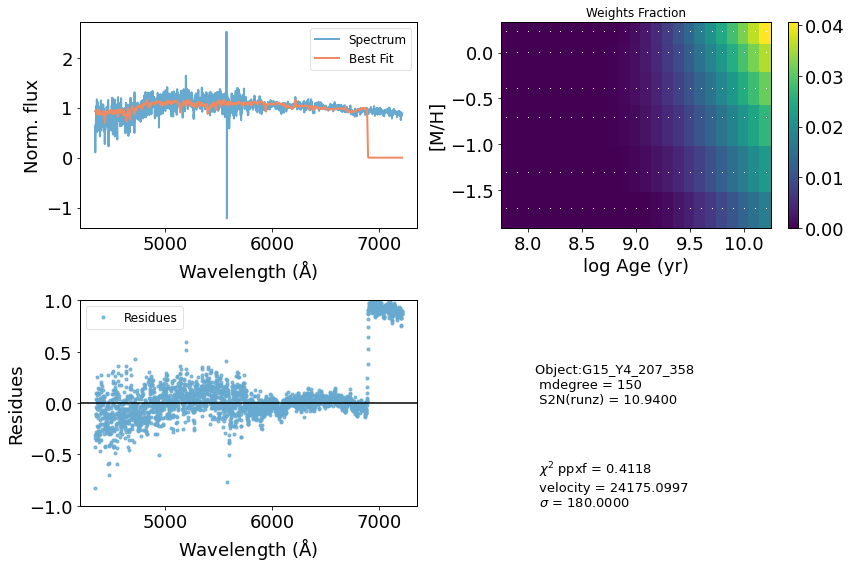

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47978      1000     0.300     0.300
 comp.  1:     45947         1
 comp.  2:     46001       134
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.1097
method = capfit; Jac calls: 13; Func calls: 2084; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1217         2   45947     1
Comp:  2       Unknown     0.5698       3.7   46001   134
Comp:  2       Unknown          0       2.4   46001   134
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.906
Current $\chi^2$: 0.1097
Elapsed time in PPXF: 12.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


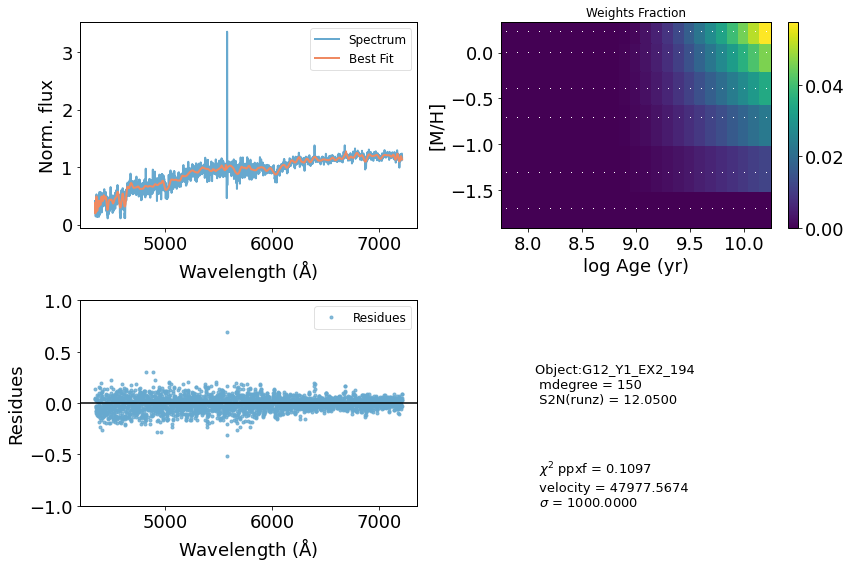

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56329      1000     0.300     0.300
 comp.  1:     54537       251
 comp.  2:     54833       200
Gas Reddening E(B-V): 2.976
chi2/DOF: 0.02236
method = capfit; Jac calls: 18; Func calls: 2888; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2983       2.4   54537   251
Comp:  2       Unknown          0       7.6   54833   200
Comp:  2       Unknown      4.855       7.7   54833   200
Comp:  2       Unknown      1.055       5.2   54833   200
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.02
Current $\chi^2$: 0.0224
Elapsed time in PPXF: 18.65 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


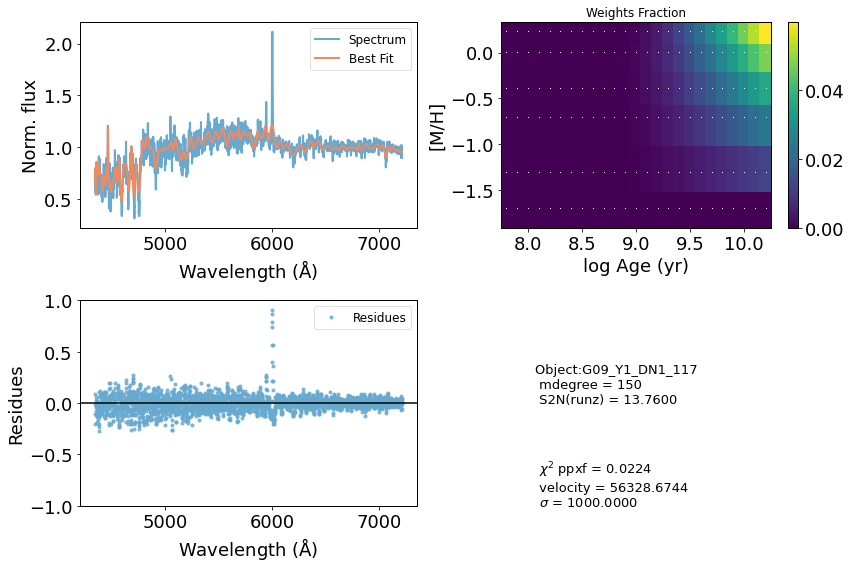

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42886      1000     0.300     0.300
 comp.  1:     40891        49
 comp.  2:     40883       248
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.188
method = capfit; Jac calls: 24; Func calls: 3849; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1249       1.1   40891    49
Comp:  2       Unknown      1.135       4.6   40883   248
Comp:  2       Unknown          0         3   40883   248
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
M/L_r: 2.861
Current $\chi^2$: 0.1880
Elapsed time in PPXF: 23.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


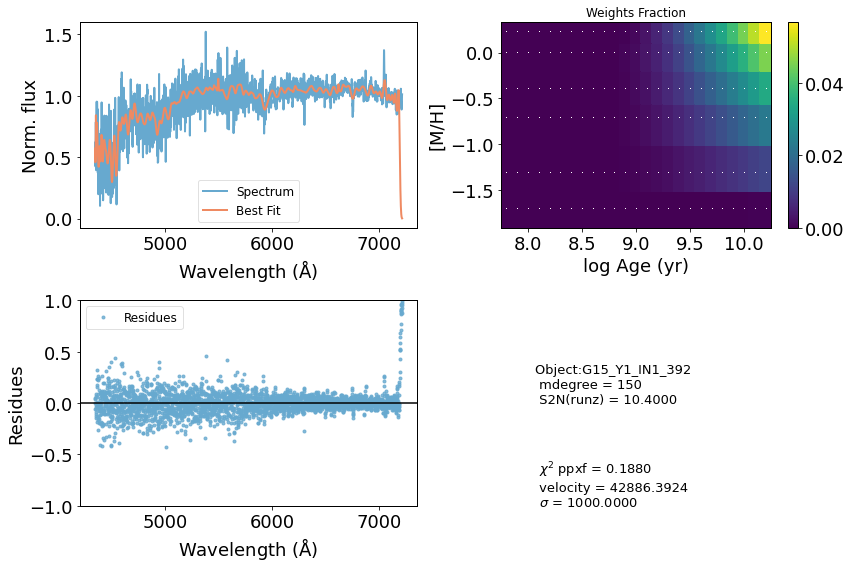

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55968      1000     0.300     0.300
 comp.  1:     55297      1000
 comp.  2:     54545       141
Gas Reddening E(B-V): 9.825
chi2/DOF: 0.0327
method = capfit; Jac calls: 18; Func calls: 2885; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.08       5.1   55297  1000
Comp:  2       Unknown          0   2.1e+02   54545   141
Comp:  2       Unknown     0.4339   2.2e+02   54545   141
Comp:  2       Unknown     0.2583       4.3   54545   141
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 3.012
Current $\chi^2$: 0.0327
Elapsed time in PPXF: 18.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


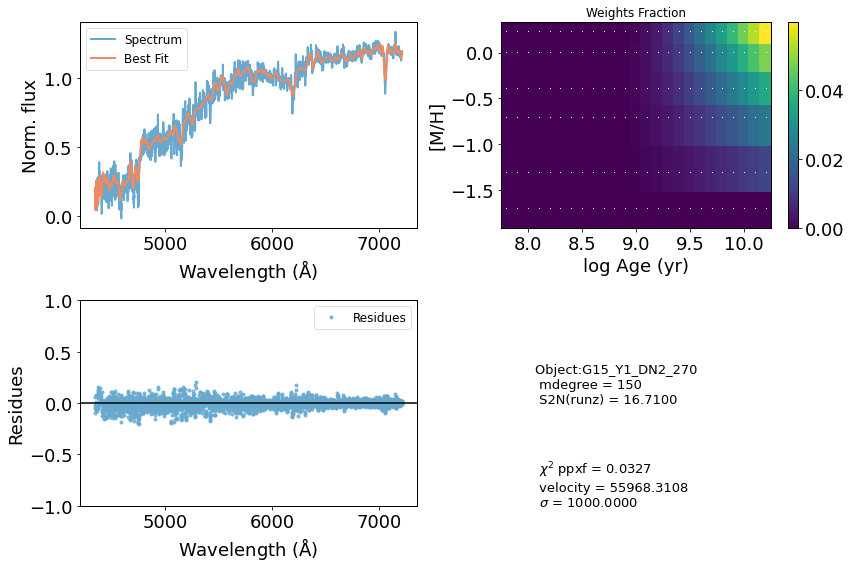

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56704      1000     0.300     0.300
 comp.  1:     54894       111
 comp.  2:     54845       174
Gas Reddening E(B-V): 0.409
chi2/DOF: 0.02838
method = capfit; Jac calls: 12; Func calls: 1923; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   54894   111
Comp:  2       Unknown          0       7.2   54845   174
Comp:  2       Unknown          0       7.1   54845   174
Comp:  2       Unknown          0       5.1   54845   174
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.196
M/L_r: 3.096
Current $\chi^2$: 0.0284
Elapsed time in PPXF: 12.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


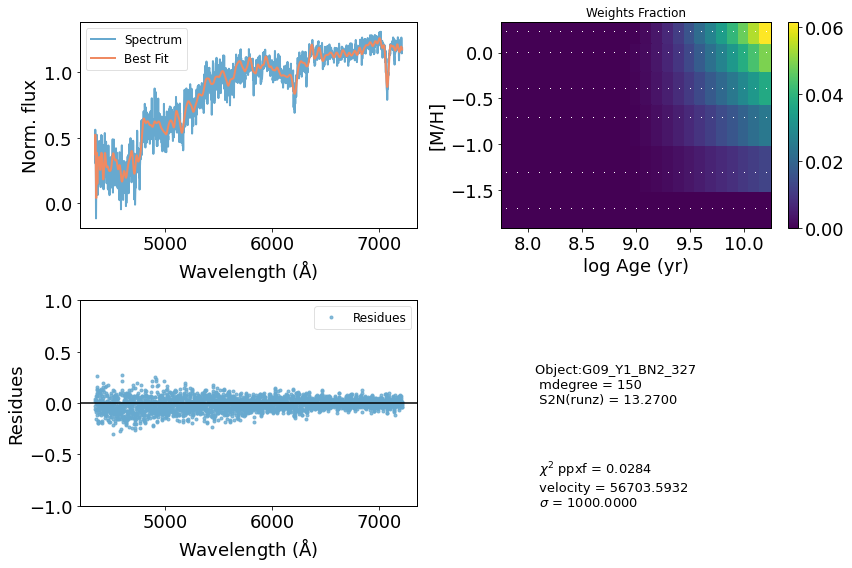

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54135      1000     0.300     0.300
 comp.  1:     52117        73
 comp.  2:     52497        72
Gas Reddening E(B-V): 6.786
chi2/DOF: 0.06075
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.506       1.1   52117    73
Comp:  2       Unknown      2.263       2.3   52497    72
Comp:  2       Unknown      4.196       4.8   52497    72
Comp:  2       Unknown          0       3.1   52497    72
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.018
Current $\chi^2$: 0.0607
Elapsed time in PPXF: 18.80 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


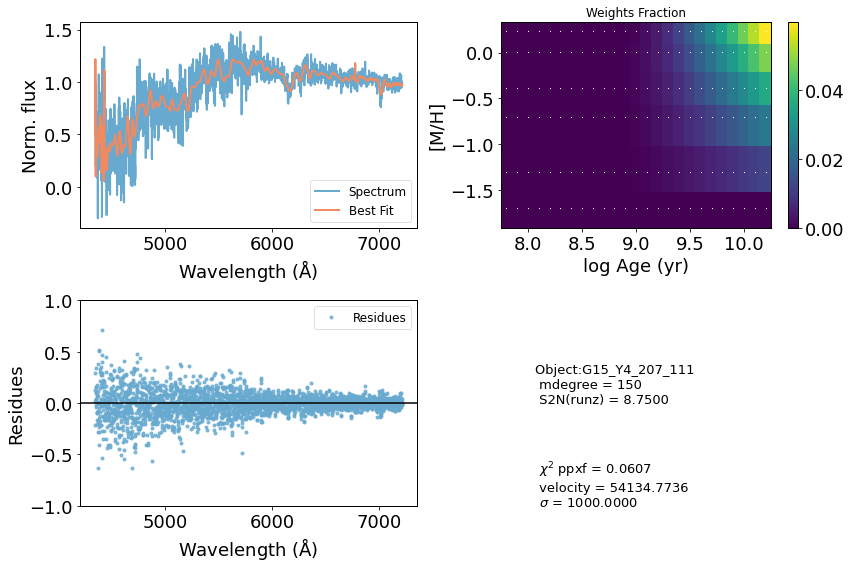

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     28333      1000     0.091     0.300
 comp.  1:     25965       677
 comp.  2:     26316       202
Gas Reddening E(B-V): 5.097
chi2/DOF: 0.3559
method = capfit; Jac calls: 21; Func calls: 3363; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.653       4.7   25965   677
Comp:  2       Unknown     0.6807       2.4   26316   202
Comp:  2       Unknown          0       2.4   26316   202
Comp:  2       Unknown     0.6934       4.2   26316   202
Comp:  2       Unknown    0.06276       3.3   26316   202
Comp:  2       Unknown          0         3   26316   202
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.21
Weighted <logAge> [yr]: 9.83
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


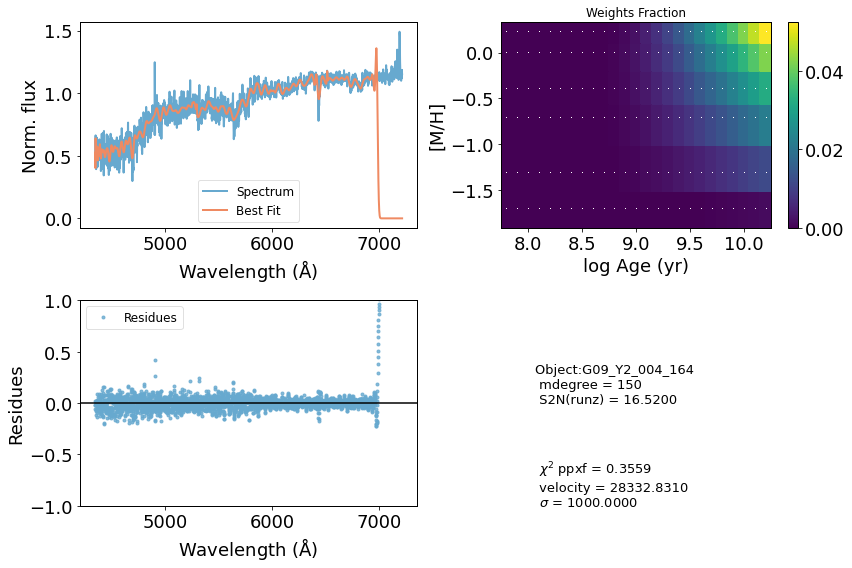

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60914       869     0.000     0.056
 comp.  1:     60971       863
 comp.  2:     60964       185
Gas Reddening E(B-V): 1.098
chi2/DOF: 0.0164
method = capfit; Jac calls: 7; Func calls: 1128; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  25 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       9.08       6.3   60971   863
Comp:  2       Unknown          0       6.6   60964   185
Comp:  2       Unknown          0       6.6   60964   185
Comp:  2       Unknown          0       3.6   60964   185
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.204
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.204
M/L_r: 2.817
Current $\chi^2$: 0.0164
Elapsed time in PPXF: 7.85 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


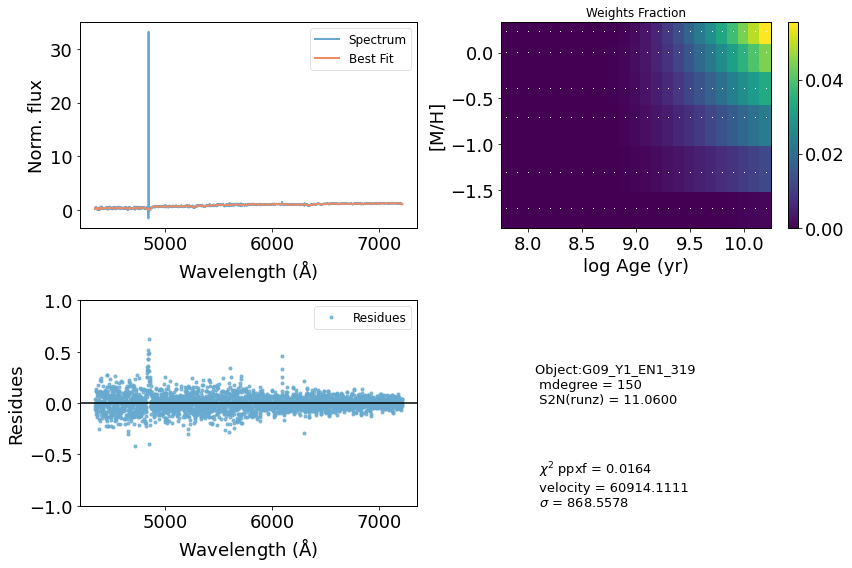

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46376      1000     0.300     0.300
 comp.  1:     44751       231
 comp.  2:     44829       164
Gas Reddening E(B-V): 0.016
chi2/DOF: 0.08938
method = capfit; Jac calls: 13; Func calls: 2087; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.8   44751   231
Comp:  2       Unknown          0       3.9   44829   164
Comp:  2       Unknown     0.5924       3.5   44829   164
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.813
Current $\chi^2$: 0.0894
Elapsed time in PPXF: 14.80 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


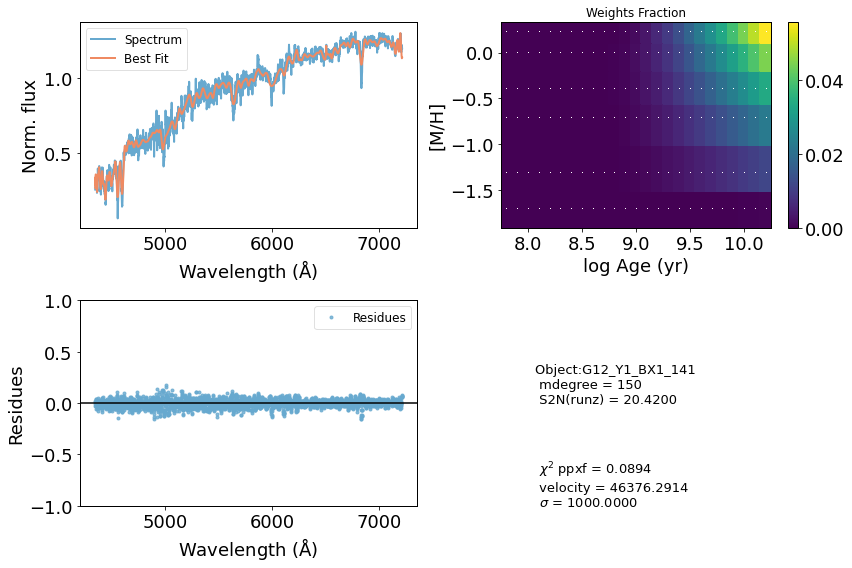

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60828       388    -0.300    -0.300
 comp.  1:     62816       552
 comp.  2:     63207         1
Gas Reddening E(B-V): 7.787
chi2/DOF: 11.1
method = capfit; Jac calls: 22; Func calls: 3527; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.2   62816   552
Comp:  2       Unknown          0      0.17   63207     1
Comp:  2       Unknown    0.04785    0.0055   63207     1
Comp:  2       Unknown          0       2.6   63207     1
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -0.185
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -0.185
M/L_r: 4.125
Current $\chi^2$: 11.0984
Elapsed time in PPXF: 22.02 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


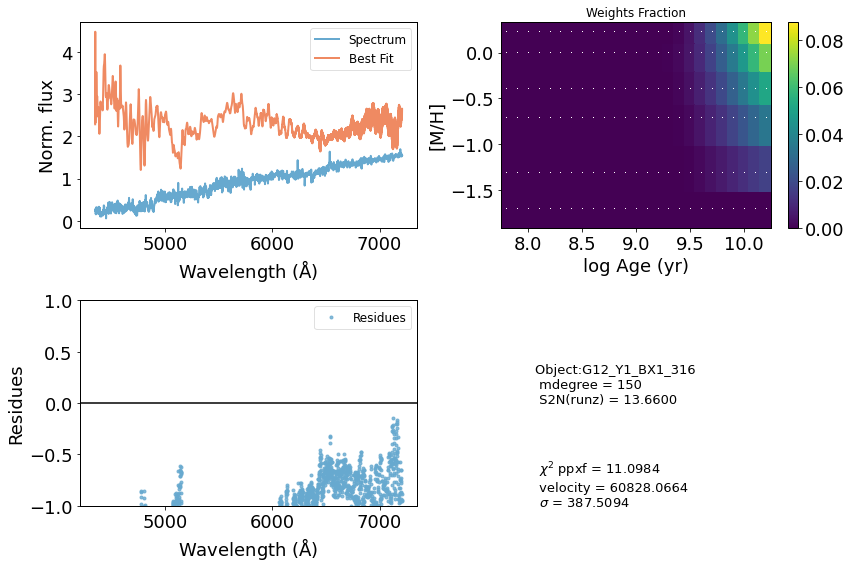

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42954      1000     0.300     0.300
 comp.  1:     40098       611
 comp.  2:     40816       337
Gas Reddening E(B-V): 0.139
chi2/DOF: 0.1645
method = capfit; Jac calls: 16; Func calls: 2566; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.584       6.8   40098   611
Comp:  2       Unknown      1.578       5.4   40816   337
Comp:  2       Unknown          0       3.7   40816   337
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.783
Current $\chi^2$: 0.1645
Elapsed time in PPXF: 17.81 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


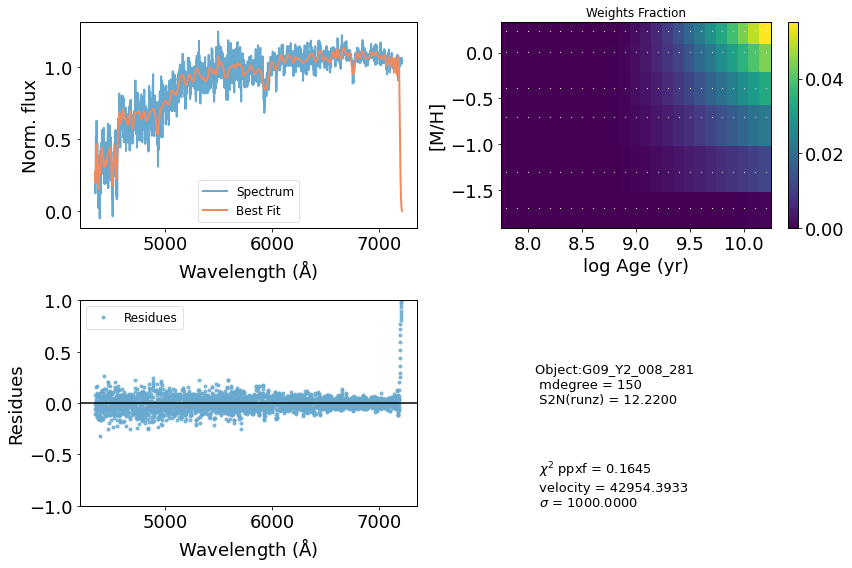

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30739      1000     0.146     0.300
 comp.  1:     29404       332
 comp.  2:     29340       811
Gas Reddening E(B-V): 0.833
chi2/DOF: 0.3214
method = capfit; Jac calls: 22; Func calls: 3522; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4246       5.1   29404   332
Comp:  2       Unknown        4.9         9   29340   811
Comp:  2       Unknown          0       8.9   29340   811
Comp:  2       Unknown       2.21       8.2   29340   811
Comp:  2       Unknown     0.0647       6.2   29340   811
Comp:  2       Unknown       22.3       6.5   29340   811
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.85
Weighted <[M/

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


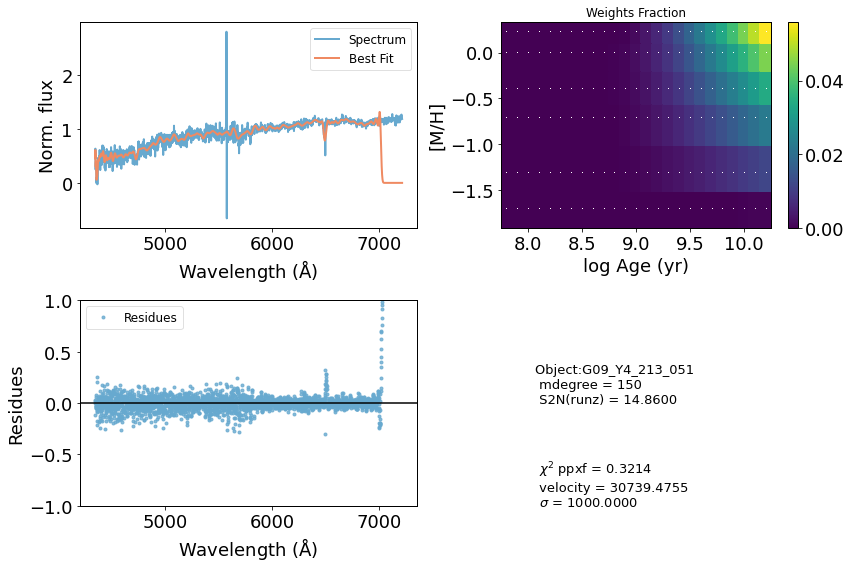

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56861      1000     0.300     0.300
 comp.  1:     55310       201
 comp.  2:     55077         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02495
method = capfit; Jac calls: 17; Func calls: 2723; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9728       4.3   55310   201
Comp:  2       Unknown          0       2.5   55077     1
Comp:  2       Unknown          0       2.4   55077     1
Comp:  2       Unknown      0.428       3.2   55077     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.196
M/L_r: 3.084
Current $\chi^2$: 0.0250
Elapsed time in PPXF: 19.56 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


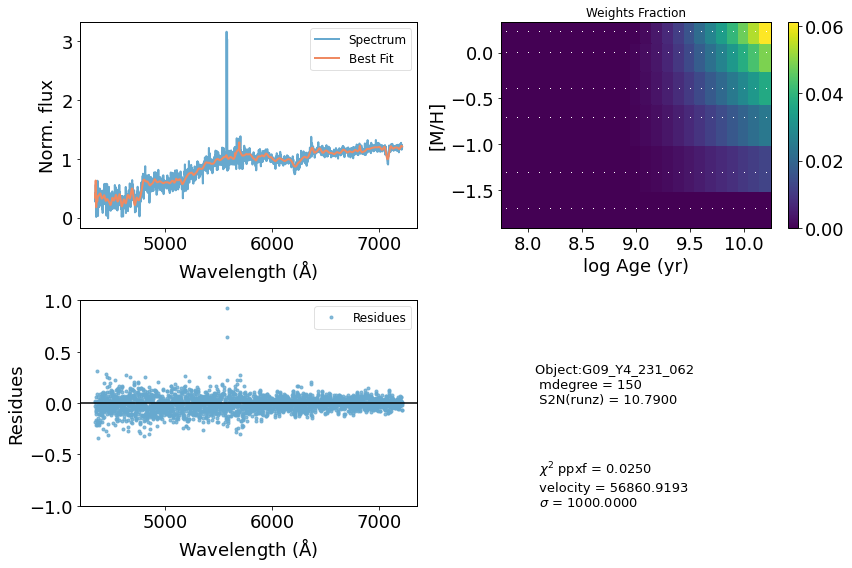

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35343      1000     0.257     0.300
 comp.  1:     33426       176
 comp.  2:     33507       376
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2188
method = capfit; Jac calls: 28; Func calls: 4483; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4304       4.3   33426   176
Comp:  2       Unknown          0       5.6   33507   376
Comp:  2       Unknown     0.7291       4.6   33507   376
Comp:  2       Unknown      1.349       4.5   33507   376
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
M/L_r: 2.812
Current $\chi^2$: 0.2188
Elapsed time in PPXF: 32.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


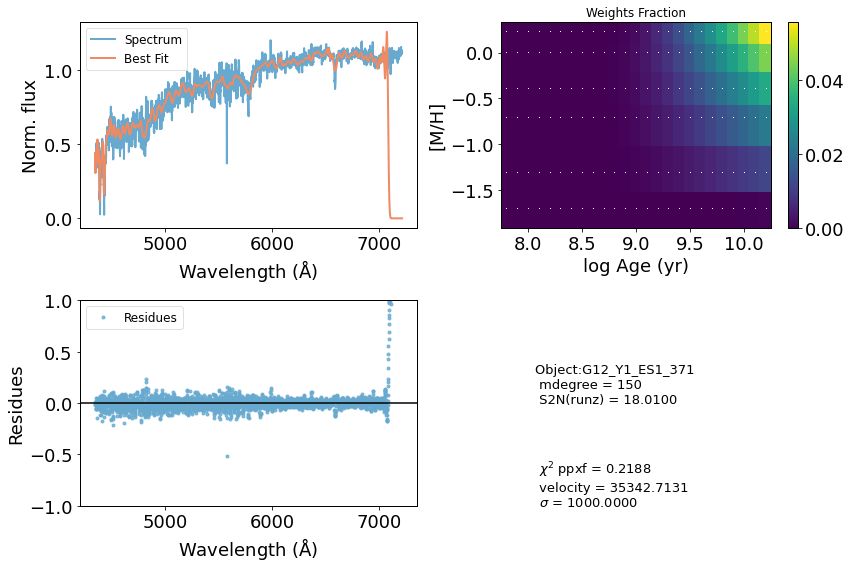

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60099      1000     0.067     0.128
 comp.  1:     59732        56
 comp.  2:     59825       340
Gas Reddening E(B-V): 6.589
chi2/DOF: 0.006562
method = capfit; Jac calls: 9; Func calls: 1443; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3634       1.3   59732    56
Comp:  2       Unknown      2.634       6.4   59825   340
Comp:  2       Unknown          0       8.9   59825   340
Comp:  2       Unknown      2.159       5.4   59825   340
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.26
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.26
M/L_r: 2.43
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 10.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


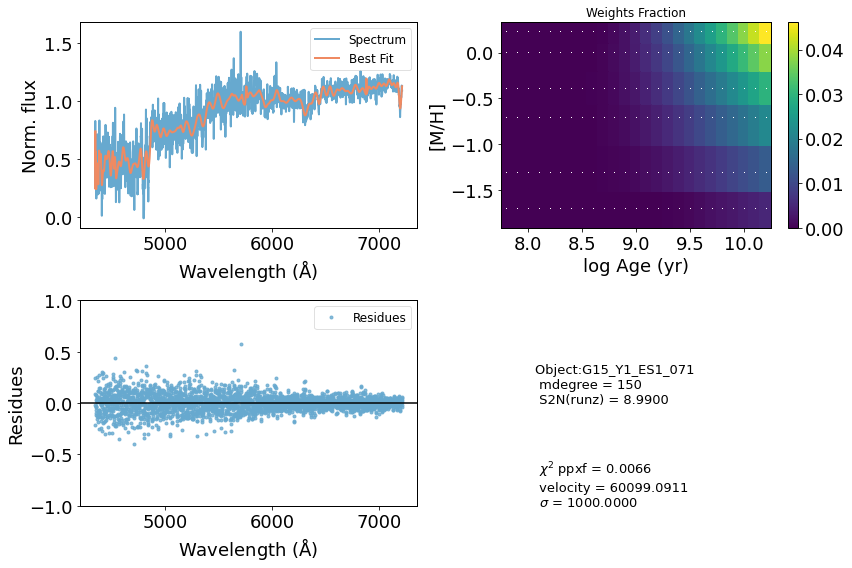

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32516      1000     0.122     0.296
 comp.  1:     30520       161
 comp.  2:     30792       120
Gas Reddening E(B-V): 0.740
chi2/DOF: 0.349
method = capfit; Jac calls: 18; Func calls: 2886; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.8   30520   161
Comp:  2       Unknown          0       3.3   30792   120
Comp:  2       Unknown          0       2.5   30792   120
Comp:  2       Unknown     0.2825       2.1   30792   120
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.821
Current $\chi^2$: 0.3490
Elapsed time in PPXF: 19.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


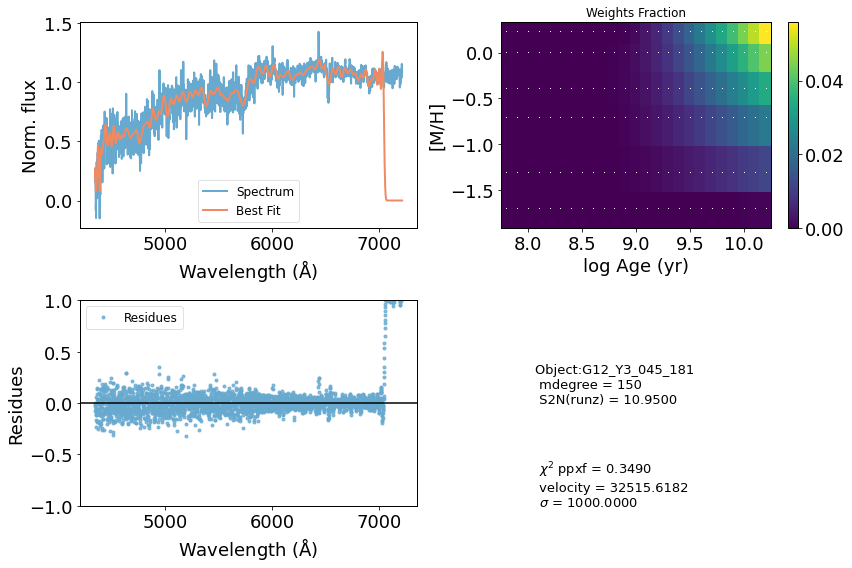

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64287      1000    -0.095     0.080
 comp.  1:     66327        75
 comp.  2:     66310       416
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02496
method = capfit; Jac calls: 72; Func calls: 11528; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.171       3.5   66327    75
Comp:  2       Unknown      3.532        16   66310   416
Comp:  2       Unknown          0        16   66310   416
Comp:  2       Unknown          0       7.8   66310   416
---------------------------------------------------------
Weighted <logAge> [yr]: 9.35
Weighted <[M/H]>: -0.63
Weighted <logAge> [yr]: 9.35
Weighted <[M/H]>: -0.63
M/L_r: 0.4947
Current $\chi^2$: 0.0250
Elapsed time in PPXF: 81.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


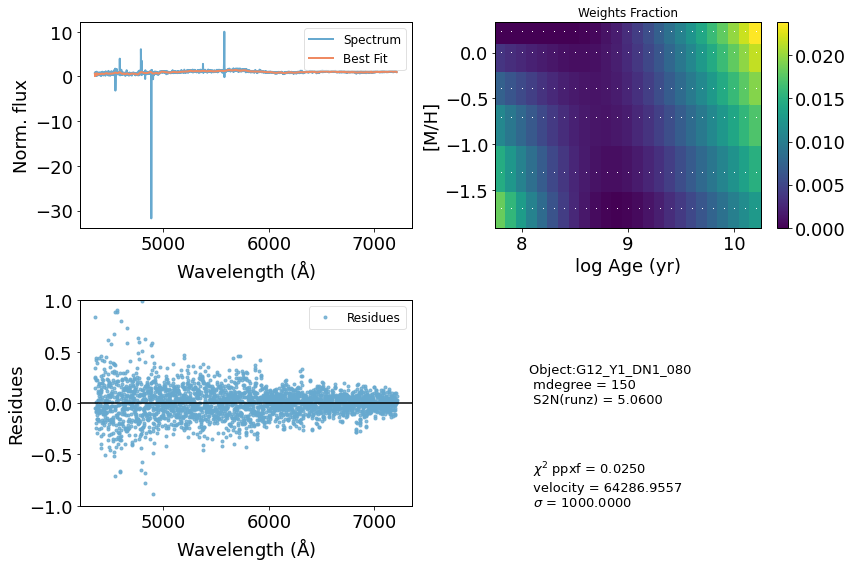

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50191      1000     0.300     0.300
 comp.  1:     48092       311
 comp.  2:     48301       242
Gas Reddening E(B-V): 9.392
chi2/DOF: 0.08613
method = capfit; Jac calls: 14; Func calls: 2246; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5564       2.6   48092   311
Comp:  2       Unknown      74.05   1.8e+02   48301   242
Comp:  2       Unknown      76.76   1.8e+02   48301   242
Comp:  2       Unknown          0         5   48301   242
Comp:  2       Unknown     0.5014       3.4   48301   242
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.935
Current $\chi^2$: 0.0861
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


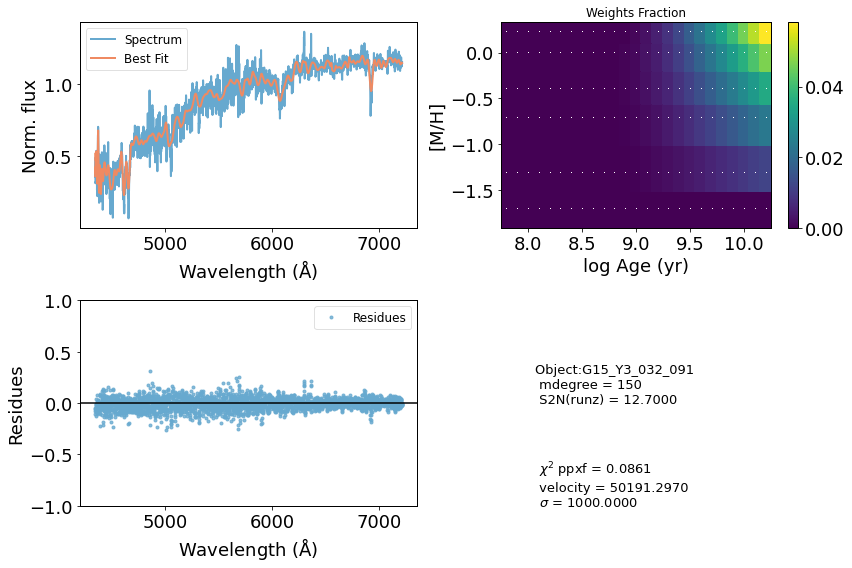

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74052      1000    -0.024     0.021
 comp.  1:     74420         1
 comp.  2:     74662       117
Gas Reddening E(B-V): 1.083
chi2/DOF: 0.02123
method = capfit; Jac calls: 12; Func calls: 1923; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9553       1.5   74420     1
Comp:  2       Unknown     0.3289       3.6   74662   117
Comp:  2       Unknown      1.811       3.7   74662   117
Comp:  2       Unknown          0       2.9   74662   117
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.546
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.546
M/L_r: 2.017
Current $\chi^2$: 0.0212
Elapsed time in PPXF: 13.81 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


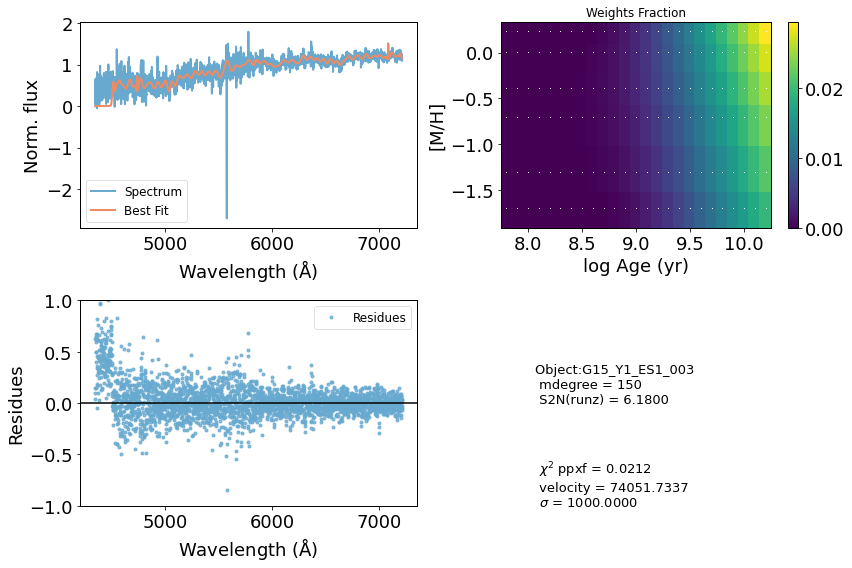

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34854       180     0.000     0.000
 comp.  1:     34854       180
 comp.  2:     34854       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3746
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  56 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.537       4.1   34854   180
Comp:  2       Unknown          0       4.2   34854   180
Comp:  2       Unknown   0.006623       3.2   34854   180
Comp:  2       Unknown      1.034       2.5   34854   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: -0.198
M/L_r: 3.275
Current $\chi^2$: 0.3746
Elapsed time in PPXF: 1.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


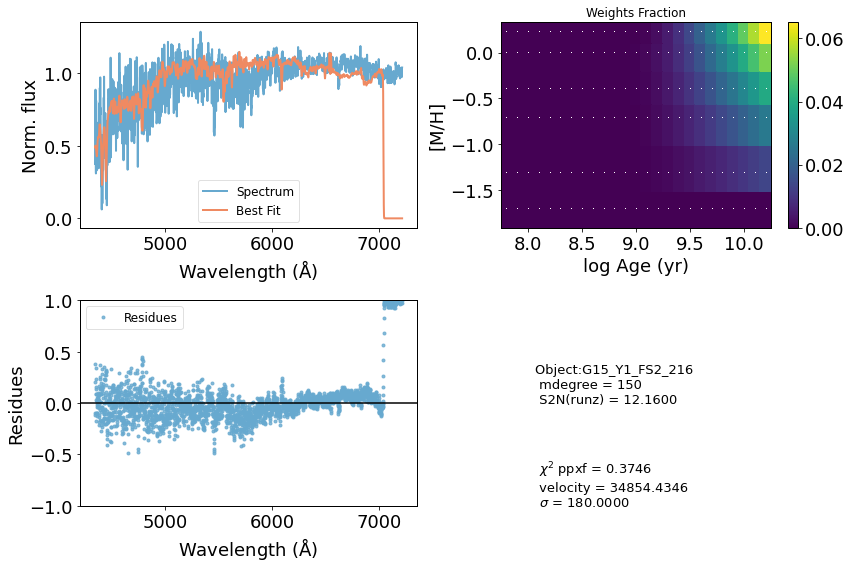

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62989       977    -0.030    -0.206
 comp.  1:     64420        31
 comp.  2:     64478       222
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005053
method = capfit; Jac calls: 13; Func calls: 2083; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  73 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2044       2.1   64420    31
Comp:  2       Unknown          0       8.8   64478   222
Comp:  2       Unknown          0       8.7   64478   222
Comp:  2       Unknown      3.373       5.3   64478   222
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.252
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.252
M/L_r: 2.477
Current $\chi^2$: 0.0051
Elapsed time in PPXF: 14.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


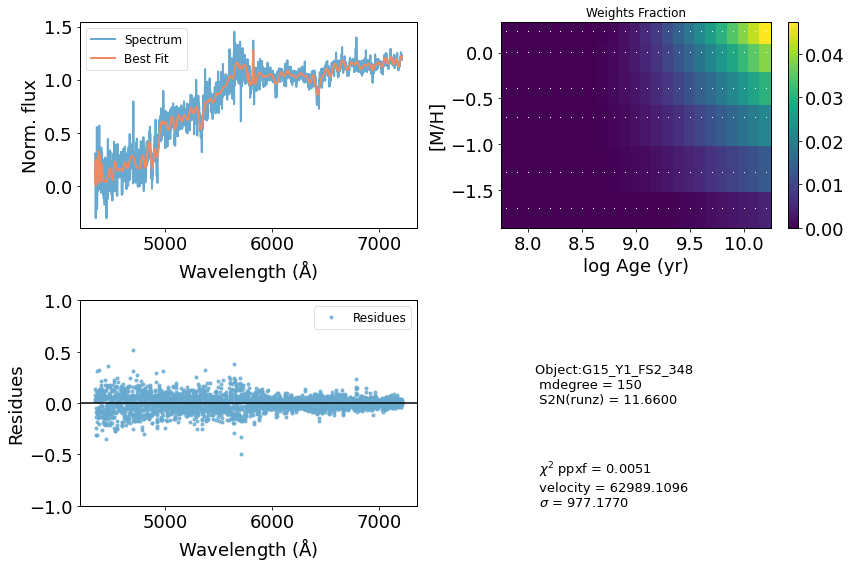

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29841       180     0.000     0.000
 comp.  1:     29841       180
 comp.  2:     29841       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.4848
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  63 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.468       3.6   29841   180
Comp:  2       Unknown     0.1834       4.1   29841   180
Comp:  2       Unknown      1.734       3.1   29841   180
Comp:  2       Unknown          0       2.2   29841   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.225
Weighted <logAge> [yr]: 9.88
Weighted <[M/H]>: -0.225
M/L_r: 3.002
Current $\chi^2$: 0.4848
Elapsed time in PPXF: 1.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


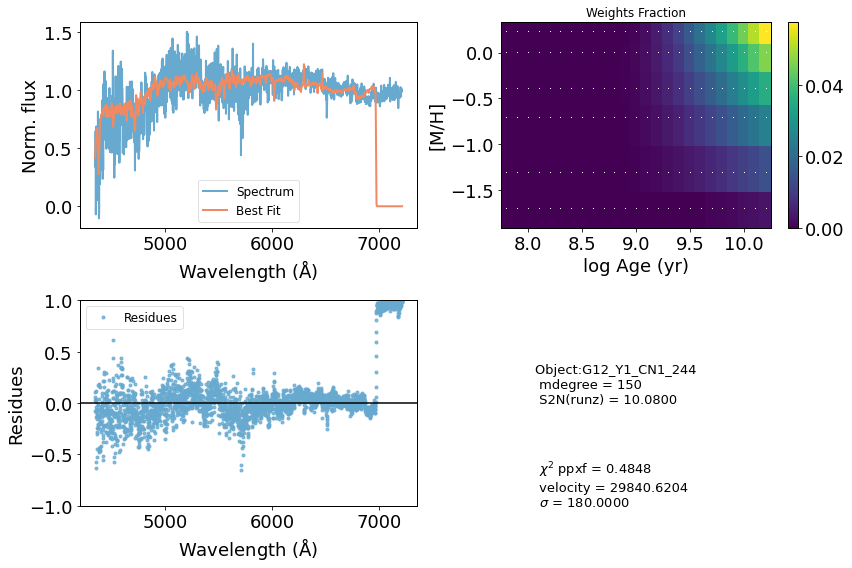

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72763      1000    -0.060     0.041
 comp.  1:     72582        83
 comp.  2:     72644       217
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009782
method = capfit; Jac calls: 14; Func calls: 2243; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  82 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5897       3.3   72582    83
Comp:  2       Unknown      1.241       6.3   72644   217
Comp:  2       Unknown          0       6.3   72644   217
Comp:  2       Unknown     0.8842       4.4   72644   217
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.293
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.293
M/L_r: 2.145
Current $\chi^2$: 0.0098
Elapsed time in PPXF: 15.27 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


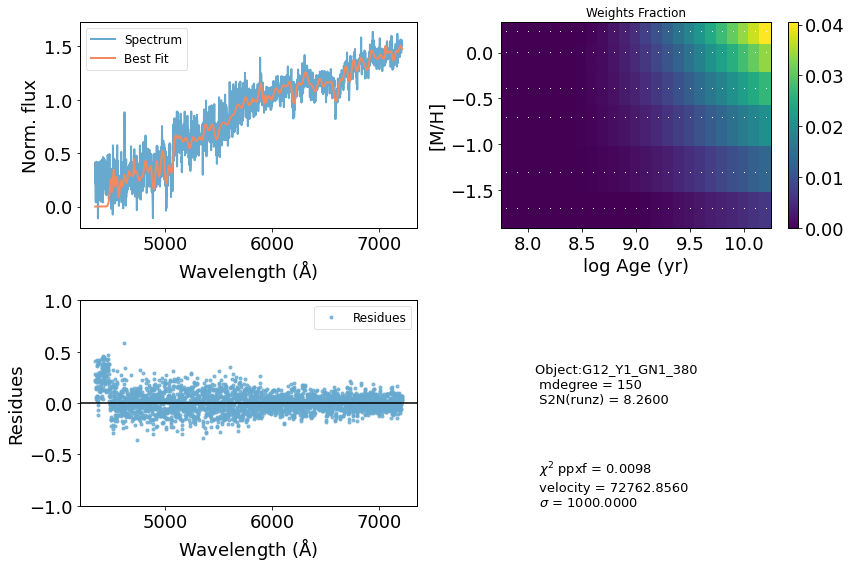

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43111      1000     0.300     0.300
 comp.  1:     41187       429
 comp.  2:     41031       162
Gas Reddening E(B-V): 6.808
chi2/DOF: 0.211
method = capfit; Jac calls: 16; Func calls: 2567; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.8   41187   429
Comp:  2       Unknown      0.864       3.9   41031   162
Comp:  2       Unknown      0.552       2.5   41031   162
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
M/L_r: 2.866
Current $\chi^2$: 0.2110
Elapsed time in PPXF: 17.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


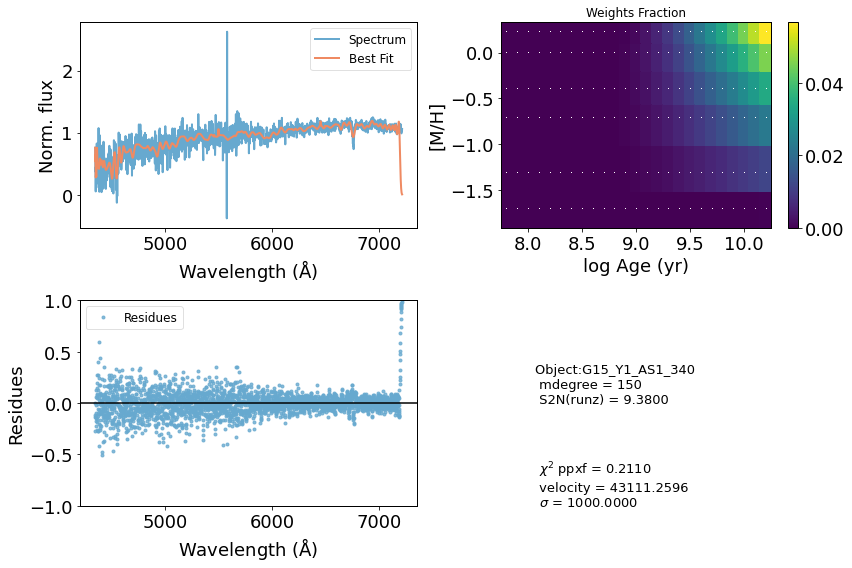

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64458      1000    -0.086     0.085
 comp.  1:     65687        53
 comp.  2:     65924       502
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006006
method = capfit; Jac calls: 15; Func calls: 2404; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2319         3   65687    53
Comp:  2       Unknown          0        18   65924   502
Comp:  2       Unknown     0.1763        18   65924   502
Comp:  2       Unknown      4.148       7.1   65924   502
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.321
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.321
M/L_r: 2.304
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 17.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


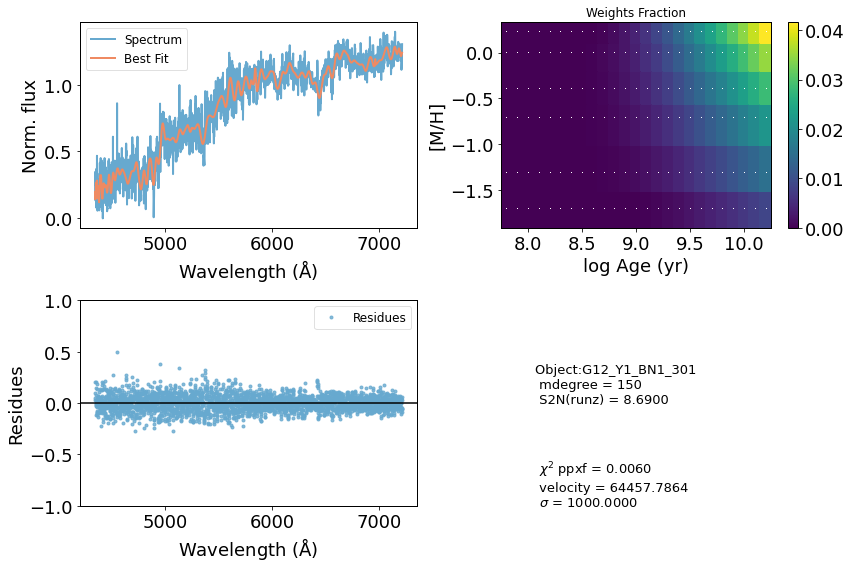

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46986      1000     0.143     0.229
 comp.  1:     45258        63
 comp.  2:     45616       377
Gas Reddening E(B-V): 2.313
chi2/DOF: 0.1287
method = capfit; Jac calls: 50; Func calls: 8006; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.843       1.6   45258    63
Comp:  2       Unknown          0       6.2   45616   377
Comp:  2       Unknown      2.941       4.3   45616   377
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.817
Current $\chi^2$: 0.1287
Elapsed time in PPXF: 55.10 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


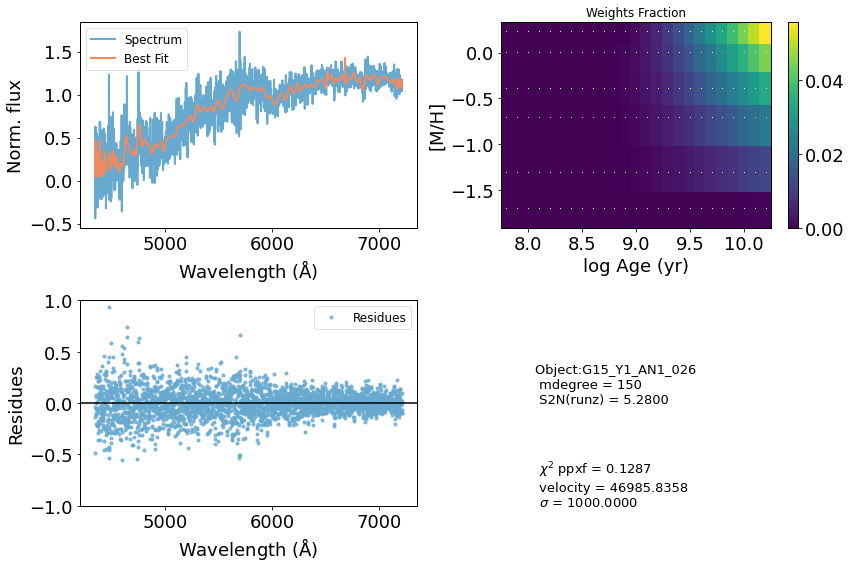

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49107      1000     0.300     0.300
 comp.  1:     46424       392
 comp.  2:     46769       142
Gas Reddening E(B-V): 0.006
chi2/DOF: 0.08218
method = capfit; Jac calls: 22; Func calls: 3524; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.033       6.2   46424   392
Comp:  2       Unknown          0       4.8   46769   142
Comp:  2       Unknown          0       5.1   46769   142
Comp:  2       Unknown          0       6.9   46769   142
Comp:  2       Unknown     0.2565       2.6   46769   142
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.197
M/L_r: 2.848
Current $\chi^2$: 0.0822
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


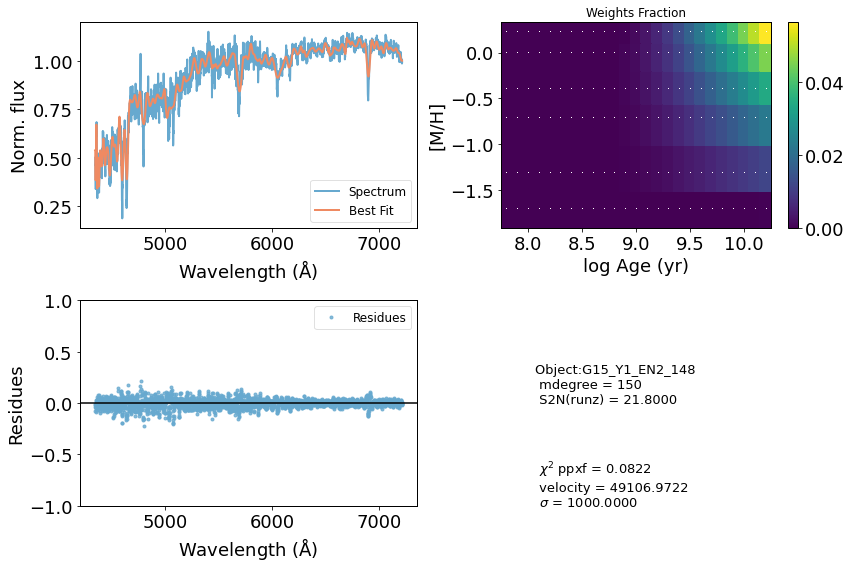

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36088       180     0.000     0.000
 comp.  1:     36088       180
 comp.  2:     36088       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3475
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  65 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.025       3.8   36088   180
Comp:  2       Unknown      1.605       4.1   36088   180
Comp:  2       Unknown     0.3365       2.7   36088   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.257
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: -0.257
M/L_r: 3.041
Current $\chi^2$: 0.3475
Elapsed time in PPXF: 1.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


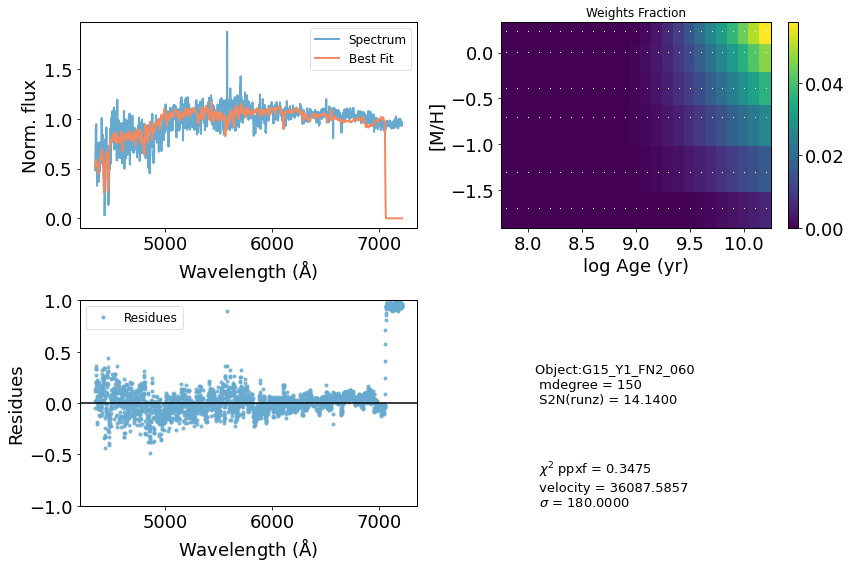

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36932       180     0.000     0.000
 comp.  1:     36932       180
 comp.  2:     36932       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.2677
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  57 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.326         4   36932   180
Comp:  2       Unknown      0.942       4.1   36932   180
Comp:  2       Unknown       0.38       2.6   36932   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.208
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.208
M/L_r: 3.235
Current $\chi^2$: 0.2677
Elapsed time in PPXF: 1.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


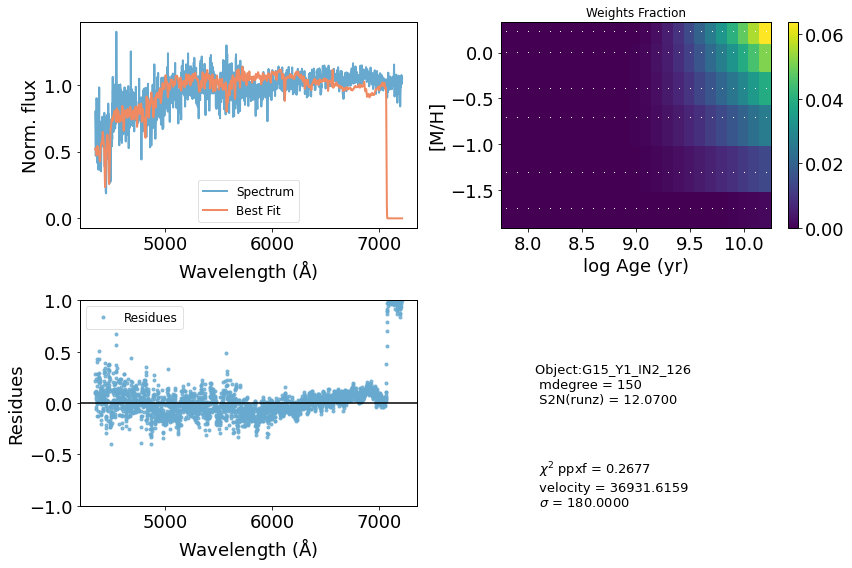

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44519      1000     0.300     0.300
 comp.  1:     43115       341
 comp.  2:     42746       365
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.2227
method = capfit; Jac calls: 17; Func calls: 2723; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.5   43115   341
Comp:  2       Unknown      1.937       5.4   42746   365
Comp:  2       Unknown          0       3.8   42746   365
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.197
M/L_r: 2.962
Current $\chi^2$: 0.2227
Elapsed time in PPXF: 18.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


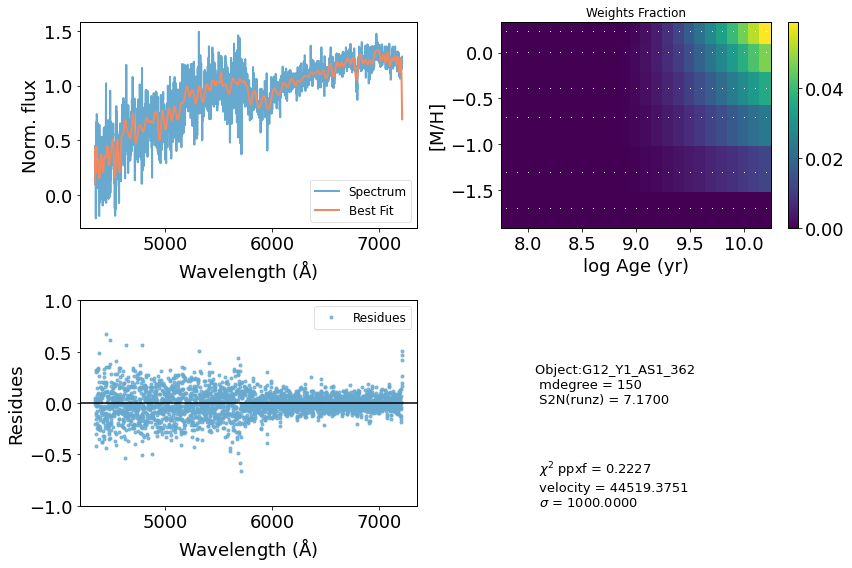

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38473       180     0.000     0.000
 comp.  1:     38473       180
 comp.  2:     38473       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.3815
method = capfit; Jac calls: 1; Func calls: 170; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  59 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.205       3.4   38473   180
Comp:  2       Unknown     0.8633       4.2   38473   180
Comp:  2       Unknown     0.7395       2.4   38473   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: -0.201
M/L_r: 3.204
Current $\chi^2$: 0.3815
Elapsed time in PPXF: 1.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


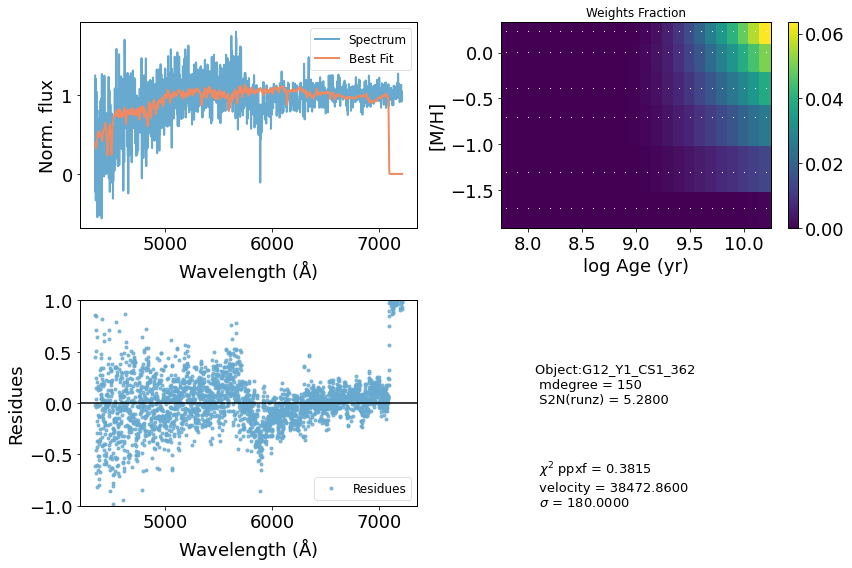

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35833      1000     0.284     0.300
 comp.  1:     34585       636
 comp.  2:     34143       105
Gas Reddening E(B-V): 7.219
chi2/DOF: 0.3637
method = capfit; Jac calls: 30; Func calls: 4805; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.417       4.5   34585   636
Comp:  2       Unknown     0.1919         3   34143   105
Comp:  2       Unknown     0.4491       2.4   34143   105
Comp:  2       Unknown    0.08388       2.3   34143   105
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.197
M/L_r: 2.916
Current $\chi^2$: 0.3637
Elapsed time in PPXF: 32.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


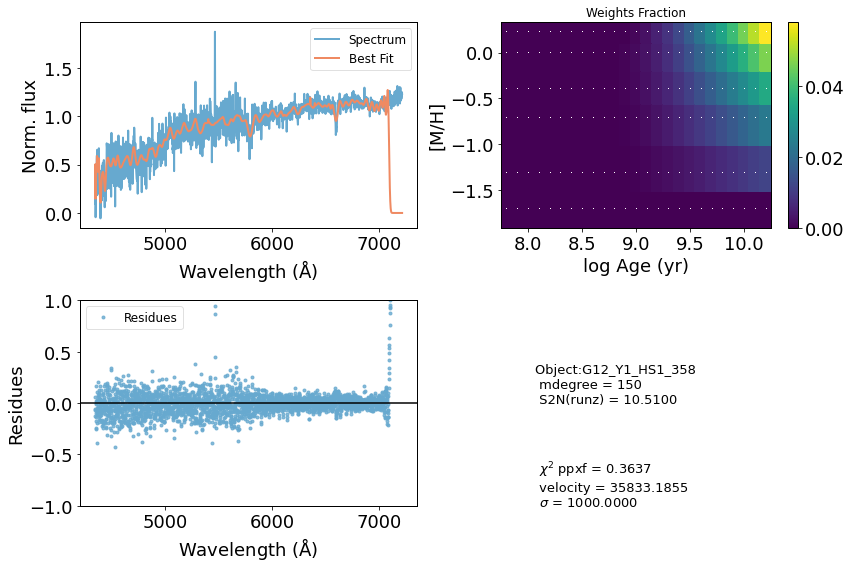

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48984      1000     0.300     0.300
 comp.  1:     47085       340
 comp.  2:     47375        79
Gas Reddening E(B-V): 1.261
chi2/DOF: 0.09572
method = capfit; Jac calls: 20; Func calls: 3204; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  55 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.3   47085   340
Comp:  2       Unknown          0       5.6   47375    79
Comp:  2       Unknown          0       5.4   47375    79
Comp:  2       Unknown     0.1587       3.2   47375    79
Comp:  2       Unknown          0       1.7   47375    79
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.2
M/L_r: 2.829
Current $\chi^2$: 0.0957
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


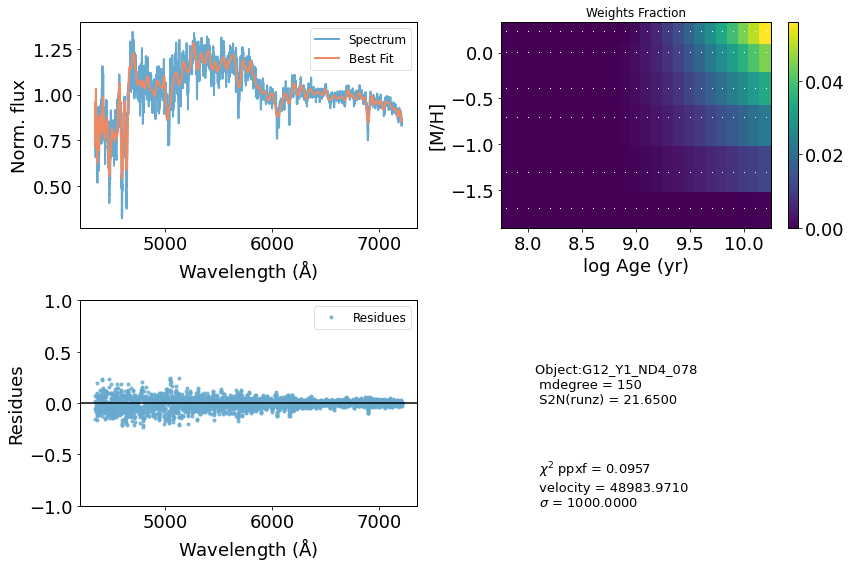

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59879      1000     0.011     0.044
 comp.  1:     58485        91
 comp.  2:     57386        35
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01496
method = capfit; Jac calls: 21; Func calls: 3368; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  78 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.9   58485    91
Comp:  2       Unknown      1.105       5.2   57386    35
Comp:  2       Unknown          0       5.2   57386    35
Comp:  2       Unknown     0.9197       3.6   57386    35
---------------------------------------------------------
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.335
Weighted <logAge> [yr]: 9.8
Weighted <[M/H]>: -0.335
M/L_r: 2.329
Current $\chi^2$: 0.0150
Elapsed time in PPXF: 21.33 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


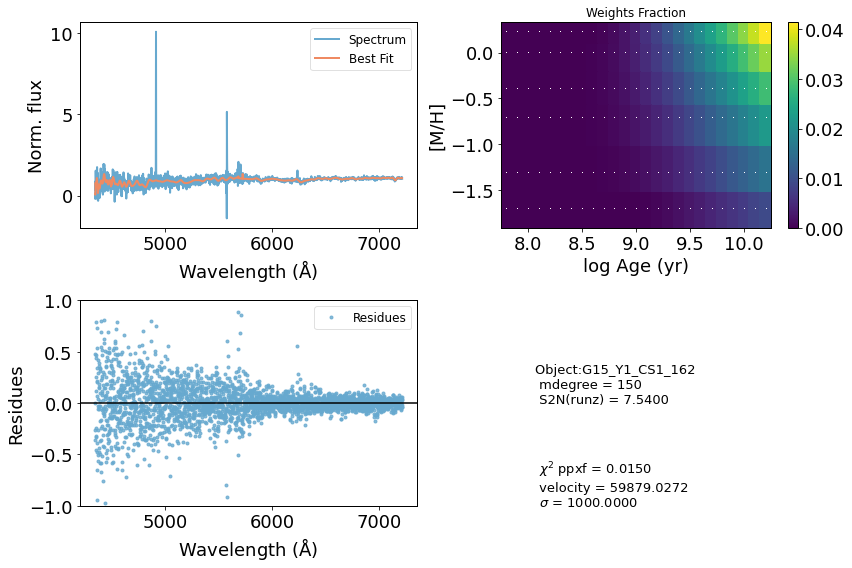

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42473      1000     0.300     0.300
 comp.  1:     41098        18
 comp.  2:     40590       148
Gas Reddening E(B-V): 0.156
chi2/DOF: 0.1733
method = capfit; Jac calls: 16; Func calls: 2566; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1423       1.8   41098    18
Comp:  2       Unknown          0       3.8   40590   148
Comp:  2       Unknown          0       2.3   40590   148
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.84
Current $\chi^2$: 0.1733
Elapsed time in PPXF: 16.27 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


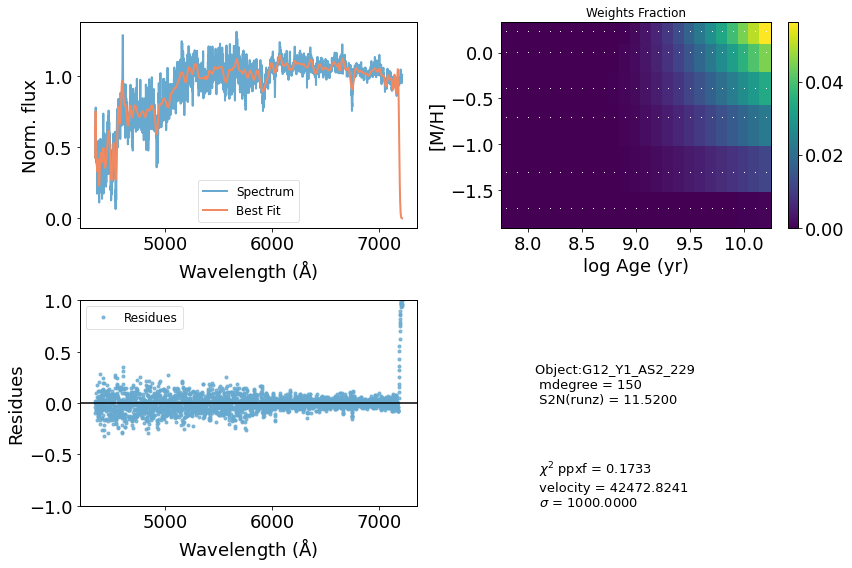

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     69282      1000    -0.197     0.162
 comp.  1:     71711       615
 comp.  2:     71102         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005998
method = capfit; Jac calls: 73; Func calls: 11684; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  84 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.208       8.2   71711   615
Comp:  2       Unknown          0       2.3   71102     1
Comp:  2       Unknown      0.423       2.4   71102     1
Comp:  2       Unknown          0       2.2   71102     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.854
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.854
M/L_r: 1.186
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 81.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


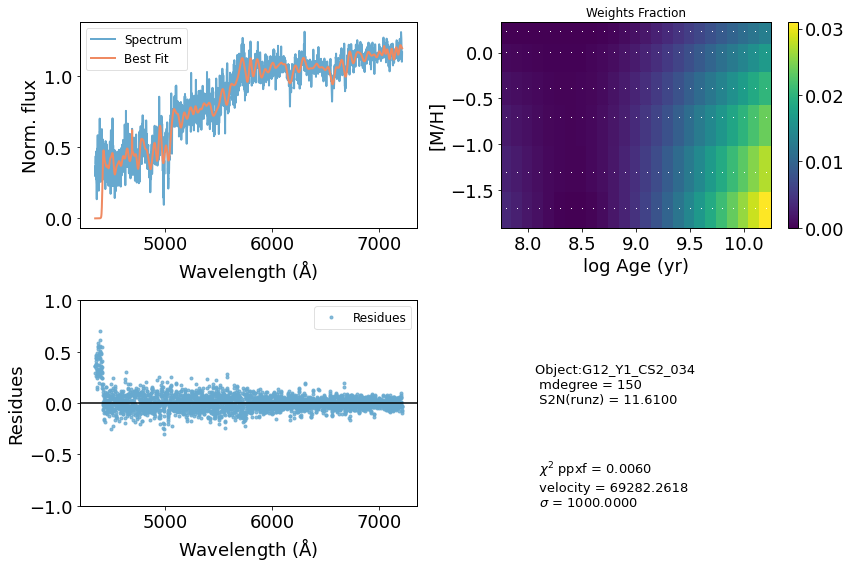

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40035      1000     0.300     0.300
 comp.  1:     37982       123
 comp.  2:     37844       270
Gas Reddening E(B-V): 4.130
chi2/DOF: 0.1639
method = capfit; Jac calls: 17; Func calls: 2726; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3785       2.1   37982   123
Comp:  2       Unknown      1.053         5   37844   270
Comp:  2       Unknown      1.238       3.5   37844   270
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.198
M/L_r: 2.856
Current $\chi^2$: 0.1639
Elapsed time in PPXF: 22.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


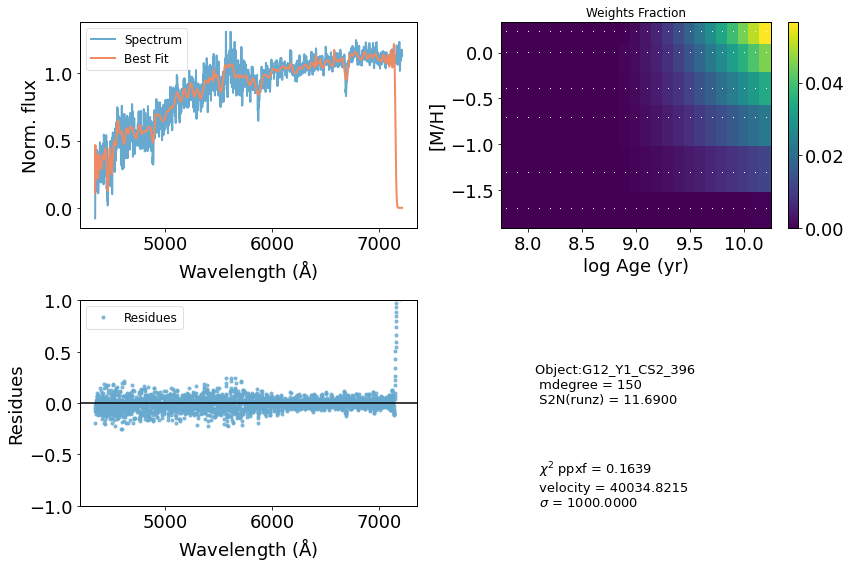

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50117      1000     0.300     0.300
 comp.  1:     47777        51
 comp.  2:     48311        72
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.08026
method = capfit; Jac calls: 17; Func calls: 2726; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  61 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4676       2.5   47777    51
Comp:  2       Unknown      1.287       3.9   48311    72
Comp:  2       Unknown      2.562       3.9   48311    72
Comp:  2       Unknown          0       3.2   48311    72
Comp:  2       Unknown          0       1.9   48311    72
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: -0.196
M/L_r: 2.895
Current $\chi^2$: 0.0803
Ela

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


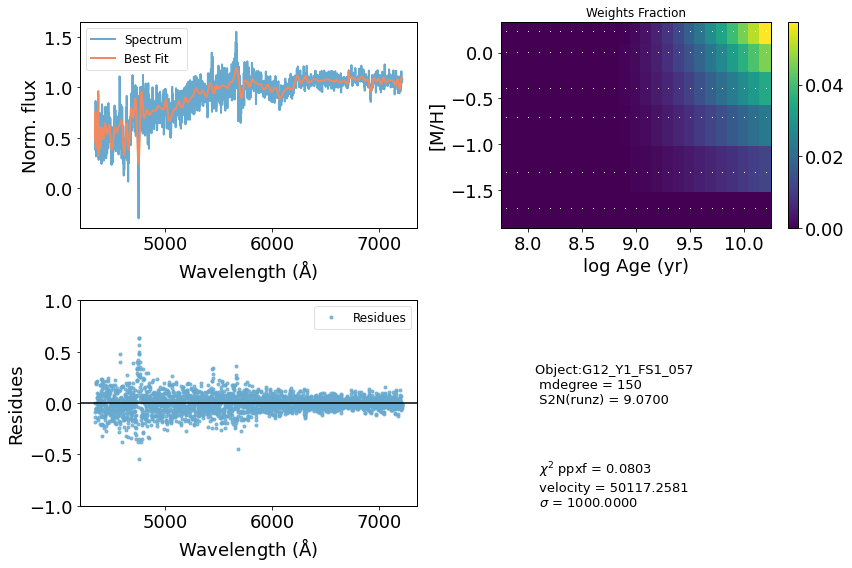

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36929      1000     0.253     0.300
 comp.  1:     35405        94
 comp.  2:     35154         2
Gas Reddening E(B-V): 1.942
chi2/DOF: 0.2579
method = capfit; Jac calls: 16; Func calls: 2566; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  41 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1348       1.8   35405    94
Comp:  2       Unknown          0       2.1   35154     2
Comp:  2       Unknown    0.05262       1.4   35154     2
Comp:  2       Unknown   0.008061       1.4   35154     2
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.201
M/L_r: 2.789
Current $\chi^2$: 0.2579
Elapsed time in PPXF: 21.37 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


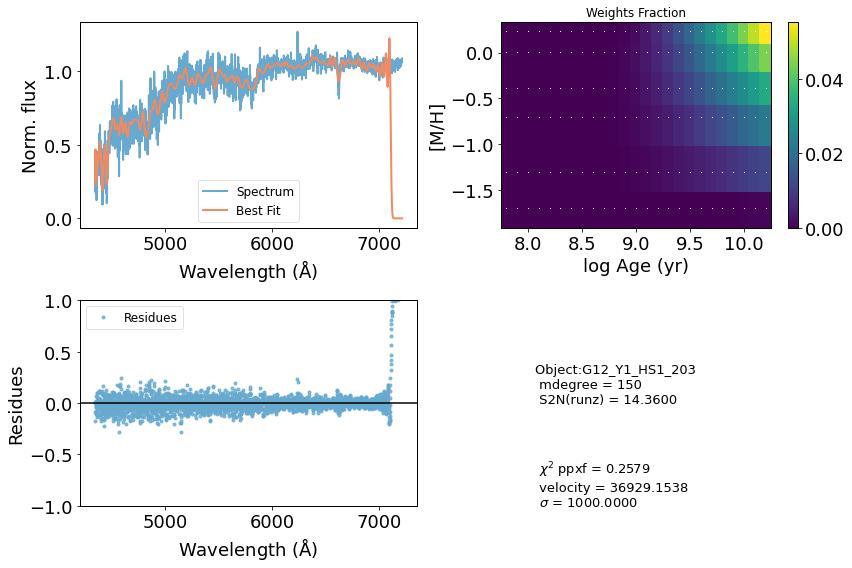

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53338      1000     0.300     0.300
 comp.  1:     50793       444
 comp.  2:     51491       162
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.06027
method = capfit; Jac calls: 16; Func calls: 2565; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       3.15       5.5   50793   444
Comp:  2       Unknown          0       7.2   51491   162
Comp:  2       Unknown      2.928       7.3   51491   162
Comp:  2       Unknown     0.5714       4.5   51491   162
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.196
M/L_r: 2.943
Current $\chi^2$: 0.0603
Elapsed time in PPXF: 19.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


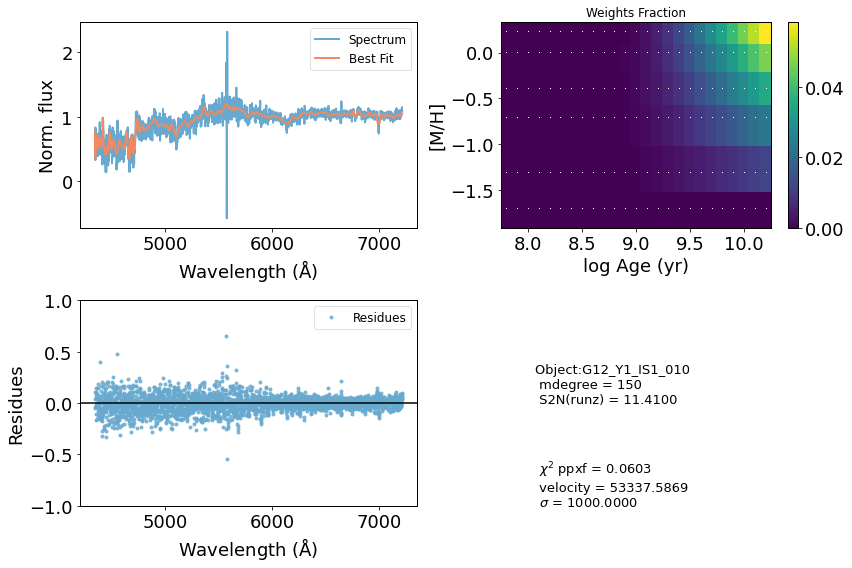

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40673      1000     0.300     0.300
 comp.  1:     38819       232
 comp.  2:     38728        34
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.1315
method = capfit; Jac calls: 16; Func calls: 2568; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.3   38819   232
Comp:  2       Unknown          0       2.4   38728    34
Comp:  2       Unknown     0.4098       1.9   38728    34
---------------------------------------------------------
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.85
Weighted <[M/H]>: -0.199
M/L_r: 2.828
Current $\chi^2$: 0.1315
Elapsed time in PPXF: 17.47 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


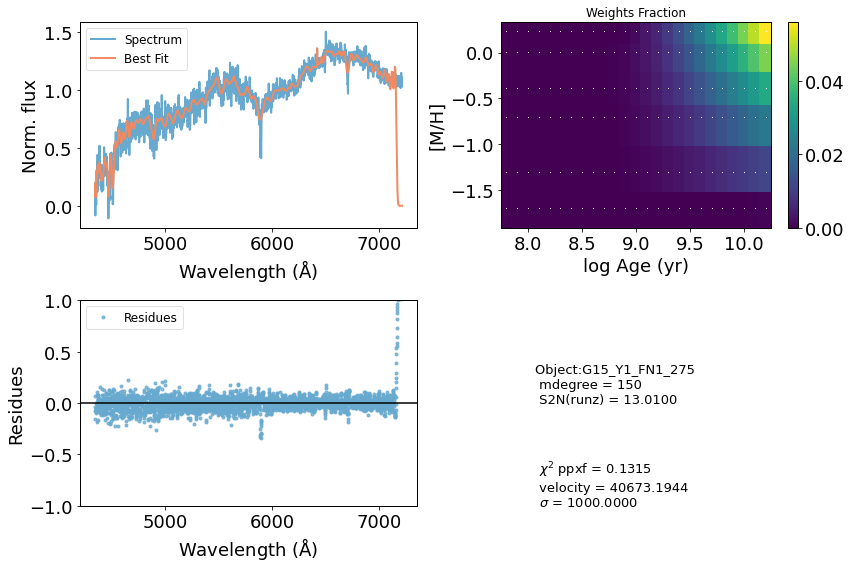

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     76658      1000    -0.071     0.052
 comp.  1:     76920       441
 comp.  2:     77135       585
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008439
method = capfit; Jac calls: 14; Func calls: 2245; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  75 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       5.8   76920   441
Comp:  2       Unknown      5.341        27   77135   585
Comp:  2       Unknown     0.4313        27   77135   585
Comp:  2       Unknown          0       6.3   77135   585
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.583
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.583
M/L_r: 1.982
Current $\chi^2$: 0.0084
Elapsed time in PPXF: 15.77 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


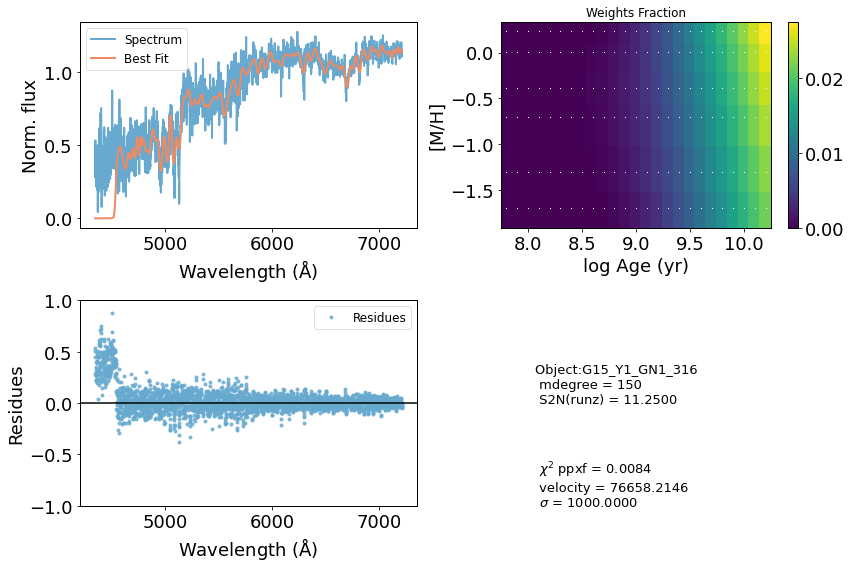

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52077       506    -0.002     0.006
 comp.  1:     51643       457
 comp.  2:     51929       154
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.0846
method = capfit; Jac calls: 9; Func calls: 1446; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  64 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.242       6.8   51643   457
Comp:  2       Unknown       1.34       5.8   51929   154
Comp:  2       Unknown      1.358       5.8   51929   154
Comp:  2       Unknown          0       4.2   51929   154
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.203
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.203
M/L_r: 2.673
Current $\chi^2$: 0.0846
Elapsed time in PPXF: 10.24 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


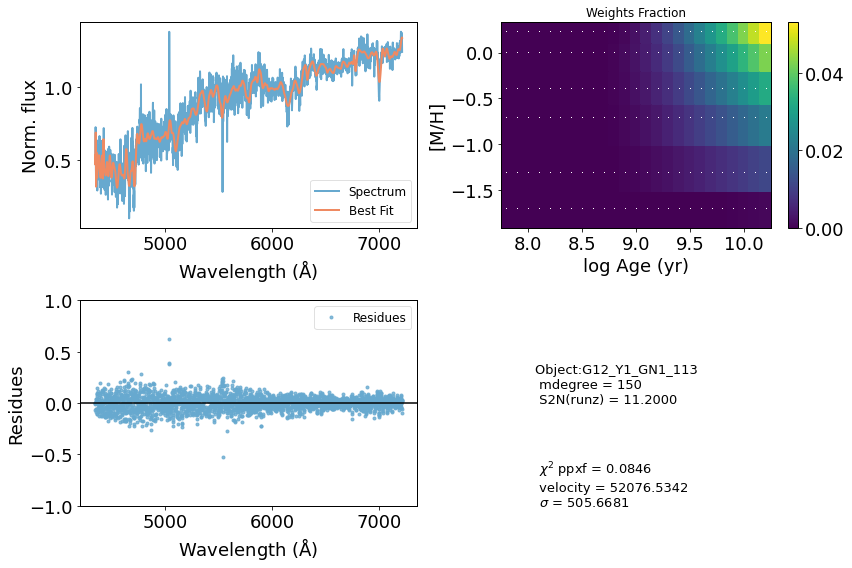

--------------------------------------------------
CPU process time: 26516340.00 [min]
--------------------------------------------------


In [21]:
start_time_all = time.time()
ids_vel = ['CATAID']
for each_sed in range(len(seds_list)):
# for each_sed in range(2):
    
    # settings for the progress bar widget above: does not influence in ppxf -------------------------------------
    bar.value += each_sed/2.                                          # signal to increment the progress bar
    if each_sed<len(seds_list): 
        bar.bar_style = ""                                            # blue when in progress
    else: 
        bar.bar_style = "success"                                     # green when it finishes        
        
    # flux -------------------------------------------------------------------------------------------------------
    sed_file  = os.path.join(seds_path, seds_list[each_sed])          # link between path and files
    sed_flux  = pf.getdata(sed_file)[0]                               # opening each spectra
    sed_err   = pf.getdata(sed_file)[1]                               # opening each spectra error
    
    # wavelength -------------------------------------------------------------------------------------------------
    sed_header = pf.open(sed_file)[0].header
    sed_wl_ini = sed_header['WMIN'] 
    sed_wl_stp = sed_header['CD1_1']
    sed_wl     = np.arange(sed_flux.size)*(sed_wl_stp)+sed_wl_ini     # sed wavelength    
#     plot_sed(sed_wl, sed_flux, sed_err)
    
    # cleaning flux and wavelength trash -------------------------------------------------------------------------
    idx_clean       = np.where((np.logical_not(np.isnan(sed_flux)))*(sed_err>0)) # indices where NAN is present
    flux_temp       = sed_flux[idx_clean]                                   # removing NAN values from spectra
    flux_temp_err   = sed_err[idx_clean]
    wavelength_temp = sed_wl[idx_clean]    
#     plot_sed(wavelength_temp, flux_temp, flux_temp_err)
    
    # limiting the spectrum regarding the wavelength range of the library ----------------------------------------
    wl_lib_idx = (wavelength_temp>wl_min) & (wavelength_temp<wl_max)       # MILES wavelength range
    flux       = flux_temp[wl_lib_idx]
    flux_err   = flux_temp_err[wl_lib_idx]
    wavelength = wavelength_temp[wl_lib_idx]    
#     plot_sed(wavelength, flux, flux_err)    
    
    # other important parameters ---------------------------------------------------------------------------------
    redshift  = sed_header['Z']
    cataid    = sed_header['CATAID']
#     fwhm_gama = wavelength*gama_resol
    fwhm_gama = 2.
    
    # ppxf -------------------------------------------------------------------------------------------------------
    vel_scale          = light_speed*np.log(wavelength[1]/wavelength[0])      # velocity scale - 
                                                                              # Eq.8 Capellari 2017
    
    ### setup templates ------------------------------------------------------------------------------------------
    #### stellar pops --------------------------------------------------------------------------------------------
    miles              = lib.miles(miles_lib, vel_scale, fwhm_gama)
    stellar_templates  = miles.templates.reshape(miles.templates.shape[0], -1)
    reg_dim            = miles.templates.shape[1:]
    dv                 = light_speed*(miles.log_lam_temp[0] - np.log(wavelength[0])) # eq.(8) of Cappellari (2017)
    vel                = light_speed*np.log(1 + redshift)                            # eq.(8) of Cappellari (2017)
    start              = [vel, 180.]
    
    #### gas templates -------------------------------------------------------------------------------------------
    wl_range_galaxy = np.array([np.min(wavelength), np.max(wavelength)])/(1 + redshift)
    gas_templates, gas_names, line_wave = util.emission_lines(miles.log_lam_temp, wl_range_galaxy, fwhm_gama, 
                                                              tie_balmer=tied_balmer, 
                                                              limit_doublets=limit_doublets)
    number_of_templates = stellar_templates.shape[1]
    number_of_forbidden = np.sum(["[" in a for a in gas_names])                 # forbidden lines contain "[*]"
    number_of_balmer    = len(gas_names) - number_of_forbidden
        
    component = (stellar_comp_w*number_of_templates)+(balmer_comp_w*number_of_balmer)+(forbid_comp_w
                                                                                       *number_of_forbidden)
        
    gas_component = np.array(component) > 0       # gas_component=True for gas templates
    start3        = [start, start, start]         # adopt the same starting value for the 3 components
    gas_reddening = 0 if tied_balmer else None  # If the Balmer lines are tied one should allow for gas reddening.
    
    
    #### all templates -------------------------------------------------------------------------------------------
    all_templates = np.column_stack([stellar_templates, gas_templates])
    
    ### rebinning the spectrum so it is at the same size as the templates (or smaller) ---------------------------
    new_shape          = stellar_templates[:,0].shape
    rebinning_function = sci.interp1d(wavelength, flux)   # for the flux
    wavelength_rebin   = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_rebin         = rebinning_function(wavelength_rebin)
    
    ### rebinning the error --------------------------------------------------------------------------------------
    rebin_func_error   = sci.interp1d(wavelength, flux_err)
    wl_rebin_error     = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_err_rebin     = rebin_func_error(wavelength_rebin)
    
    ### final galaxy spectrum and its error to be analysed -------------------------------------------------------
    galaxy             = flux_rebin/np.median(flux_rebin)           # Normalize spectrum to avoid numerical issues
    noise              = flux_err_rebin/np.median(flux_err_rebin)       # idem
    
#     plot_sed(wavelength_rebin, galaxy, noise)    
    
    ### SED FITTING WITH PPXF ------------------------------------------------------------------------------------
    start_time = time.clock()
    sed_fit = ppxf(templates=all_templates, galaxy=galaxy, noise=noise, velscale=vel_scale, start=start3, 
                   plot=False, lam=wavelength_rebin, moments=moments, degree=degree, mdegree=mdegree, 
                   regul=1./regul_err, 
                   reg_dim=reg_dim, vsyst=dv, clean=False, component=component, 
                   gas_component=gas_component, gas_reddening=gas_reddening, 
#                    bounds=bounds_gas
                  )
    end_time = time.clock()
    
    ## output parameters -- most of them will become a dataframe at the end of the script  
    residues = (galaxy-sed_fit.bestfit)
    
    stellar_weights = sed_fit.weights[~gas_component]                       # Exclude weights of the gas templates
    stellar_weights = stellar_weights.reshape(reg_dim)/stellar_weights.sum()  # Normalized
    
    velocity = sed_fit.sol[0][0]
    sigma    = sed_fit.sol[0][1]
    
    mean_age.append(miles.mean_age_metal(stellar_weights)[0])
    mean_metal.append(miles.mean_age_metal(stellar_weights)[1])
    mass2light.append(miles.mass_to_light(stellar_weights, band="r"))
    ids.append(cataid)
    redshifts.append(redshift)
    
    ###################### SAVING DATAFRAME WITH FIT OUTPUTS ###################
    outputs_line = [cataid, sigma, sed_fit.chi2, velocity, mean_age, mean_metal, mass2light]
    if each_sed==0:
        outputs_physical = np.array(outputs_line)
    else:
        outputs_physical = np.vstack((outputs_physical, np.array(outputs_line)))
    #############################################################################
    
       
    print(r"Current $\chi^2$: %.4f" % (sed_fit.chi2))
    print('Elapsed time in PPXF: %.2f [min]' % ((end_time-start_time)/60))
    
    
    ### Saving fit results ---------------------------------------------------------------------------------------
    output = {}
    output['wavelength'] = wavelength_rebin
    output['flux']       = sed_fit.galaxy
    output['best_fit']   = sed_fit.bestfit
    
    output_df = pd.DataFrame(output)
    output_df.to_csv(os.path.join(results_path, 'fit_'+str(cataid)+'_d'+ str(degree)+'_'+str(mdegree)+
                                  '_'+str(wl_min) +'.csv'), index=False)
    vel_disp.append(sigma)
    ids_vel.append(cataid)

    ### Saving plots ---------------------------------------------------------------------------------------------
    plt.subplots(figsize=(12,8))
    
    #### plot01 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,1)
    plt.plot(wavelength_rebin[:-200], sed_fit.galaxy[:-200], '-', color=palette[-1], linewidth=lw, 
             label="Spectrum")
    plt.plot(wavelength_rebin[:-200], sed_fit.bestfit[:-200], '-', color=palette[0], linewidth=lw, 
             label="Best Fit")
#     plt.title("Object %s: S/N=%.4f" % (cataid, s2n_top10[each_sed]))
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Norm. flux")
    
    #### plot02 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,2)
    miles.plot(stellar_weights)
    
    #### plot03 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,3)
    plt.plot(wavelength_rebin[:-200], residues[:-200], '.', color=palette[-1], linewidth=lw, label="Residues", 
             alpha=transparency)
    plt.axhline(y=0, c='black')
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Residues")
    plt.ylim([-1,1])
    
    #### plot04 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,4)
    plt.text(0.1, 0.5, "Object:{:s} \n mdegree = {:d} \n S2N(runz) = {:.4f}".format(sed_header['SPECID'], mdegree,
                    sed_header['SN']), fontsize=13)
             
             
    plt.text(0.1, 0.0, " \n $\chi^2$ ppxf = {:.4f} \n velocity = {:.4f} \n $\sigma$ = {:.4f}".
             format(sed_fit.chi2, velocity, sigma), fontsize=13)
    plt.axis('off') 
    figname = 'gal_'+str(cataid)+'_d'+str(degree)+'_m'+str(mdegree)+'_'+str(wl_min)
    plt.tight_layout()
    plt.savefig(os.path.join(results_path, figname +'.png'))
    plt.savefig(os.path.join(results_path, figname +'.pdf'))
    plt.show()

outputs_physical = pd.DataFrame(outputs_physical)
outputs_physical.columns = outputs_physical_header

# sigma_data = np.column_stack([ids_vel, vel_disp])
# sigma_data = pd.DataFrame(sigma_data)
outputs_physical.to_csv(results_path +'parameters_d'+str(degree)+ '_m'+str(mdegree)+'.csv', index=False)
end_time_all = time.time()
print_time(start_time_all, end_time_all)